<a href="https://colab.research.google.com/github/isimisimisola/ML_stock_prediction/blob/main/Project_Submission_50_Stocks_Prediction_Model_16th_May.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Table of contents:


1.0 Business Problem

2.0 Preparing Dev Environment and Importing Libraries

3.0 Data Preparation

4.0 Train-test Data Split

5.0 Exploratory Data Analysis

6.0 Data Preprocessing - Cleaning and Transformation

7.0 Conclusion

8.0 Data Exporting


# 2.0 Preparing Dev Environment and Importing Libraries

In [1]:
# setting logging to print only error messages from Sklearnex
import logging
import time
logging.basicConfig()
logging.getLogger("SKLEARNEX").setLevel(logging.ERROR)

!pip install prophet

!pip install imblearn
#importing libraries for importing data and data computation
import pandas as pd
import numpy as np
import seaborn as sns
#importing library for data visualisation
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings(action='ignore')
#importing libraries to carry out data cleaning and transformation
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Modules and Libraries Importation
import statsmodels.api as sm
from sklearn.exceptions import ConvergenceWarning
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, precision_recall_fscore_support
import matplotlib.pyplot as plt
from sklearn.base import TransformerMixin, BaseEstimator
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier
from warnings import filterwarnings

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_absolute_error as mae
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from prophet import Prophet

!pip install tensorflow

from google.colab import drive
drive.mount('/content/drive')



filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Mounted at /content/drive


In [2]:
import seaborn as sns

# Define the nine colors as a list of RGB values
teal = (0/255, 128/255, 128/255)
verdigris = (53/255, 181/255, 172/255)
middle_blue_green = (137/255, 213/255, 210/255)
pale_blue = (187/255, 241/255, 241/255)
rosy_brown = (192/255, 149/255, 145/255)
deep_puce = (168/255, 101/255, 97/255)
deep_carmine_pink = (203/255, 65/255, 84/255)
dark_cyan = (18/255, 148/255, 144/255)
navy_blue = (0/255, 0/255, 128/255)
dark_blue = (19/255, 53/255, 105/255)
Green =(194/255, 218/255, 206/255)
crane = (229/255, 222/255, 210/255)
hibiscus = (231/255, 185/255, 180/255)

# Create a color palette using the ten colors
custom_palette = sns.color_palette([navy_blue, dark_blue, teal, verdigris, middle_blue_green, pale_blue,Green,crane,hibiscus, rosy_brown, deep_puce, deep_carmine_pink, dark_cyan])
custom_palette_bar = sns.color_palette([navy_blue, verdigris, crane])

# Set the color palette as the default for all visualizations  
sns.set_palette(custom_palette)



In [3]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

import pandas as pd

# Disable exponentiation of values in pandas
pd.set_option('display.float_format', lambda x: f'{x:.2f}')







# 3.0 - Data Preparation

In [4]:
#Load datasets
stocks_df = pd.read_excel("/content/drive/My Drive/StockData Merged & Final for EDA.xlsx")
stocks_df.head()


,Date,Open,High,Low,Previous Day Price,Close,Adj Close,Volume,Ticker,Price Change,Company Name,Market Capitalization,Industry,Sector,cashAndCashEquivalents,netReceivables,inventory,totalCurrentAssets,propertyPlantEquipmentNet,goodwill,totalNonCurrentAssets,totalAssets,accountPayables,totalCurrentLiabilities,totalLiabilities,retainedEarnings,totalEquity,totalDebt,netDebt,revenue,costOfRevenue,grossProfit,grossProfitRatio,operatingExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,netIncome,netIncomeRatio,eps,numberOfShares,marketCapitalization,minusCashAndCashEquivalents,addTotalDebt,enterpriseValue,changeInWorkingCapital,accountsReceivables,accountsPayables,debtRepayment,dividendsPaid,operatingCashFlow,capitalExpenditure,freeCashFlow,InflationRate,Federal Reserve Fund rates,Value - T,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,AvgTotScore,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),IsCovidYear,IsCovidYear2,Day,Day of Week,Column2,Year,Month,Quarter,QuarterID,MonthID,MonthYear,DateID
0,2023-03-17,156.08,156.74,154.28,155.85,155.00,155.00,98944633,AAPL,Decrease,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,17,Friday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,17/03/2023AAPL
1,2023-03-16,152.16,156.46,151.64,152.99,155.85,155.85,76254419,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,16,Thursday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,16/03/2023AAPL
2,2023-03-15,151.19,153.25,149.92,152.59,152.99,152.99,77167866,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,15,Wednesday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,15/03/2023AAPL
3,2023-03-14,151.28,153.40,150.10,150.47,152.59,152.59,73695893,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,14,Tuesday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,14/03/2023AAPL
4,2023-03-13,147.81,153.14,147.70,148.50,150.47,150.47,84457122,AAPL,Increase,Apple Inc.,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,Covid,13,Monday,March2023,2023,March,1,AAPL20231,AAPL2023March,2023-03-01,13/03/2023AAPL


In [5]:
stocks_df.shape

(64511, 94)

In [6]:
#check info of dataset, entries, no of columns, datatype etc
stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64511 entries, 0 to 64510
Data columns (total 94 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          64511 non-null  datetime64[ns]
 1   Open                          64511 non-null  float64       
 2   High                          64511 non-null  float64       
 3   Low                           64511 non-null  float64       
 4   Previous Day Price            64511 non-null  float64       
 5   Close                         64511 non-null  float64       
 6   Adj Close                     64511 non-null  float64       
 7   Volume                        64511 non-null  int64         
 8   Ticker                        64511 non-null  object        
 9   Price Change                  64511 non-null  object        
 10  Company Name                  64511 non-null  object        
 11  Market Capitalization       

In [7]:
#check for null values
stocks_df.notnull().sum()

Date                            64511
Open                            64511
High                            64511
Low                             64511
Previous Day Price              64511
Close                           64511
Adj Close                       64511
Volume                          64511
Ticker                          64511
Price Change                    64511
Company Name                    64511
Market Capitalization           64511
Industry                        64511
Sector                          64511
cashAndCashEquivalents          60063
netReceivables                  60063
inventory                       60063
totalCurrentAssets              60063
propertyPlantEquipmentNet       60063
goodwill                        60063
totalNonCurrentAssets           60063
totalAssets                     60063
accountPayables                 60063
totalCurrentLiabilities         60063
totalLiabilities                60063
retainedEarnings                60063
totalEquity 

In [8]:
# Check percentage of Nulls in each field 

(stocks_df.isnull().sum()/(len(stocks_df)))*100

Date                            0.00
Open                            0.00
High                            0.00
Low                             0.00
Previous Day Price              0.00
Close                           0.00
Adj Close                       0.00
Volume                          0.00
Ticker                          0.00
Price Change                    0.00
Company Name                    0.00
Market Capitalization           0.00
Industry                        0.00
Sector                          0.00
cashAndCashEquivalents          6.89
netReceivables                  6.89
inventory                       6.89
totalCurrentAssets              6.89
propertyPlantEquipmentNet       6.89
goodwill                        6.89
totalNonCurrentAssets           6.89
totalAssets                     6.89
accountPayables                 6.89
totalCurrentLiabilities         6.89
totalLiabilities                6.89
retainedEarnings                6.89
totalEquity                     6.89
t

In [9]:
# Data Reduction - reduce numeric columns using correlation
stocks_df.corr()

,Open,High,Low,Previous Day Price,Close,Adj Close,Volume,cashAndCashEquivalents,netReceivables,inventory,totalCurrentAssets,propertyPlantEquipmentNet,goodwill,totalNonCurrentAssets,totalAssets,accountPayables,totalCurrentLiabilities,totalLiabilities,retainedEarnings,totalEquity,totalDebt,netDebt,revenue,costOfRevenue,grossProfit,grossProfitRatio,operatingExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,netIncome,netIncomeRatio,eps,numberOfShares,marketCapitalization,minusCashAndCashEquivalents,addTotalDebt,enterpriseValue,changeInWorkingCapital,accountsReceivables,accountsPayables,debtRepayment,dividendsPaid,operatingCashFlow,capitalExpenditure,freeCashFlow,InflationRate,Federal Reserve Fund rates,Value - T,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,AvgTotScore,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),Day,Year,Quarter
Open,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.35,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.02,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
High,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.35,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.02,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.36,0.36,0.36,-0.00,0.00,-0.02
Low,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.36,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.01,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
Previous Day Price,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.01,0.04,0.05,0.11,0.13,0.00,0.07,0.01,0.03,0.09,0.01,0.04,0.08,0.02,0.02,0.10,0.10,0.08,0.01,0.08,-0.00,0.00,0.14,0.08,0.00,0.06,0.00,0.06,0.00,0.01,0.10,0.12,0.01,0.02,0.12,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.01,-0.01,-0.01,-0.00,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.36,0.36,0.36,-0.00,0.00,-0.02
Close,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.04,0.19,0.24,0.49,0.59,0.02,0.34,0.07,0.13,0.42,0.03,0.21,0.35,0.11,0.08,0.44,0.44,0.35,0.03,0.35,-0.01,0.02,0.63,0.37,0.01,0.28,0.01,0.29,0.01,0.08,0.47,0.54,0.04,0.11,0.53,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.19,0.05,-0.00,-0.01,-0.01,0.05,-0.05,-0.05,-0.01,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
Adj Close,1.00,1.00,1.00,1.00,1.00,1.00,-0.08,0.01,0.02,0.00,0.04,0.04,-0.00,0.02,0.01,0.01,0.03,0.01,0.01,0.03,0.01,-0.01,0.03,0.02,0.04,0.03,0.03,0.00,0.01,0.06,0.05,0.01,0.05,0.01,0.05,0.01,0.06,-0.01,0.08,0.01,0.01,0.08,0.03,-0.03,-0.01,-0.02,0.08,0.09,-0.18,0.05,-0.00,-0.01,-0.01,0.03,-0.01,-0.03,0.00,-0.01,-0.00,0.00,-0.01,-0.01,-0.00,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,0.00,-0.02
Volume,-0.08,-0.08,-0.08,-0.08,-0.08,-0.08,1.00,0.03,0.14,0.04,0.20,0.08,0.09,0.20,0.05,0.07,0.23,0.04,0.02,0.11,0.12,0.12,0.15,0.11,0.21,0.03,0.11,0.02,0.06,0.14,0.25,-0.00,0.27,-0.00,0.27,-0.00,0.05,0.27,0.26,0.03,0.12,0.27,0.00,-0.01,0.01,-0

In [10]:
# reduced columns 
newstocks_df= stocks_df[[
'Close','Previous Day Price','Price Change','Volume','Ticker','Market Capitalization','Industry','Sector','netReceivables',
'inventory','propertyPlantEquipmentNet','totalCurrentAssets','totalLiabilities','totalEquity','totalDebt','totalCurrentLiabilities',
'revenue','grossProfit','operatingExpenses','ebitda','operatingIncome','netIncome','eps','accountsReceivables','accountsPayables',
'dividendsPaid','operatingCashFlow','capitalExpenditure','numberOfShares','marketCapitalization','addTotalDebt','enterpriseValue',
'EnvironmentScore','SocialScore','GovernanceScore','ESGscore', 'No of mentions',  'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions','TotNegativeMentions',     
'Count transaction (disposed)','Total Amount (disposed)','No of shares (disposed)','Avg Share Price (disposed) ',
'Min price (disposed)','Max Price (disposed)','Count Acquired','Total Amount(Acquired)','No of Shares(Acquired)','Avg Share Price (Acquired)','min price (Acquired)','Max Price (Acquired)','InflationRate','Value - T',
'IsCovidYear','Date','Year','Quarter','Month','Day','Day of Week']]

In [11]:
newstocks_df= pd.DataFrame(newstocks_df)
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,19913

### Use info and shape to check the new status of the new table with the reductions 

## 3.1 Univariate Visualization - Target Variable / Dependent
### 3.1.1 Price

In [12]:
cat_cols=newstocks_df.select_dtypes(include=['object']).columns
num_cols = newstocks_df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Price Change', 'Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'],
      dtype='object')
Numerical Variables:
['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)

#### Price

## 3.1 Univariate Visualization - Dependent Variable 
### 3.1.1 All numerical  fields 

Close
Skew : 7.2


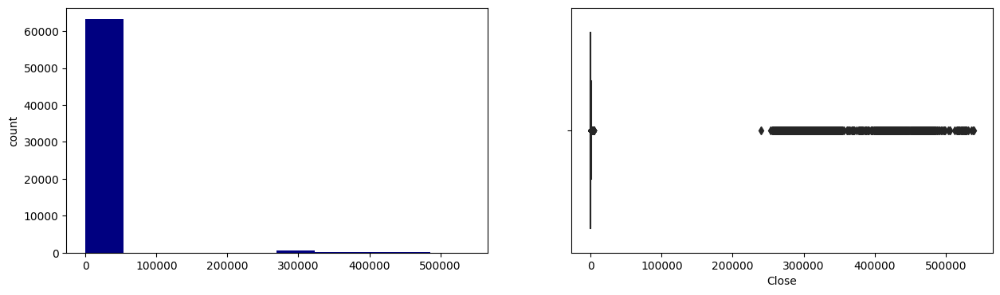

Previous Day Price
Skew : 7.2


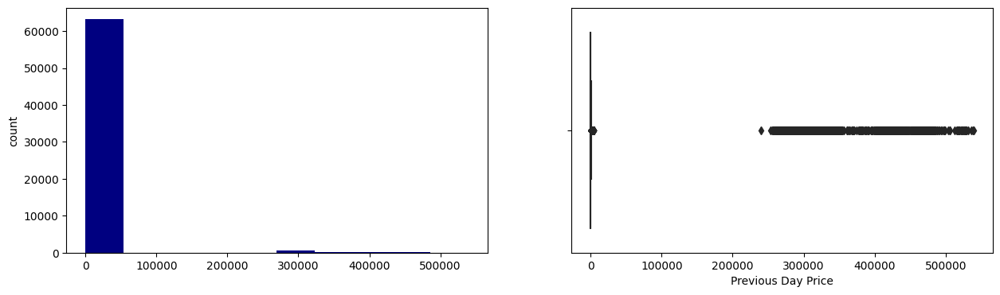

Volume
Skew : 10.28


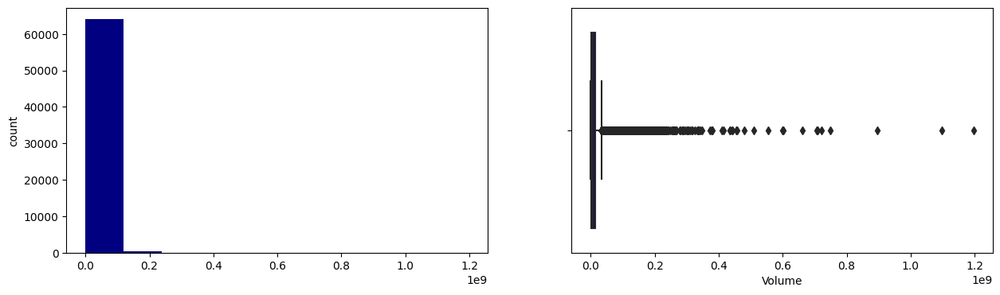

netReceivables
Skew : 4.76


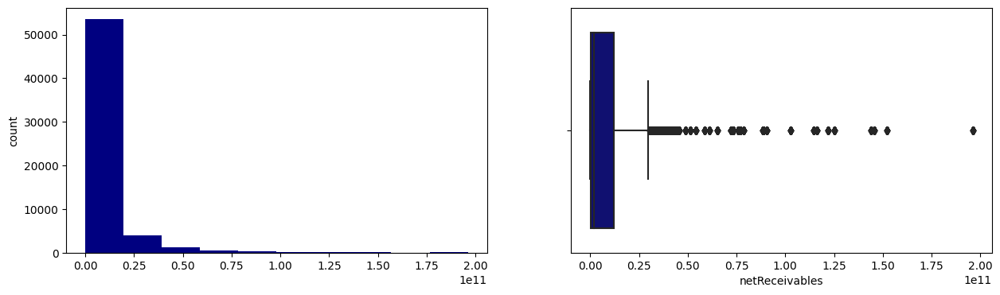

inventory
Skew : 4.42


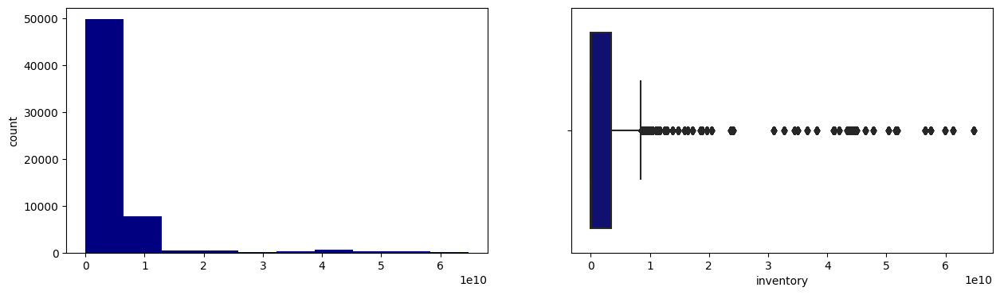

propertyPlantEquipmentNet
Skew : 3.48


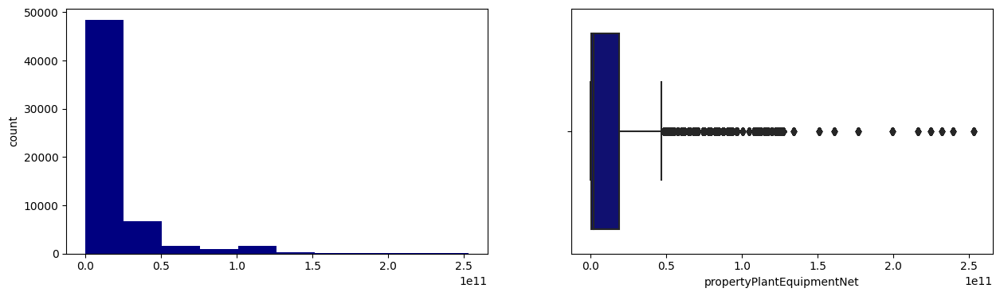

totalCurrentAssets
Skew : 2.08


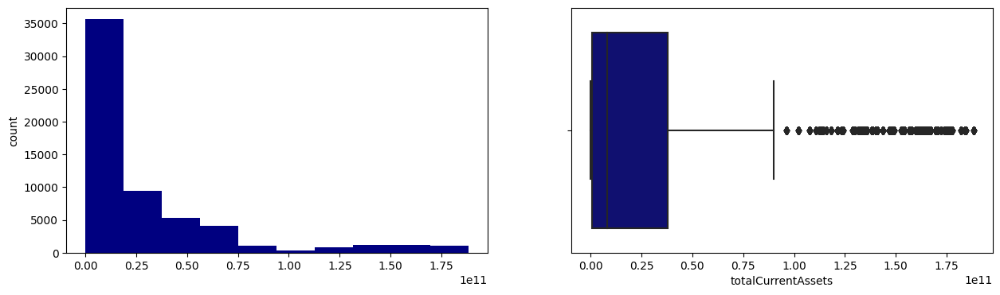

totalLiabilities
Skew : 6.75


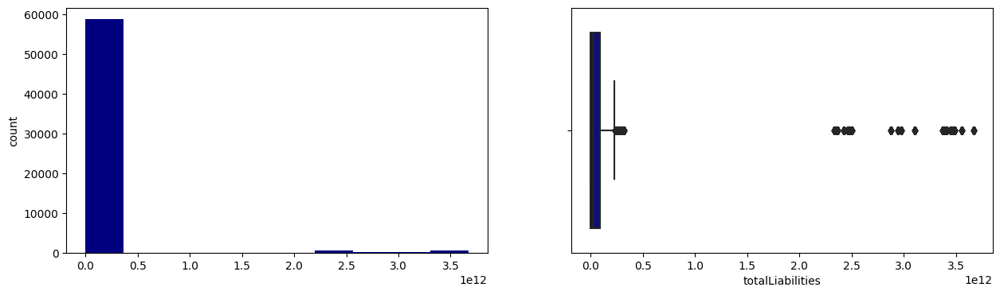

totalEquity
Skew : 2.29


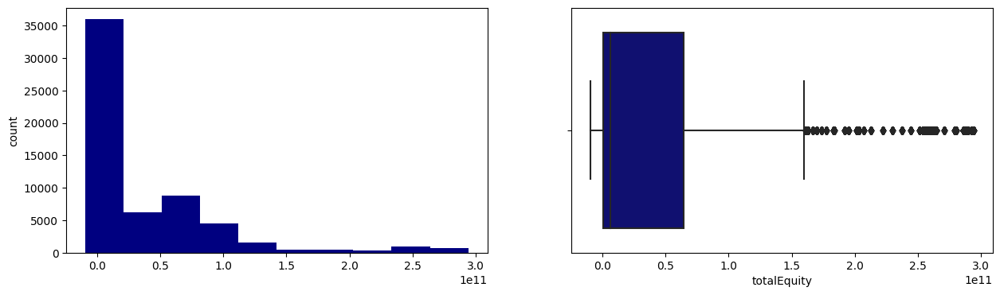

totalDebt
Skew : 4.63


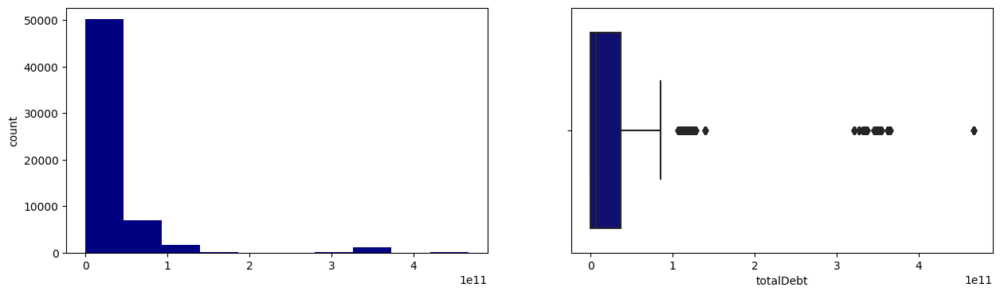

totalCurrentLiabilities
Skew : 2.11


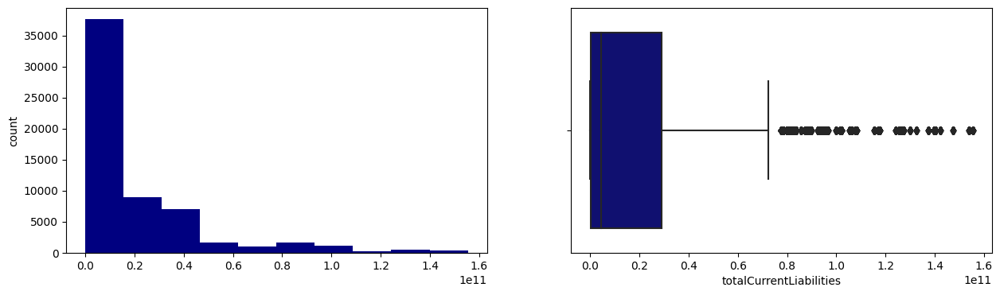

revenue
Skew : 3.15


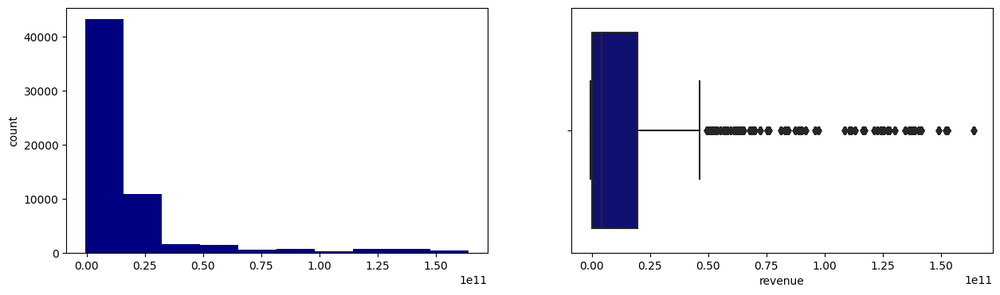

grossProfit
Skew : 1.95


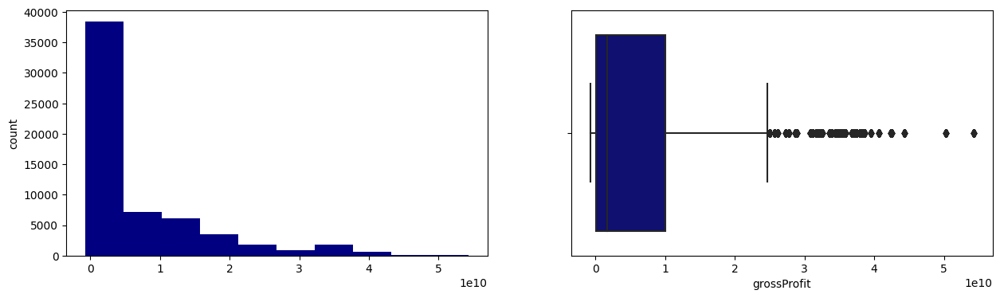

operatingExpenses
Skew : 2.41


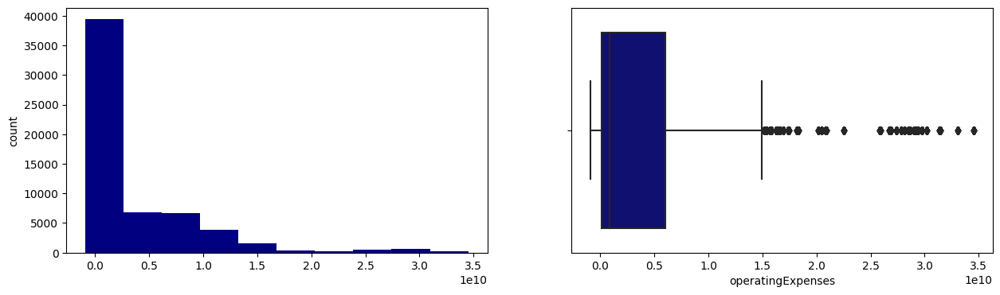

ebitda
Skew : 2.44


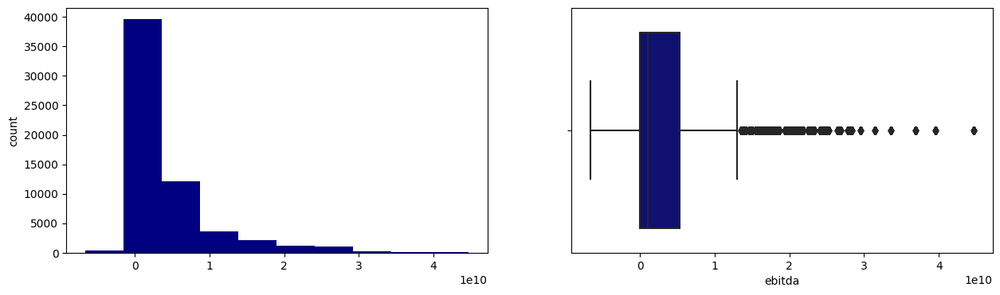

operatingIncome
Skew : 3.3


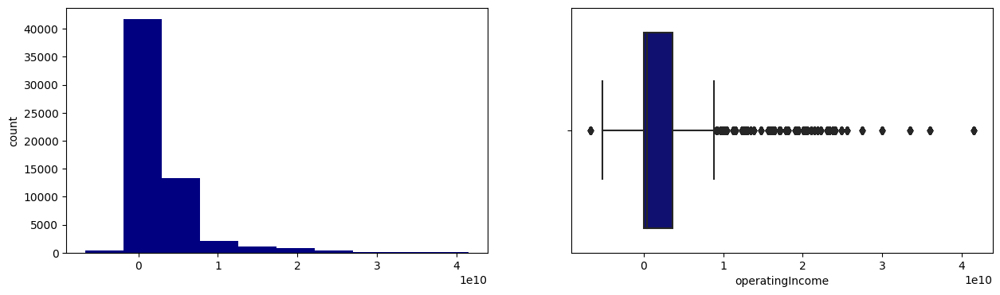

netIncome
Skew : 2.88


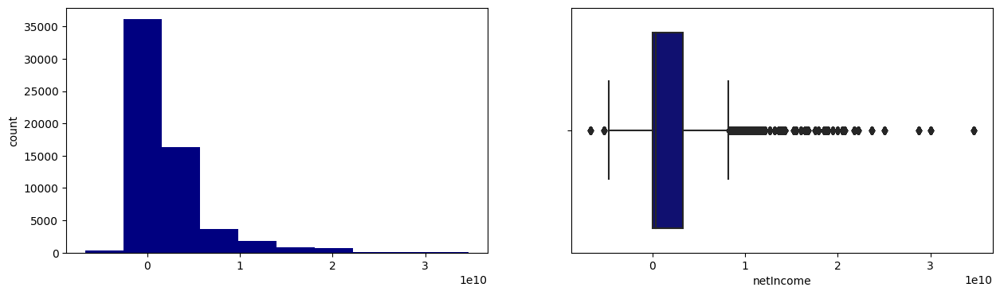

eps
Skew : -10.45


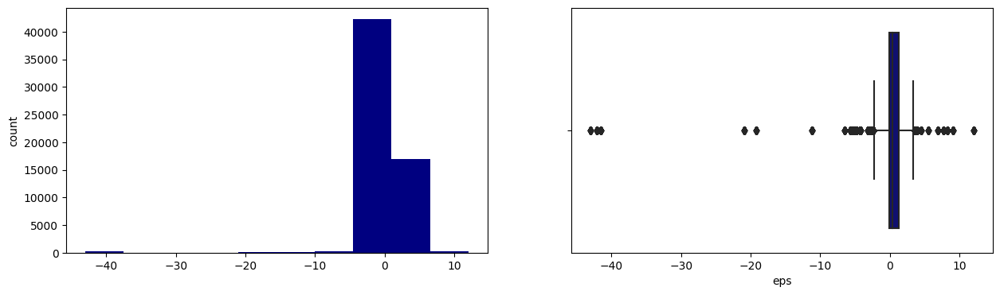

accountsReceivables
Skew : -2.9


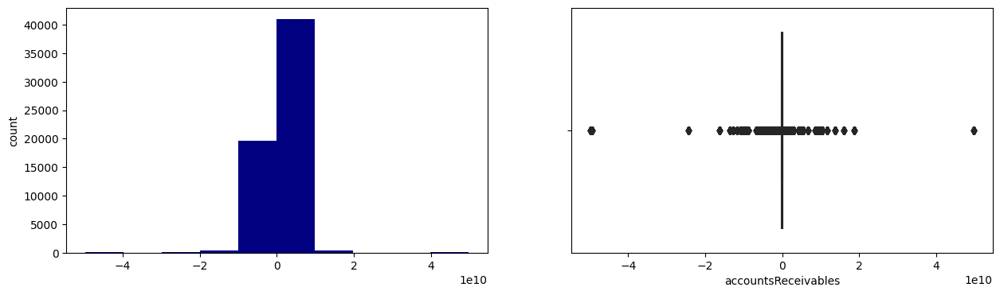

accountsPayables
Skew : 5.74


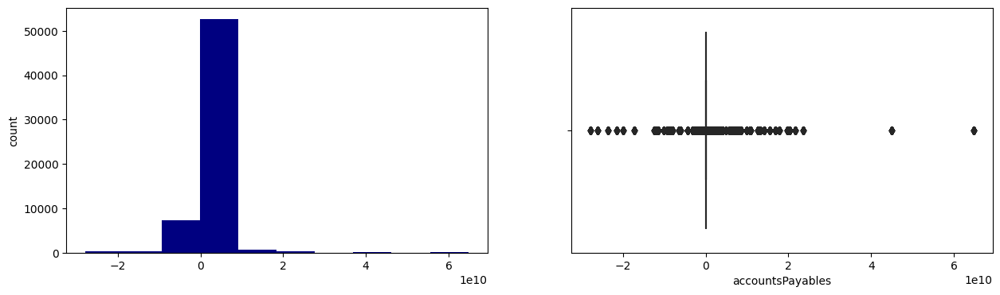

dividendsPaid
Skew : -1.5


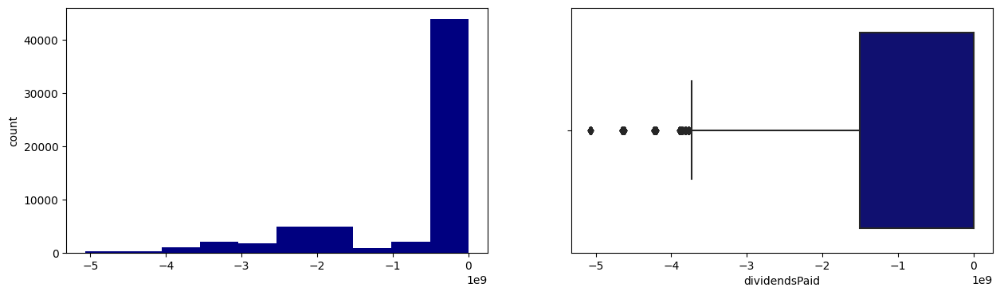

operatingCashFlow
Skew : 0.55


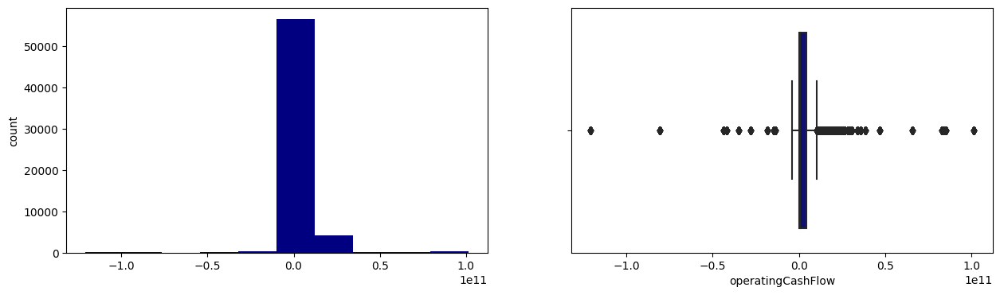

capitalExpenditure
Skew : -4.23


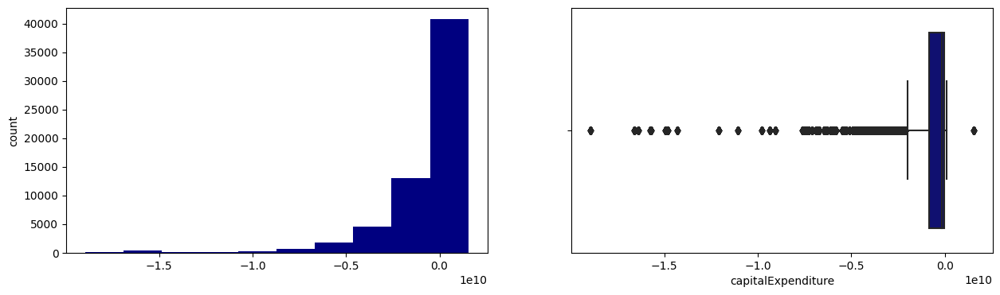

numberOfShares
Skew : 2.51


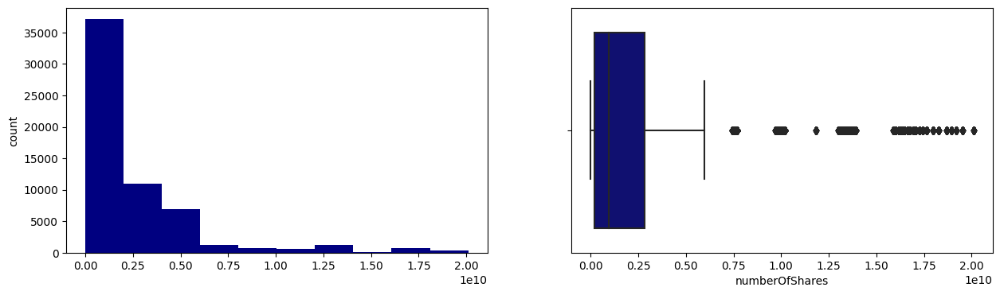

marketCapitalization
Skew : 3.07


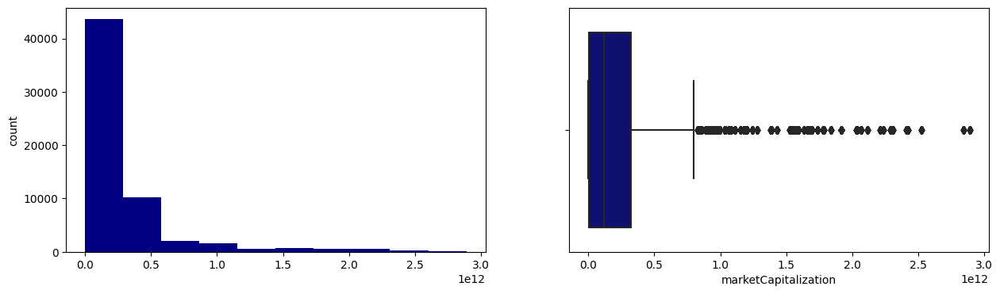

addTotalDebt
Skew : 4.63


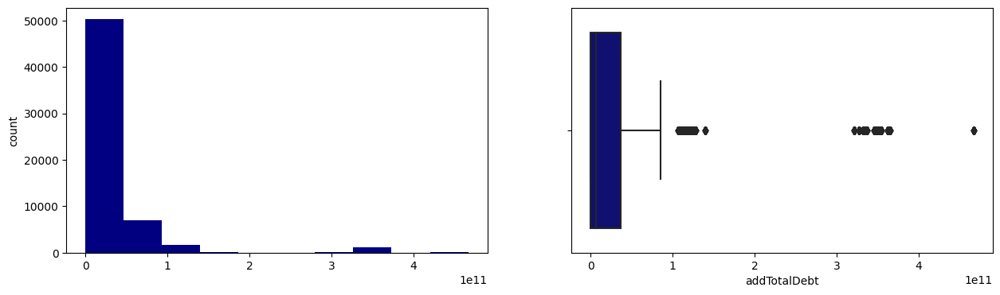

enterpriseValue
Skew : 3.04


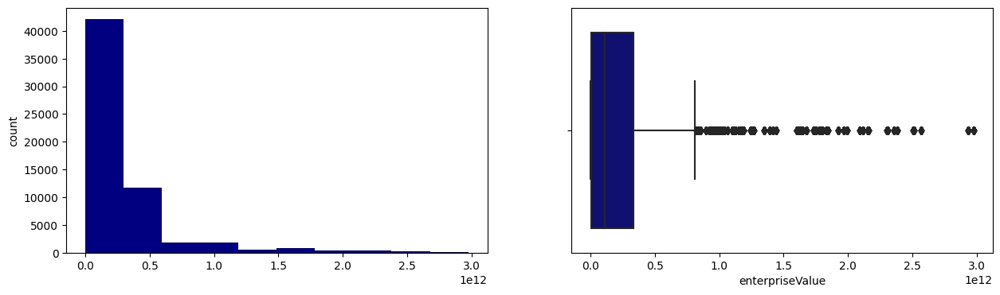

EnvironmentScore
Skew : -0.57


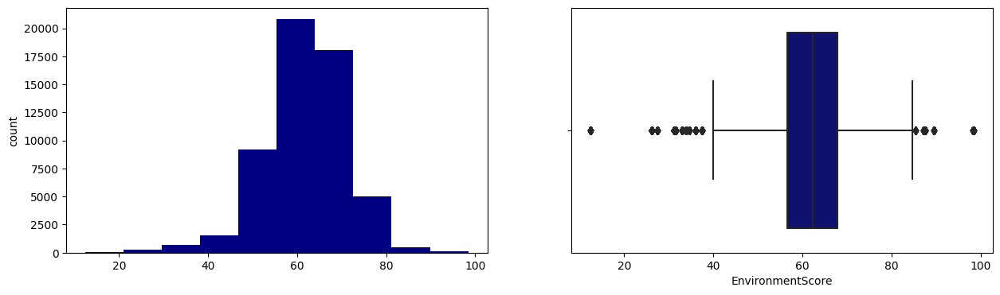

SocialScore
Skew : 0.71


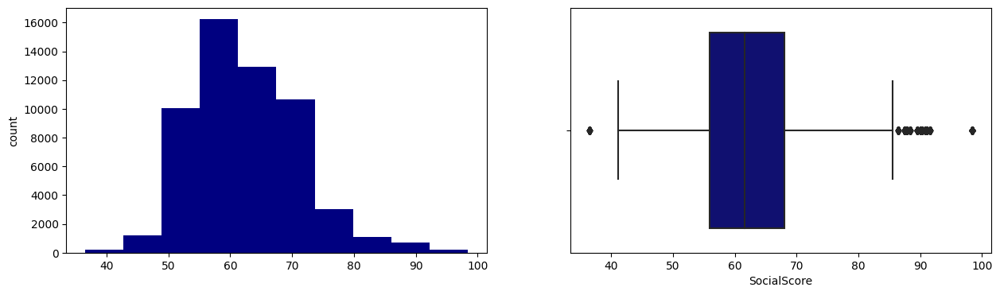

GovernanceScore
Skew : -0.07


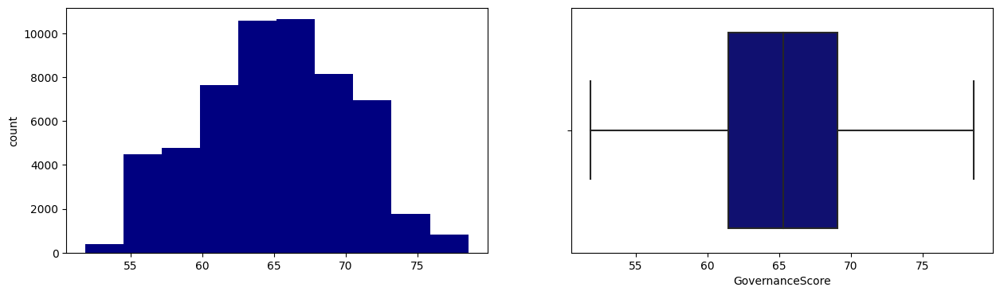

ESGscore
Skew : 0.2


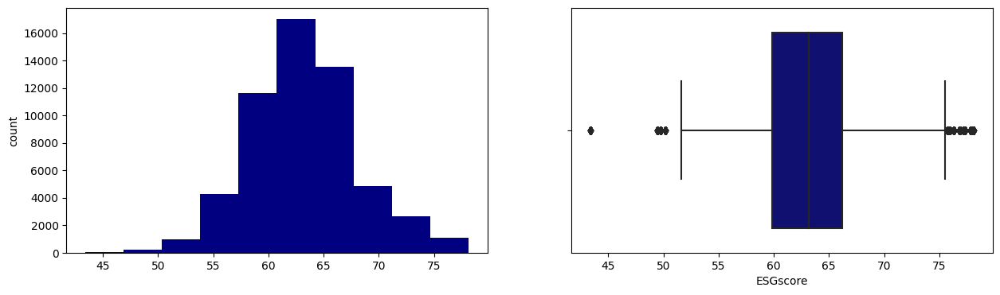

No of mentions
Skew : 17.58


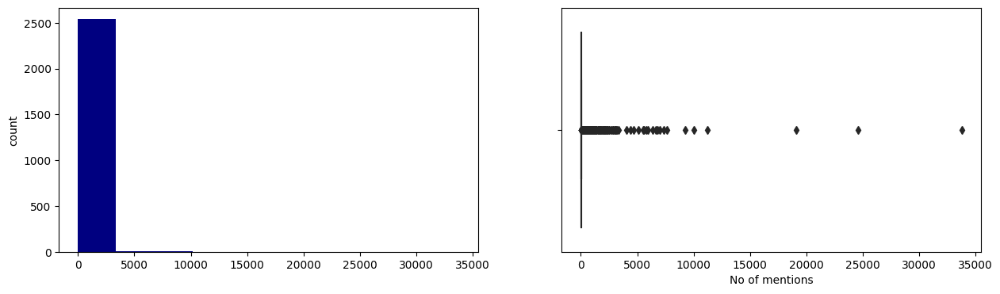

AvgPositiveScore
Skew : 0.55


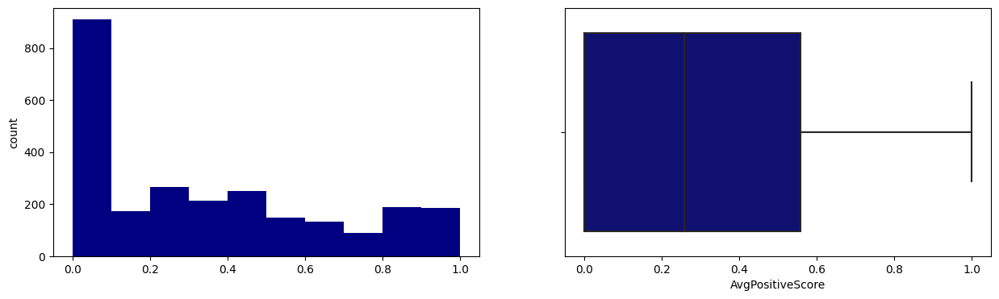

AvgNegativeScore
Skew : 0.55


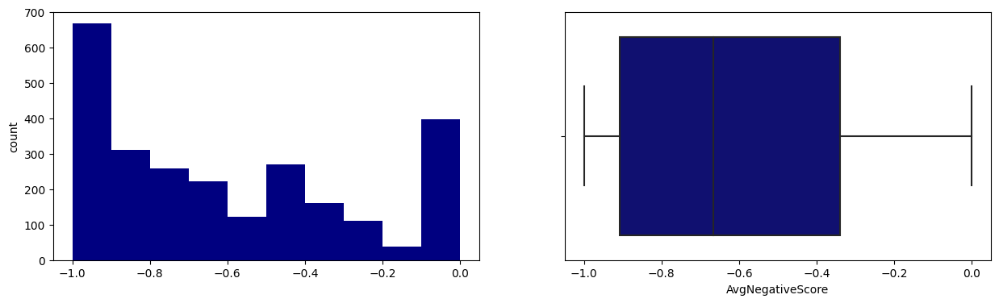

TotPositiveMentions
Skew : 12.5


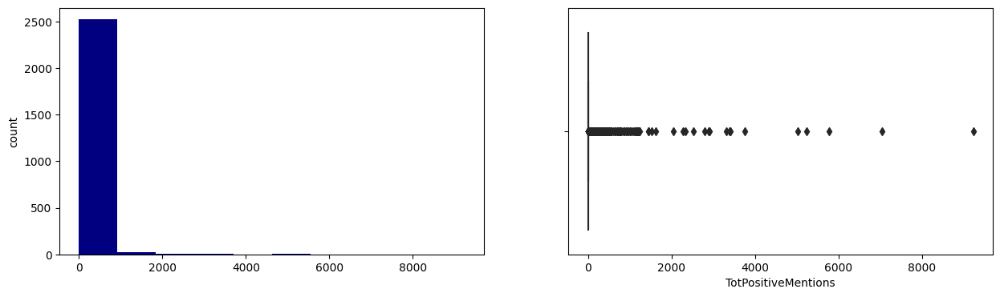

TotNegativeMentions
Skew : 23.04


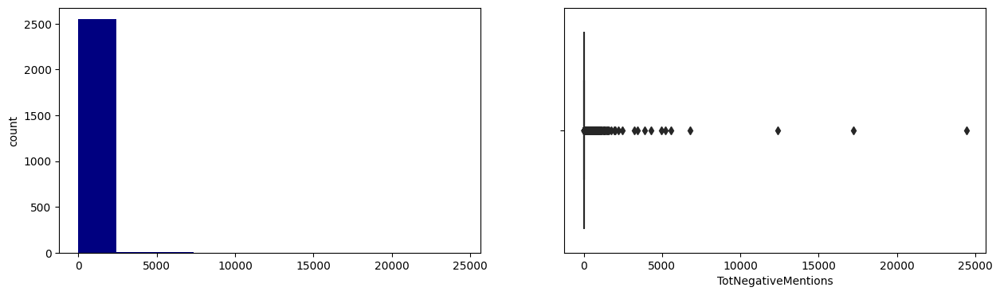

Count transaction (disposed)
Skew : 4.83


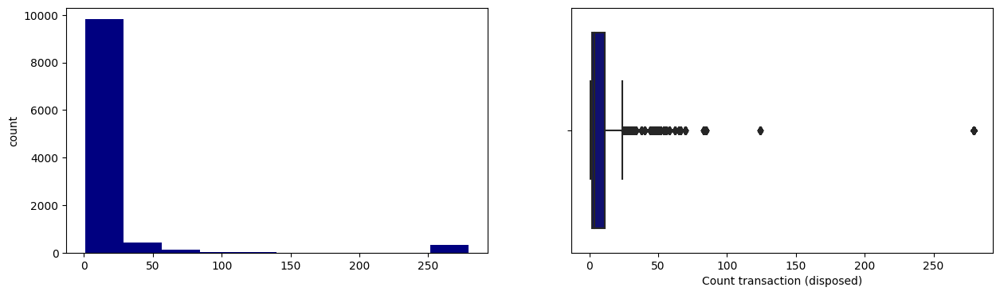

Total Amount (disposed)
Skew : 13.01


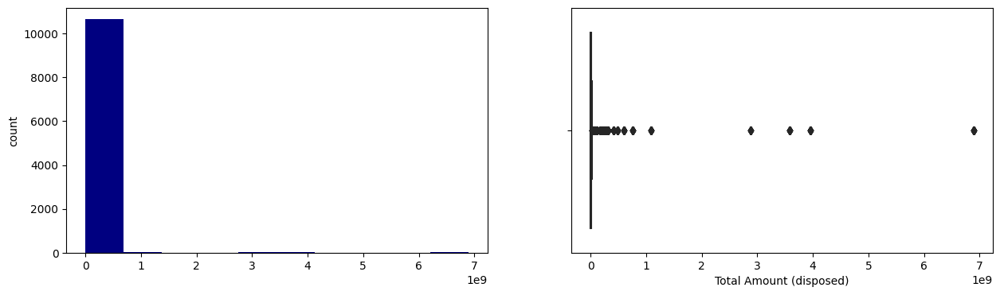

No of shares (disposed)
Skew : 7.74


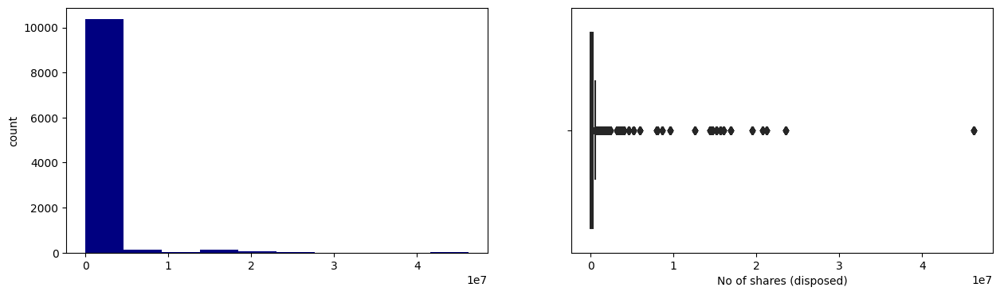

Avg Share Price (disposed) 
Skew : 2.97


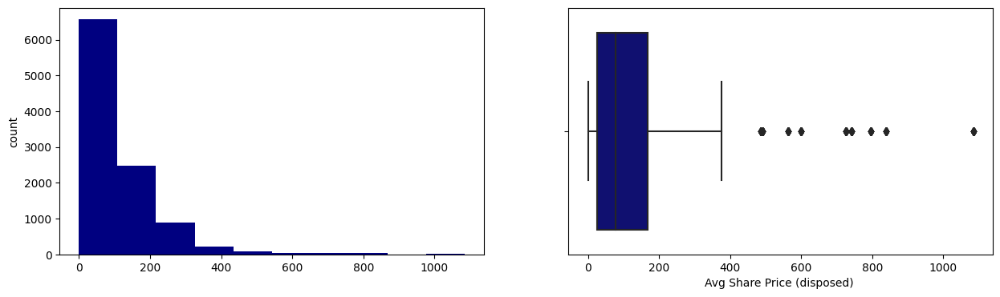

Min price (disposed)
Skew : 2.52


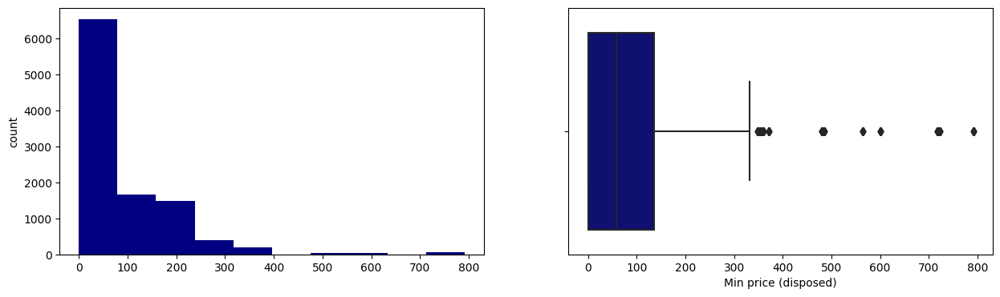

Max Price (disposed)
Skew : 5.3


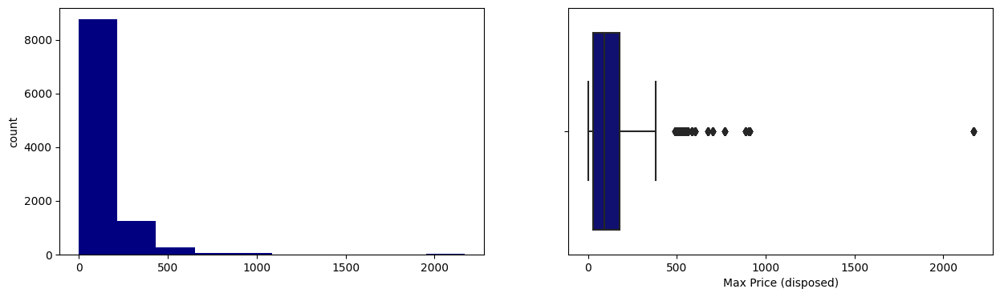

Count Acquired
Skew : 4.46


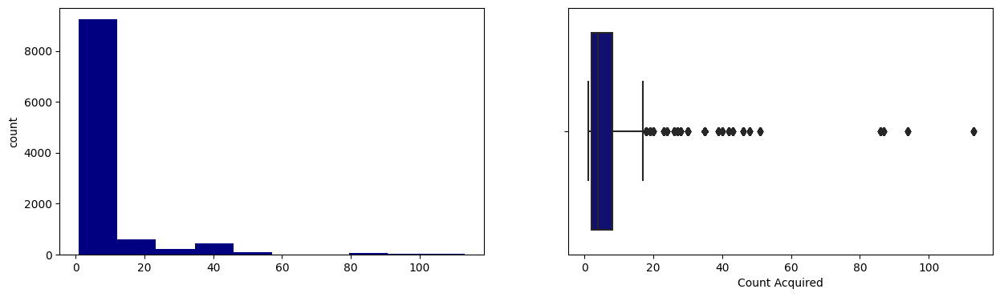

Total Amount(Acquired)
Skew : 8.09


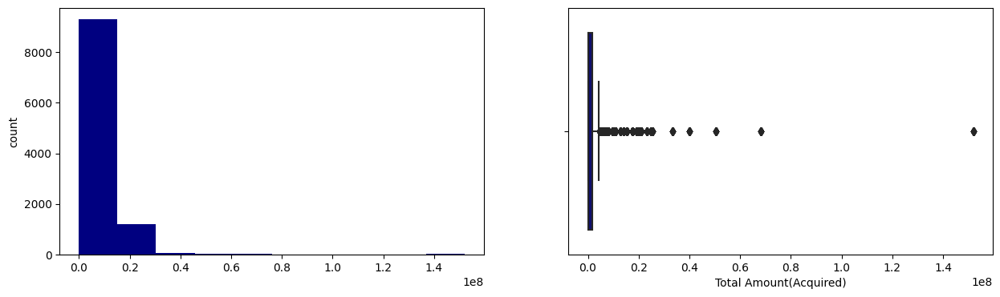

No of Shares(Acquired)
Skew : 12.32


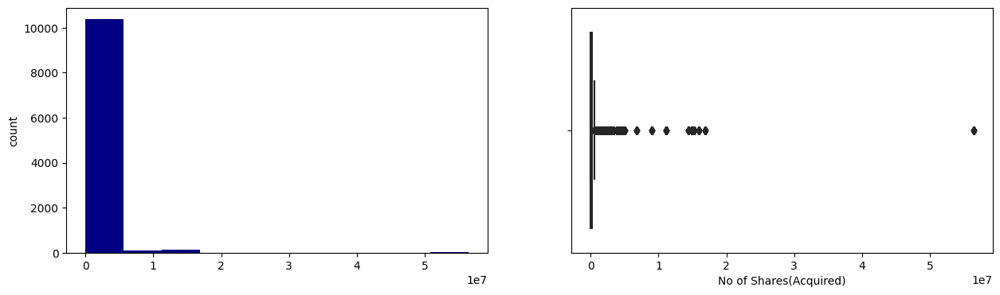

Avg Share Price (Acquired)
Skew : 21.59


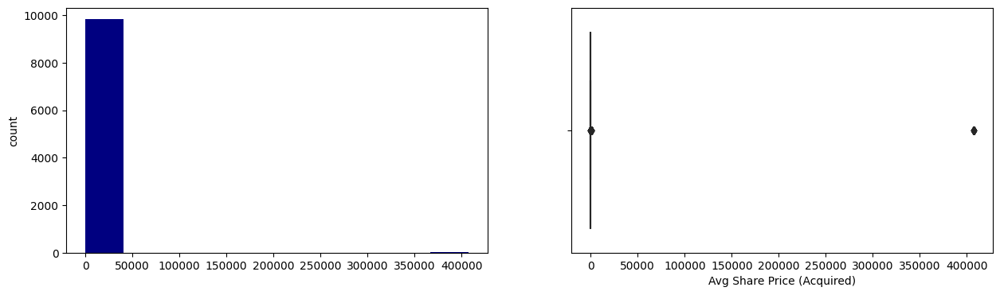

min price (Acquired)
Skew : 21.59


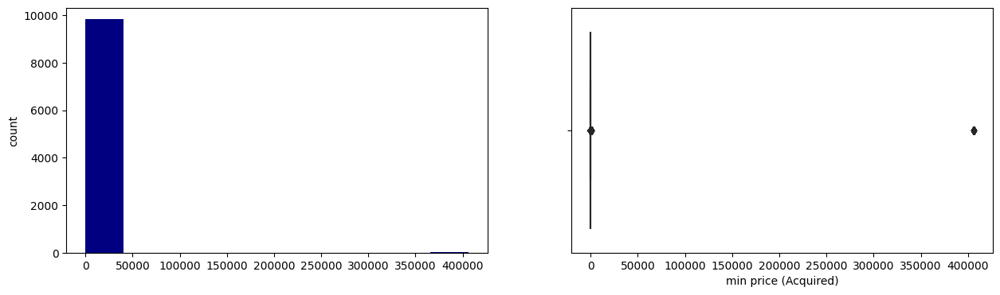

Max Price (Acquired)
Skew : 21.59


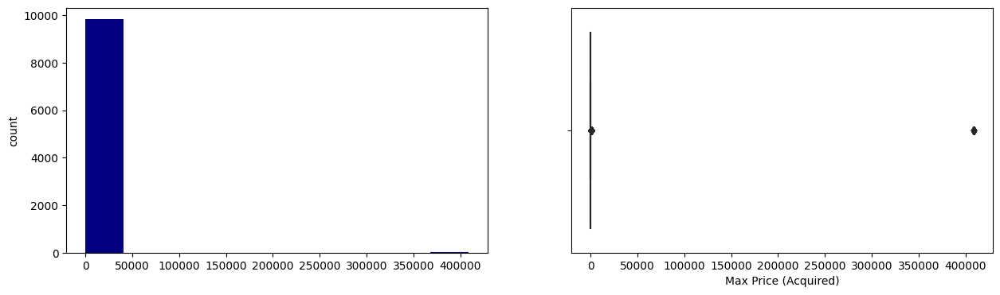

InflationRate
Skew : 0.33


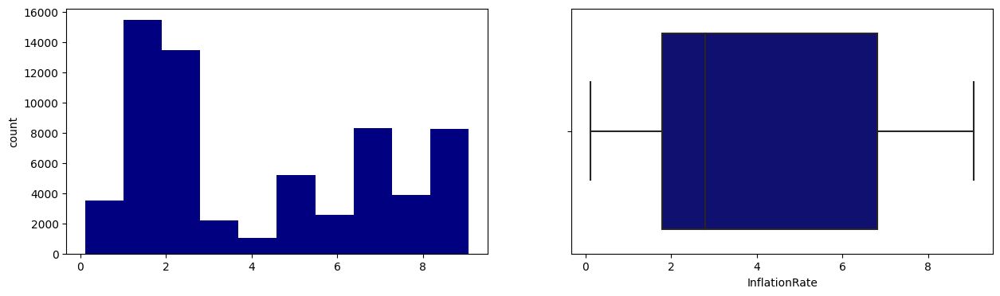

Value - T
Skew : -0.03


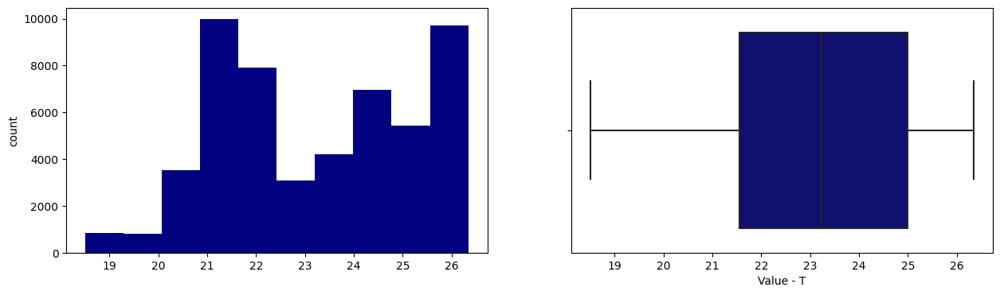

Year
Skew : -0.18


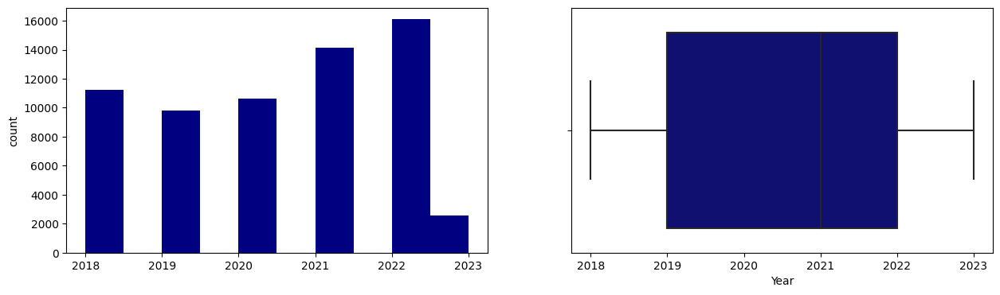

Quarter
Skew : -0.14


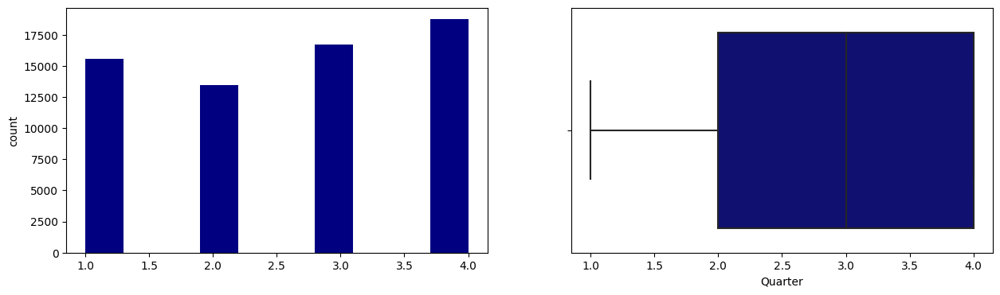

Day
Skew : 0.03


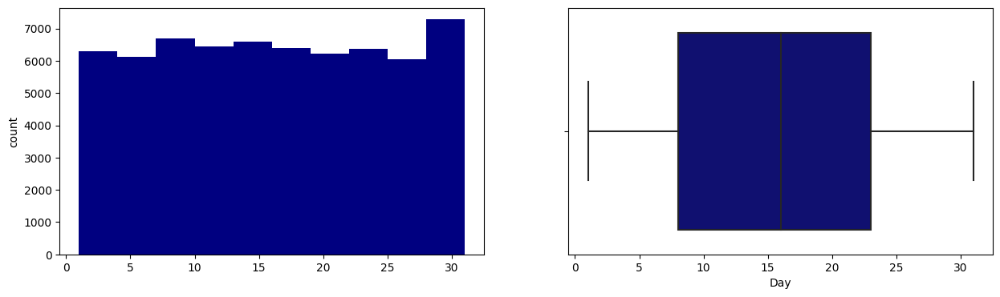

In [13]:
for col in num_cols:
    print(col)
    print('Skew :', round(newstocks_df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    newstocks_df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=newstocks_df[col])
    plt.show()

In [14]:
newstocks_df.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
count,64511.00,64511.00,64511.00,60063.00,60063.00,60063.00,60063.00,60063.00,60063.00,60063.00,60063.00,60265.00,60265.00,60265.00,60265.00,60265.00,60265.00,60265.00,61703.00,61703.00,61703.00,61703.00,61703.00,60141.00,60141.00,60141.00,60141.00,56178.00,56178.00,56178.00,56178.00,2559.00,2559.00,2559.00,2559.00,2559.00,10765.00,10765.00,10765.00,10386.00,10386.00,10386.00,10597.00,10597.00,10597.00,9852.00,9852.00,9852.00,63874.00,52498.00,64511.00,64511.00,64511.00
mean,7562.92,7562.92,13588103.42,8706708190.09,3421197258.84,16599844240.85,27692083751.56,106932087832.17,37027316176.20,26736853059.44,18974653799.91,14760052195.50,6315764889.01,3665824523.36,3832807726.09,2575561436.75,2366261910.88,0.35,-222698188.27,206365247.63,-675118575.87,3399523454.49,-950075508.55,2411082646.67,253901808586.45,26702175666.18,264738938672.97,61.93,62.52,65.16,63.20,231.22,0.34,-0.60,88.58,106.13,17.33,53259449.30,777446.49,111.04,82.26,130.50,7.37,3618551.21,669632.05,900.50,888.94,913.49,4.21,23.25,2020.34,2.60,15.67
std,52195.15,52195.15,24574868.12,17952649446.04,8320383543.80,31654804190.02,41388609809.12,426176429021.26,57475787208.95,54380803853.11,28147467191.07,27498574334.49,9466543127.68,5726316158.19,6224097192.31,4764169902.22,4310129579.27,2.91,3487952401.98,3907282196.56,1138309885.34,9894891622.75,2096981060.26,3553886793.56,412469003983.03,54354046097.09,425165661873.78,9.32,8.64,5.17,4.87,1132.31,0.33,0.34,387.16,722.93,48.85,412841505.41,3363464.82,122.44,106.33,162.80,11.62,9580114.47,3070688.45,18768.49,18715.16,18839.51,2.73,2.03,1.52,1.14,8.75
min,0.07,0.00,0.00,0.00,0.00,0.00,0.00,-1226844.00,-9463100000.00,0.00,0.00,-506655000.00,-686583000.00,-888000000.00,-6605779000.00,-6669379000.00,-6674523000.00,-43.00,-49719000000.00,-27808000000.00,-5066000000.00,-120772000000.00,-18935000000.00,155515.00,241035.98,0.00,-157462400.00,12.47,36.56,51.86,43.42,1.00,0.00,-1.00,0.00,0.00,1.00,0.00,4.00,0.00,0.00,0.00,1.00,0.00,20.00,0.00,0.00,0.00,0.12,18.51,2018.00,1.00,1.00
25%,25.35,25.34,2448391.00,99000000.00,0.00,126406000.00,565900000.00,758983000.00,561087000.00,183606000.00,181011000.00,164203000.00,56152000.00,109686000.00,-4723000.00,-7900000.00,-11548000.00,-0.12,-57000000.00,-1010000.00,-1505000000.00,-4180000.00,-837000000.00,203469222.00,4392230033.40,182842000.00,4945221730.00,56.67,55.99,61.45,59.88,2.00,0.00,-0.91,0.00,1.00,2.00,212590.00,8967.00,25.96,1.57,29.91,2.00,0.00,12791.00,0.02,0.00,0.08,1.79,21.55,2019.00,2.00,8.00
50%,91.05,91.05,6692690.00,1962000000.00,43400000.00,1902000000.00,8098015000.00,17192000000.00,6356000000.00,6542373000.00,4448000000.00,4155000000.00,1650378000.00,837850000.00,1084000000.00,398000000.00,378841000.00,0.37,0.00,0.00,0.00,556000000.00,-144000000.00,971000000.00,117241645800.00,6507446000.00,112516460320.00,62.41,61.64,65.29,63.16,5.00,0.26,-0.67,1.00,3.00,4.00,2070278.00,34512.00,78.20,59.25,93.80,4.00,223756.00,97659.00,9.87,1.38,19.10,2.80,23.24,2021.00,3.00,16.00
75%,178.74,178.74,15231581.50,12088000000.00,3414000000.00,18766000000.00,37748000000.00,92476000000.00,64626000000.00,36292000000.00,29073000000.00,19745000000.00,1003

In [15]:
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,19913

In [16]:
## if you need to check anything or filter 


import pandas as pd

# Assuming your DataFrame is named 'df'
print(newstocks_df[newstocks_df['Close'] == 539180.00])


         Close  Previous Day Price Price Change  Volume Ticker  \
8680 539180.00           538949.00     Increase    3805  BRK.A   

     Market Capitalization    Industry                   Sector  \
8680             Large-cap  Financials  Insurance - Diversified   

      netReceivables  inventory  propertyPlantEquipmentNet  \
8680             NaN        NaN                        NaN   

      totalCurrentAssets  totalLiabilities  totalEquity  totalDebt  \
8680                 NaN               NaN          NaN        NaN   

      totalCurrentLiabilities  revenue  grossProfit  operatingExpenses  \
8680                      NaN      NaN          NaN                NaN   

      ebitda  operatingIncome  netIncome  eps  accountsReceivables  \
8680     NaN              NaN        NaN  NaN       -3469000000.00   

      accountsPayables  dividendsPaid  operatingCashFlow  capitalExpenditure  \
8680              0.00           0.00      6829000000.00      -3090000000.00   

      numberOfS

Notes on univariate 

-Close -> based on the histogram, majority of the dataset have a price distribution between 0 and 50K; max price is seen as 539,180 and on the box plot we can see presence of extreme values, this values are correct as the ticker BRK.A has stock prices that high. 75% of the dataset have prices less than 178.74.

-Volume -> From the histogram shows skewness and presence of extreme values; 
shows that lowest minimum volume traded is 0 and that 75% of them do about 15M trades daily

Max - AMC jan 2021 /post covid

ZOM traded that high 

AMC The movie theater chain, which narrowly avoided bankruptcy last January, was the beneficiary of a flurry of new retail investors who helped the company secure much-needed capital.
Then, on Jan. 11 and Jan. 12 combined, ZOM traded over 1 billion shares.

The catalyst for that last instance of enormous volume? Apparently, it was a post by Carole Baskin of Tiger King fame. Someone paid Baskin $299 to tout Zomedica on video-sharing platform Cameo. In response, the stock rose 171% over the two sessions.


Min - for Hims; there are some days with no reported trades


Fundamental data- Most of them showed presence of skewness of the data; some had negative data while some had positive. Give example of this.

You can pick revenue and profit and talk about the stocks with the minimum and max and why that happened at that point in time. 

CLOV has negative gross profit AND Revenue in dec 2020

WMT has highest revenue
AAPL has highest gross profit which is realistic 


for ESG- 

the distribution shown are normal distributions across the different ESG features; 

With avg score of 60-65% across tickers; the lowest scores seen are environment score of 12.7% and the highest scores seen are environment scores of 98%. the total average ESG Scores about 63%.  

GME had the highest environment score with 98% april, may, june 2022
ZOM had lowest environment score jan 2020;
HIMS sept 2019 ESGscore was highest. 

for insider trading

most of the datsets shows right skewness with very few outliers;  
clov 2021 january has the higest no of shares acquired 

TSla 4th december 2022 has the highest no of shares disposed

check why?



for social sentiments 


most of the datsets shows right skewed with fewer extreme and outlier values; as average number of social sentiments is about 200; while an extreme value as high as about 33,790 mentions. The data we have shows more than twice as much negative sentiments than positive sentiments 

TSLA has the highest number of mention on the 28th of december 2022 and the reason for this was as a result of ....

"Dec 28 (Reuters) - Shares of Tesla Inc (TSLA.O) snapped a seven-session losing streak on Wednesday, in their rare rise this month on the way to what will be the electric-vehicle maker's worst year on record.

The stock gained 3.3% on the day. It is set to round off 2022 with a 68% drop - the most among the big U.S. technology firms - as fears mount over slowing demand in China and top boss Elon Musk's growing distractions with Twitter. "
 
 reference this link 
 https://www.reuters.com/business/autos-transportation/tesla-shares-record-rare-jump-this-month-way-worst-year-2022-12-28/



for economic data 


has a normal distribution, no outlier or extreme values.

For inflation rate - Inflation was as high as 9.06 in June 2022 and min was 0.12 in May 2020

For GDP - US GDP is 26.34  in january 2023 and is the highest seen so far and min was 18.51 in April 2020 



#### END of numerical univariate

#### filter to remove abnormal stock BRK.A newstocks_df

### Univariate - Categorical 

#### Price Change

In [17]:
#proportion of categories of accident severity variable
newstocks_df["Price Change"].value_counts(normalize=True)

Increase   0.44
Decrease   0.43
Constant   0.13
Name: Price Change, dtype: float64

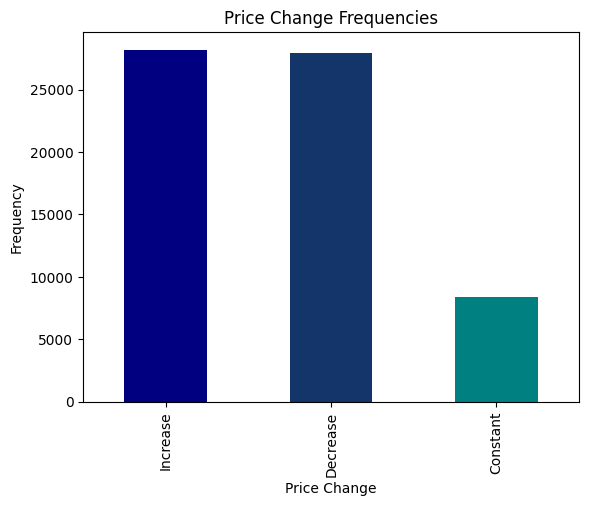

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the pastel color palette
#pastel_colors = sns.color_palette('crest')

# Visualisation of Price Change categories' frequencies
ax = newstocks_df["Price Change"].value_counts().plot(kind="bar", color= custom_palette)

# Set the plot labels
ax.set_title("Price Change Frequencies")
ax.set_xlabel("Price Change")
ax.set_ylabel("Frequency")

# Show the plot
plt.show()


In [19]:
Freq_df =(pd.DataFrame((newstocks_df[['Price Change','Ticker', 'Market Capitalization','Sector','Industry','IsCovidYear', 'Month', 'Day of Week']].describe())))

Freq_df

,Price Change,Ticker,Market Capitalization,Sector,Industry,IsCovidYear,Month,Day of Week
count,64511,64511,64511,64511,64511,64511,64511,64511
unique,3,50,4,39,9,3,12,5
top,Increase,PFE,Large-cap,Credit Services,Health Care,PostCovid,October,Tuesday
freq,28210,4161,32662,5810,17869,32796,6372,13283


In [20]:
#data cleaning on market capitalization field 

import pandas as pd

# Create a sample DataFram

# Merge records and assign the same name code
merged_name_code = 'Large-cap'
newstocks_df.loc[newstocks_df['Market Capitalization'].isin(['Large-cap', 'Large-Cap']), 'Market Capitalization'] = merged_name_code

# Print the updated DataFrame
print(newstocks_df)


       Close  Previous Day Price Price Change    Volume Ticker  \
0     155.00              155.85     Decrease  98944633   AAPL   
1     155.85              152.99     Increase  76254419   AAPL   
2     152.99              152.59     Increase  77167866   AAPL   
3     152.59              150.47     Increase  73695893   AAPL   
4     150.47              148.50     Increase  84457122   AAPL   
...      ...                 ...          ...       ...    ...   
64506   2.03                1.99     Increase     12975    ZOM   
64507   1.99                1.85     Increase     33562    ZOM   
64508   1.85                1.88     Decrease      6242    ZOM   
64509   1.88                1.90     Decrease     14555    ZOM   
64510   1.90                0.00     Constant     22591    ZOM   

      Market Capitalization                Industry                  Sector  \
0                 Large-cap  Information Technology    Consumer Electronics   
1                 Large-cap  Information Technolo

### Statistical analysis for categorical variables 

In [21]:
Freq_df =(pd.DataFrame((newstocks_df[['Price Change','Ticker', 'Market Capitalization','Sector','Industry','IsCovidYear', 'Month', 'Day of Week']].describe())))

Freq_df

,Price Change,Ticker,Market Capitalization,Sector,Industry,IsCovidYear,Month,Day of Week
count,64511,64511,64511,64511,64511,64511,64511,64511
unique,3,50,3,39,9,3,12,5
top,Increase,PFE,Large-cap,Credit Services,Health Care,PostCovid,October,Tuesday
freq,28210,4161,38134,5810,17869,32796,6372,13283


In [22]:
#Getting the value counts of the light_conditions variable
values = pd.DataFrame(newstocks_df.loc[:,'Day of Week'].value_counts())
values.columns = ['Day of Week']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Day of Week'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Day of Week %']
values.join(percentages)

,Day of Week,Day of Week %
Tuesday,13283,20.59%
Wednesday,13180,20.43%
Thursday,13037,20.21%
Friday,12989,20.13%
Monday,12022,18.64%


In [23]:
#Getting the value counts of the price change variable
values = pd.DataFrame(newstocks_df.loc[:,'Price Change'].value_counts())
values.columns = ['Price Change']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Price Change'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Price Change %']
values.join(percentages)

,Price Change,Price Change %
Increase,28210,43.73%
Decrease,27900,43.25%
Constant,8401,13.02%


In [24]:
#Getting the value counts of the Ticker variable
values = pd.DataFrame(newstocks_df.loc[:,'Ticker'].value_counts())
values.columns = ['Ticker']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Ticker'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Ticker %']
values.join(percentages)

,Ticker,Ticker %
PFE,4161,6.45%
KO,3231,5.01%
JNJ,3201,4.96%
DIS,2256,3.5%
AAPL,1311,2.03%
MCD,1311,2.03%
NFLX,1311,2.03%
NVAX,1311,2.03%
NVDA,1311,2.03%
PG,1311,2.03%


In [25]:
#Getting the value counts of the Sector variable
values = pd.DataFrame(newstocks_df.loc[:,'Sector'].value_counts())
values.columns = ['Sector']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Sector'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Sector %']
values.join(percentages)

,Sector,Sector %
Credit Services,5810,9.01%
Pharmaceutical,4161,6.45%
Biotechnology,3694,5.73%
Entertainment - Diversified,3567,5.53%
Beverages - Non-Alcoholic,3231,5.01%
Drug Manufacturers - General,3201,4.96%
Internet Content & Information,2673,4.14%
Software - Infrastructure,2622,4.06%
Healthcare Services,1580,2.45%
Aerospace & Defense,1311,2.03%


In [26]:
#Getting the value counts of the Industry variable
values = pd.DataFrame(newstocks_df.loc[:,'Industry'].value_counts())
values.columns = ['Industry']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Industry'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Industry %']
values.join(percentages)

,Industry,Industry %
Health Care,17869,27.7%
Information Technology,12104,18.76%
Communication Services,10683,16.56%
Consumer Discretionary,7691,11.92%
Financials,6378,9.89%
Consumer Staples,5853,9.07%
Energy,1311,2.03%
Utilities,1311,2.03%
Industrials,1311,2.03%


In [27]:
#Getting the value counts of the Market Capitalization variable
values = pd.DataFrame(newstocks_df.loc[:,'Market Capitalization'].value_counts())
values.columns = ['Market Capitalization']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Market Capitalization'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Market Capitalization %']
values.join(percentages)

,Market Capitalization,Market Capitalization %
Large-cap,38134,59.11%
Small-cap,25066,38.86%
Mid-cap,1311,2.03%


In [28]:
#Getting the value counts of the IsCovidYear variable
values = pd.DataFrame(newstocks_df.loc[:,'IsCovidYear'].value_counts())
values.columns = ['IsCovidYear']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'IsCovidYear'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['IsCovidYear %']
values.join(percentages)

,IsCovidYear,IsCovidYear %
PostCovid,32796,50.84%
NonCovid,20219,31.34%
Covid,11496,17.82%


In [29]:
#Getting the value counts of the Month variable
values = pd.DataFrame(newstocks_df.loc[:,'Month'].value_counts())
values.columns = ['Month']
#The normalize attribute in the value_counts method computes the percentage for each category
percentages = pd.DataFrame(round(newstocks_df.loc[:,'Month'].value_counts(normalize=True)*100,2).map(lambda x : str(x)+'%'))
percentages.columns = ['Month %']
values.join(percentages)

,Month,Month %
October,6372,9.88%
December,6276,9.73%
November,6090,9.44%
August,5852,9.07%
July,5519,8.56%
September,5352,8.3%
March,5333,8.27%
January,5275,8.18%
February,4959,7.69%
June,4576,7.09%


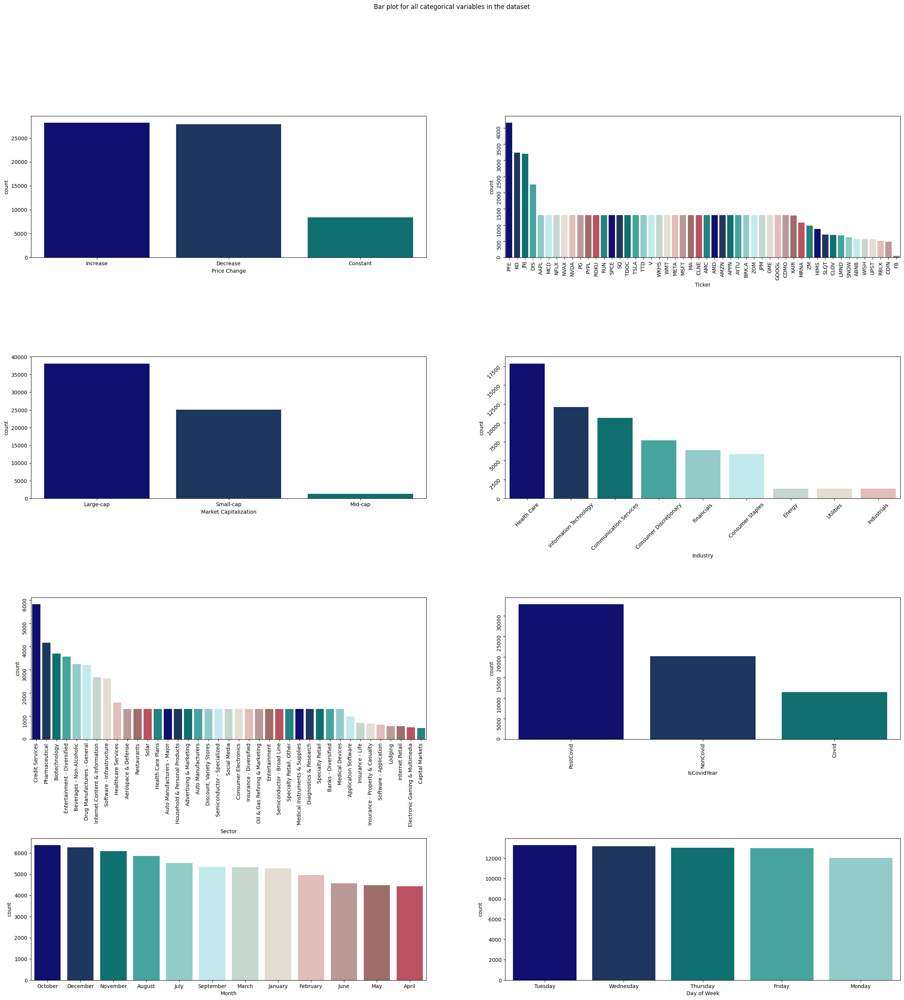

In [30]:
fig, axes = plt.subplots(4, 2, figsize = (30, 30))
fig.suptitle('Bar plot for all categorical variables in the dataset')
sns.countplot(ax = axes[0, 0], x = 'Price Change', data = newstocks_df,
              order = newstocks_df['Price Change'].value_counts().index);
sns.countplot(ax = axes[0, 1], x = 'Ticker', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Ticker'].value_counts().index);
sns.countplot(ax = axes[1, 0], x = 'Market Capitalization', data = newstocks_df,
              order = newstocks_df['Market Capitalization'].value_counts().index);
sns.countplot(ax = axes[1, 1], x = 'Industry', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Industry'].value_counts().index);
sns.countplot(ax = axes[2, 0], x = 'Sector', data = newstocks_df, palette = custom_palette,
              order = newstocks_df['Sector'].value_counts().index);
sns.countplot(ax = axes[2, 1], x = 'IsCovidYear', data = newstocks_df,
              order = newstocks_df['IsCovidYear'].value_counts().index);
sns.countplot(ax = axes[3, 0], x = 'Month', data = newstocks_df,palette = custom_palette,
              order = newstocks_df['Month'].value_counts().index);
sns.countplot(ax = axes[3, 1], x = 'Day of Week', data = newstocks_df, 
              order = newstocks_df['Day of Week'].value_counts().index);


axes[0][1].tick_params(labelrotation=90);
axes[1][1].tick_params(labelrotation=45);
axes[2][0].tick_params(labelrotation=90);
axes[2][1].tick_params(labelrotation=90);


plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.2)

In [31]:
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,19913

#### Summary of Univariate Categorical Variables


Price Change - there are 3 unique fields, based on the distribution, alThough increase has the highest frequency, decrease is almost at par with it at 43%; while 13% of the data contains constant; as seen in the bar chart and frequency table below


Ticker - 50 unique tickers. the bar chart shows we have unequal datasets for the different data;PFE has the highest number of data while FB has the least; this shows that we do not have enough datasets for FB; Or data was lost for FB through the data gathering process. see tickers list; provide list and full name of tickers.

Market Capitalization - There are 3 unique fields, The majority of the distribution, which is over 50% of the data is Large capitalization stocks and the analysis contains very little mid capitalization stocks of abotu 2% of the data. 

Industry - The dataset covers 9 distinct industries; majority of the data is on the health care (27%) and technology industry(18%); while energy, industrials and utilities have lower percentage of about 2% the data.

Sectors - we have 39 unique sectors represented in the dataset of which credit services dominates the dataset by 9% and we have fewer data for gaming and capital markets stocks

Iscovidyear - there are 3 distinct covid status of which post covid dataset represents 50% of the data, this refers to data after covid (from january 2021).

Month - All the months are represented with October having the most datasets. 


Day of week - has an almost equal representation with Weekdays represented to show valid trading days. Monday has the least amount of records. 








## END of Univariate Visualizations 

BIVARIATE VISUALIZATION - ALL CATEGORICAL PREDICTORS VS NUMERICAL TARGET (PRICE) 

In [32]:
import pandas as pd

# Assuming your DataFrame is named 'df'
filterednewstock_df = newstocks_df[newstocks_df['Ticker'] != 'BRK.A']


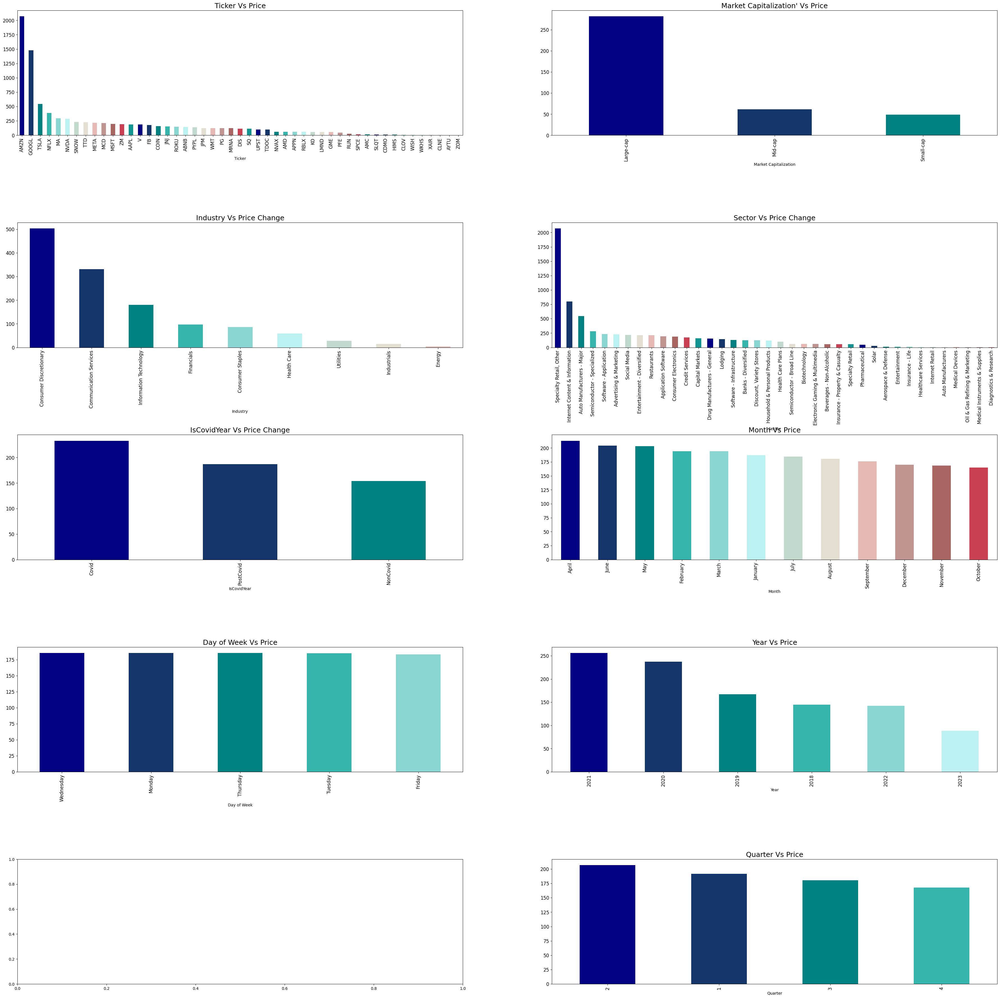

In [33]:
#Code ran without BRK
fig, axarr = plt.subplots(5, 2, figsize=(45, 45))
filterednewstock_df.groupby('Ticker')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12, color = custom_palette)
axarr[0][0].set_title("Ticker Vs Price", fontsize=18)
filterednewstock_df.groupby('Market Capitalization')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12, color = custom_palette)
axarr[0][1].set_title("Market Capitalization' Vs Price", fontsize=18)
filterednewstock_df.groupby('Industry')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][0], fontsize=12, color = custom_palette)
axarr[1][0].set_title("Industry Vs Price Change", fontsize=18)
filterednewstock_df.groupby('Sector')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][1], fontsize=12, color = custom_palette)
axarr[1][1].set_title("Sector Vs Price Change", fontsize=18)
filterednewstock_df.groupby('IsCovidYear')['Close'].mean().sort_values(ascending=False).head(10).plot.bar(ax=axarr[2][0], fontsize=12, color = custom_palette)
axarr[2][0].set_title("IsCovidYear Vs Price Change", fontsize=18)
filterednewstock_df.groupby('Month')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[2][1], fontsize=12, color = custom_palette )
axarr[2][1].set_title("Month Vs Price", fontsize=18)
filterednewstock_df.groupby('Day of Week')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][0], fontsize=12 , color = custom_palette)
axarr[3][0].set_title("Day of Week Vs Price", fontsize=18)
filterednewstock_df.groupby('Year')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][1], fontsize=12 , color = custom_palette)
axarr[3][1].set_title("Year Vs Price", fontsize=18)
filterednewstock_df.groupby('Quarter')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[4][1], fontsize=12 , color = custom_palette)
axarr[4][1].set_title("Quarter Vs Price", fontsize=18)


plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.2)
#sns.despine(palette = custom_palette)

                  



Summary from BiVariate Categorical Analysis against Target variable "Close - Price"

- BRK has the highest average price, followed by AMZN and GOOGL, TSLA, while ZOM, AYTU have the lowest mean prices
- Large Cap stocks have higher stock prices 
- Stocks in Consumer Discretionary Industry and communcation services have higher prices while those in enery and industrials have lower; stock in financials have the highest because of BRK which has an extreme value.
- Stocks in Insurance sector - BRK, Specialty retail(AMZN), Internet content and information (GOOGL) have higher prices, while most petty stocks were in the sector of diagnostics & research, medical instruments 
-Stocks had higher prices during Covid and lower prices before covid and also have a more reduced mean post covid. 
- Stocks had higher prices in April, though most of the bars show uniformity or equal mean prices
- Stocks were almost at par every day of the week, no particular day shows any pattern on the mean prices 
-Stocks prices were higher 2021 and 2020; and lowest 2022
- Stock prices show that they are higher in Quarter 2, though the bars show almost equal distribution



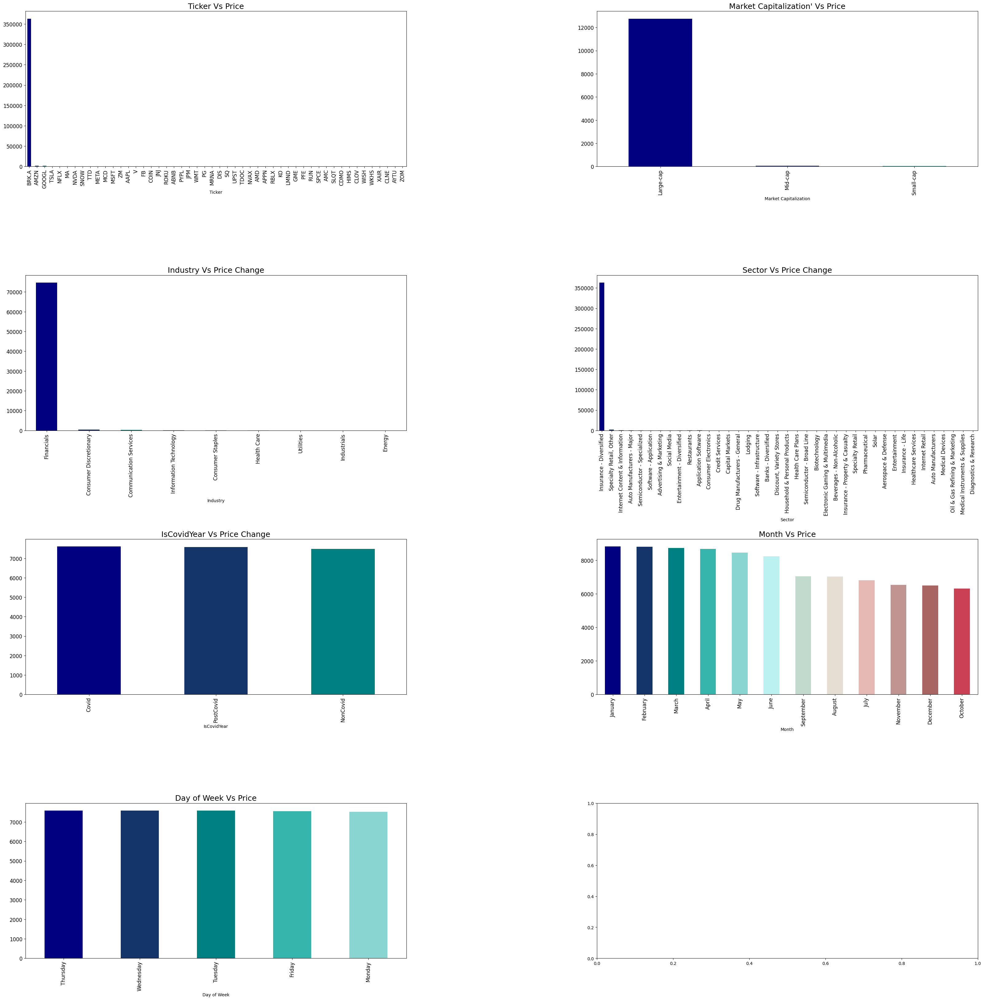

In [34]:
### RUn with BRK.

fig, axarr = plt.subplots(4, 2, figsize=(40, 40))
newstocks_df.groupby('Ticker')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][0], fontsize=12, color = custom_palette)
axarr[0][0].set_title("Ticker Vs Price", fontsize=18)
newstocks_df.groupby('Market Capitalization')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[0][1], fontsize=12, color = custom_palette)
axarr[0][1].set_title("Market Capitalization' Vs Price", fontsize=18)
newstocks_df.groupby('Industry')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][0], fontsize=12, color = custom_palette)
axarr[1][0].set_title("Industry Vs Price Change", fontsize=18)
newstocks_df.groupby('Sector')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[1][1], fontsize=12, color = custom_palette)
axarr[1][1].set_title("Sector Vs Price Change", fontsize=18)
newstocks_df.groupby('IsCovidYear')['Close'].mean().sort_values(ascending=False).head(10).plot.bar(ax=axarr[2][0], fontsize=12, color = custom_palette)
axarr[2][0].set_title("IsCovidYear Vs Price Change", fontsize=18)
newstocks_df.groupby('Month')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[2][1], fontsize=12, color = custom_palette )
axarr[2][1].set_title("Month Vs Price", fontsize=18)
newstocks_df.groupby('Day of Week')['Close'].mean().sort_values(ascending=False).plot.bar(ax=axarr[3][0], fontsize=12 , color = custom_palette)
axarr[3][0].set_title("Day of Week Vs Price", fontsize=18)

plt.subplots_adjust(hspace=0.7)
plt.subplots_adjust(wspace=0.5)
#sns.despine(palette = custom_palette)

                  



BIVARIATE VISUALIZATION NUMERICALS PREDICTORS VS NUMERICAL TARGET VARIABLE 

<Figure size 1300x1700 with 0 Axes>

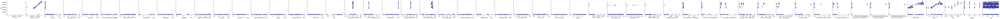

In [35]:
import seaborn as sns
import pandas as pd

plt.figure(figsize=(13,17))
# create sample dataframe
df = newstocks_df

# create pair plot
sns.pairplot(df, y_vars=['Close'], x_vars=['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day']
            )


<Figure size 1300x1700 with 0 Axes>

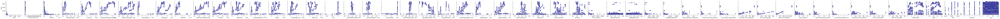

In [36]:
# WITHOUT BRK

import seaborn as sns
import pandas as pd

plt.figure(figsize=(13,17))
# create sample dataframe
df = filterednewstock_df

# create pair plot
sns.pairplot(df, y_vars=['Close'], x_vars=['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day']
            )


Summary from BiVariate Visualization  (Numerical Predictors vs Close)

- Price has a strong positive correlation with  Propertyplantequipment, inventoy, current assest, equity, current liability, revenue, profit, market capitalization, enterprisevalue

- Negative correlation btw price and capital expenditure.

- Social sentiments data and ESG data couldn't see a clear pattern with the scatterplot

- Insider trading data shows positive correlation with price 





In [37]:
import pandas as pd

# Assuming your DataFrame is named 'df'
filterednewstock_df = newstocks_df[newstocks_df['Ticker'] != 'BRK.A']


### Multivariate analysis

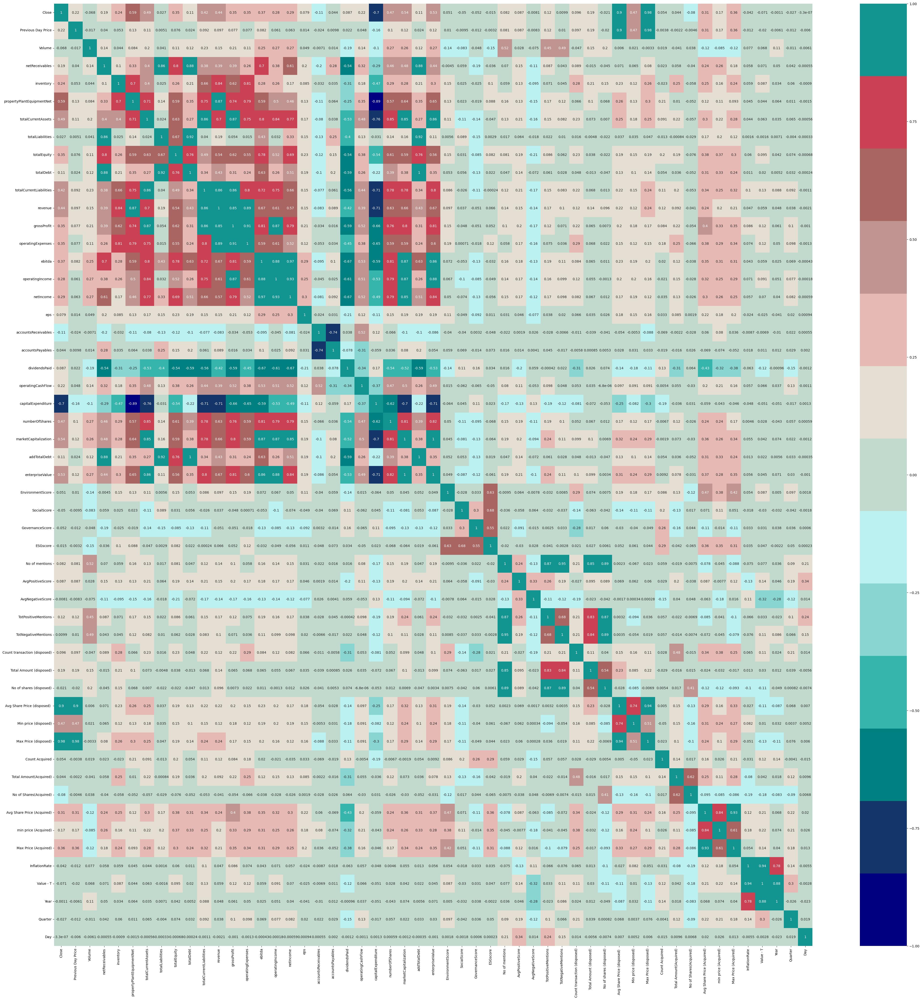

In [38]:
plt.figure(figsize=(50, 50))
sns.heatmap(filterednewstock_df.corr(), annot = True, vmin = -1, vmax = 1, cmap = custom_palette)
plt.show()

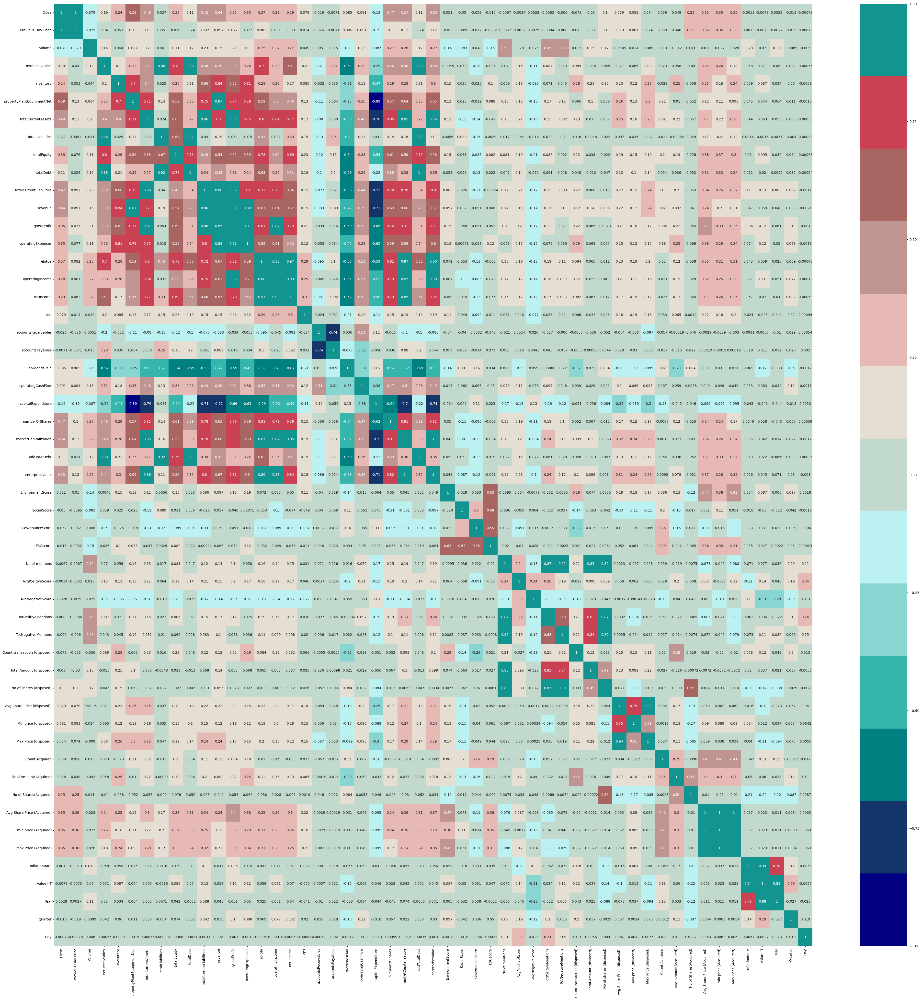

In [39]:
plt.figure(figsize=(50, 50))
sns.heatmap(newstocks_df.corr(), annot = True, vmin = -1, vmax = 1, cmap= custom_palette)
plt.show()

summary for multivariate analysis btw variables 

- fundamental data have a strong correlation between each other. 
- Capital expenditure shares a high negative correlation with most variables
- ESG Data has a positive correlation with count of shares transaction disposed and count acquired 
- Volume of shares sold has a strong postive correlation with Social sentiments data - No of mentions 
- Insider trading data - especially the count of disposed shares has a strong positive correlation with social sentiments data - No of mentions 
- negative social sentiment has a negative correlation relationship with GDP
-Inflation rate has a negative relationship with no of shares acquired 
- enterprise values and market capitalization has a good positive correlation with a lot of variables. 


Insider trader analysis vs Price

ESG Analysis of TESLA vs Price

Social Sentiment Analysis of TESLA VS PRICE 

Summary for one stock price analysis - case study Tesla 

### Feature selection for categorical using CHISQUARE TO CHECK ASSOCIATIOn (using Price change as categorical target and the categorical predictors)

We ndefine the null hypothesis and alternate hypothesis. 

H₀ (Null Hypothesis) — that the 2 categorical variables to be compared are independent of each other.
H₁ (Alternate Hypothesis) — that the 2 categorical variables being compared are dependent on each other.

And we draw conclusions based on the following p-value conditions:

p < 0.05 — this means the two categorical variables are correlated.
p > 0.05 — this means the two categorical variables are not correlated.


In [40]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Industry'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [41]:


from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(filterednewstock_df['Price Change'], filterednewstock_df['Industry'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [42]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Sector'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [43]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['IsCovidYear'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [44]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Day of Week'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.056446676444705184


In [45]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Market Capitalization'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


In [46]:
from scipy import stats
%matplotlib inline

cont_table = pd.crosstab(newstocks_df['Price Change'], newstocks_df['Ticker'])
# print the contingency table
cont_table

chi2, p_val, dof, expected = stats.chi2_contingency(cont_table)
print(f"p-value: {p_val}")


p-value: 0.0


#### Summary result for CHISQUARE TEST OF INDEPENDENCE 
- day of week has a pvalue greater than 0.05, however we accept the null hypothesis, that there is no association between price change and day of week.
- Most of the categorical predictors had chisquare less than 0.05, however we reject the null hypothesis; we agree that theres a relationship with all the other categorical columns and price change.



### ANOVA TEST - Feature Selection methods for (Categorical Predictors and numerical target)

The ANOVA test is used to measure the strength of the correlation between variables in both cases. ANOVA is an abbreviation for Analysis Of Variance and determines if there are significant differences between the means of numeric variables for each categorical value. A box plot is also a visual representation of this data.

Null hypothesis(H0) ANOVA hypothesis test: The variables are not correlated with each other

In [47]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Sector')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.0


In [48]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Industry')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.0


In [49]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Ticker')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.0


In [50]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Day of Week')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.9999630812390657


In [51]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Year')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.20224592916780035


In [52]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Month')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.014218932627778048


In [53]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('Market Capitalization')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  6.174912053750741e-203


In [54]:
# Generating sample data
import pandas as pd

########################################################
# f_oneway() function takes the group data as input and
# returns F-statistic and P-value
from scipy.stats import f_oneway
 
# Running the one-way anova test between CarPrice and FuelTypes
# Assumption(H0) is that FuelType and CarPrices are NOT correlated
 
# Finds out the Prices data for each FuelType as a list
CategoryGroupLists=newstocks_df.groupby('IsCovidYear')['Close'].apply(list)
 
# Performing the ANOVA test
# We accept the Assumption(H0) only when P-Value &gt; 0.05
AnovaResults = f_oneway(*CategoryGroupLists)
print('P-Value for Anova is: ', AnovaResults[1])

P-Value for Anova is:  0.9725653653097632


#### Summary of Anova Test 

- Based on Anova test variables like IsCovidYear, Day of week, Year showed no association or correlation as their PValue was higher than 0.05, however we accept the null hypothesis. 

- all the other categorical predictors had pvalue score less than 0.05, hence we reject the null hypothesis. theres a relationship between close price and the other predictors - sector, industry, tickers, market capitalization, month


In [55]:
newstocks_df

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
0,155.00,155.85,Decrease,98944633,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-17,2023,1,March,17,Friday
1,155.85,152.99,Increase,76254419,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-16,2023,1,March,16,Thursday
2,152.99,152.59,Increase,77167866,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-15,2023,1,March,15,Wednesday
3,152.59,150.47,Increase,73695893,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-14,2023,1,March,14,Tuesday
4,150.47,148.50,Increase,84457122,AAPL,Large-cap,Information Technology,Consumer Electronics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PostCovid,2023-03-13,2023,1,March,13,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,2.03,1.99,Increase,12975,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-08,2018,1,January,8,Monday
64507,1.99,1.85,Increase,33562,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,199138944.40,0.00,196004024.40,58.54,60.12,67.74,62.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.00,44800.00,224000.00,0.20,0.20,0.20,2.10,20.83,NonCovid,2018-01-05,2018,1,January,5,Friday
64508,1.85,1.88,Decrease,6242,ZOM,Small-cap,Health Care,Diagnostics & Research,69381.00,0.00,0.00,4015140.00,1266324.00,3629234.00,0.00,1266324.00,0.00,0.00,2169844.00,-2133943.00,-2169844.00,-2171328.00,-0.02,0.00,0.00,0.00,-1707794.00,-13219.00,90517702.00,19913

### Statistical Analysis for Numerical Variables

newstocks_df.describe()

In [56]:
result = newstocks_df[newstocks_df['Close'] == 0.067]
result

,Close,Previous Day Price,Price Change,Volume,Ticker,Market Capitalization,Industry,Sector,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,IsCovidYear,Date,Year,Quarter,Month,Day,Day of Week
63796,0.07,0.07,Decrease,14251951,ZOM,Small-cap,Health Care,Diagnostics & Research,0.00,0.00,583007.00,61991703.00,-1226844.00,51065863.00,1054720.00,1501416.00,0.00,0.00,14055876.00,136584.00,-4128492.00,16912.00,0.00,0.00,-51773.00,0.00,-2683080.00,-16181.00,890245654.00,205290647.81,1054720.00,144353664.81,58.28,64.13,67.17,63.20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.18,21.59,Covid,2020-11-02,2020,4,November,2,Monday


### Treating Missing Values with Imputation

#### Insights from this for numerical variable  - Take screenshot 


KNN was used because it is the most appropriate algorithm for this type of imputation. for fundamentals, picking the nearest neighbor for missing data would work better than using its mean or median or just deleting the figures. 

We must need business knowledge or common insights about the data. Due to domain knowledge we went for KNN Imputations. 

- Price information is right as the lowest is 0.06 for 'Ticker' and highest price is 'ticker' which traded at 539,180 at the said date.

- Fundamental information had missing values and KNN imputation was used to impute this records. 

- For ESG data, based on domain knowledge, KNN was better for this imputation than using median, or mean because it gives the performance per period so the missing details would be closer to their nearest neighbors.

- For Sentiments data, which had the highest number of missing information; having just 2 years data, 2021 and 2022; this dataset would be removed from the analysis and another analysis would be done to narrow on just those two years. Imputation would not be the best line of action due to high volatility of news. 

- For insider trading information, KNN was used to impute this. 





### We have broken the samples into the below datasets

All Imputed Data 

df_imputed - imputed all, did not treat outliers, log transform, scaled, dummies

Imputed Data - without tweet data - df_impute_drop

Imputed Data - leaving some data as 0  - df_imputed_some


2 years Data - df_sentiments


Fundamental Only - df_fundamentals


df_numerical_imputed_trainset - Imputed both missing values and outliers, log transformation and scaled.



#### write comments about this table 

### Imputation of missing values with KNN

In [57]:
#Code for imputing all

import pandas as pd
import numpy as np
from sklearn.impute import KNNImputer

# create sample dataframe with missing values and categorical columns
df = pd.DataFrame(newstocks_df)

# select only the numerical columns
df_numerical = df.select_dtypes(include=np.number)

# replace zeros with NaN
df_numerical = df_numerical.replace(0, np.nan)

# instantiate KNN imputer with k=3
imputer = KNNImputer(n_neighbors=3)

# impute missing and zero values in the numerical columns
df_numerical_imputed = pd.DataFrame(imputer.fit_transform(df_numerical), columns=df_numerical.columns)

# replace NaN back to zeros
df_numerical_imputed = df_numerical_imputed.replace(np.nan, 0)

# combine the imputed numerical columns with the original categorical columns
df_imputed = pd.concat([df.select_dtypes(exclude=np.number), df_numerical_imputed], axis=1)

# display the resulting dataframe
print()
df_imputed

,Price Change,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
0,Decrease,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2023-03-17,March,Friday,155.00,155.85,98944633.00,14081239333.33,1813811333.33,13445167957.33,37477071333.33,92872242000.00,19278804666.67,39898010000.00,43304748000.00,27673042000.00,11975412666.67,4287558000.00,8859461333.33,7687854666.67,6476644666.67,0.29,1097997155.00,-1452217333.33,-2526566666.67,7627206000.00,-701150000.00,5410721707.33,763444996640.00,39898010000.00,794158267969.27,74.77,68.26,71.06,71.36,3095.67,0.63,-0.72,1304.67,1931.67,12.33,63116880.33,757188.67,99.74,142.85,117.03,7.67,319558.67,1163108.67,8.36,14.55,9.91,4.58,23.12,2023.00,1.00,17.00
1,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2023-03-16,March,Thursday,155.85,152.99,76254419.00,31613619666.67,3376072333.33,26910748290.67,83299202333.33,189283454333.33,38272235666.67,80620505000.00,87252207333.33,57203354333.33,24456873000.00,8118945666.67,18736397333.33,16337927333.33,14152989000.00,0.81,-1879333333.33,5255891333.33,-2490233333.33,15071936333.33,-1794241666.67,10898121020.33,1541777346226.67,80620505000.00,1603157148557.97,66.64,62.19,65.49,64.77,4765.67,0.77,-0.87,1816.67,2331.33,4.33,3256195.00,127215.00,50.18,90.88,54.78,5.33,3837874.00,468725.00,8.18,20.91,19.68,5.42,23.54,2023.00,1.00,16.00
2,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2023-03-15,March,Wednesday,152.99,152.59,77167866.00,859000.00,4217000.00,288610.33,69607000.00,207363000.00,-135293000.00,1515000.00,20622000.00,30063000.00,20619000.00,26837000.00,-5808000.00,-6218000.00,-6033000.00,-0.17,3585333333.33,674000.00,-2402000000.00,-5191000.00,-725000.00,34610061.00,346100610.00,1515000.00,321507603.90,87.15,77.39,69.59,78.04,4731.67,0.76,-0.87,1797.67,2342.00,3.67,2980120.33,26269.00,99.99,95.45,114.17,5.33,449781.33,521029.33,14.09,20.91,29.76,2.12,21.48,2023.00,1.00,15.00
3,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2023-03-14,March,Tuesday,152.59,150.47,73695893.00,859000.00,4217000.00,288610.33,69607000.00,207363000.00,-135293000.00,1515000.00,20622000.00,30063000.00,20619000.00,26837000.00,-5808000.00,-6218000.00,-6033000.00,-0.17,-6817333333.33,674000.00,-3121666666.67,-5191000.00,-725000.00,34610061.00,346100610.00,1515000.00,321507603.90,87.15,77.39,69.59,78.04,4765.67,0.77,-0.87,1816.67,2331.33,21.33,1453381559.33,17213407.00,87.61,107.44,138.15,4.33,2123589.00,1888462.00,6.49,2.73,9.09,2.12,21.48,2023.00,1.00,14.00
4,Increase,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2023-03-13,March,Monday,150.47,148.50,84457122.00,20311239333.33,1651478000.00,14039202277.00,45181404666.67,100832575333.33,16800471333.33,40024010000.00,51341081333.33,30068708666.67,12712079333.33,4418224666.67,9445794666.67,8293854666.67,6902978000.00,0.32,-2105331909.67,5185782666.67,-3603000000.00,8038872666.67,-1096816666.67,5366534040.67,804047521826.67,40024010000.00,836172126489.27,79.02,69.12,67.28,71.81,3095.67,0.63,-0.72,1304.67,1931.67,13.00,3678004.67,18

In [58]:
df_imputed.corr()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Close,1.00,1.00,-0.08,-0.01,-0.07,-0.07,-0.09,-0.04,-0.09,-0.07,-0.10,-0.07,-0.09,-0.09,-0.09,0.09,-0.08,-0.04,-0.05,-0.01,-0.08,0.08,-0.15,-0.08,-0.08,-0.07,-0.08,0.26,0.21,0.12,0.29,-0.06,-0.06,-0.16,-0.11,-0.07,-0.06,-0.01,0.06,0.34,0.37,0.30,-0.05,0.15,0.11,0.15,0.15,0.15,0.00,0.04,0.00,-0.02,-0.00
Previous Day Price,1.00,1.00,-0.08,-0.01,-0.07,-0.07,-0.09,-0.04,-0.09,-0.07,-0.10,-0.07,-0.09,-0.09,-0.09,0.09,-0.08,-0.04,-0.05,-0.01,-0.08,0.08,-0.15,-0.08,-0.08,-0.07,-0.08,0.26,0.21,0.12,0.29,-0.06,-0.06,-0.16,-0.11,-0.07,-0.06,-0.01,0.06,0.34,0.37,0.30,-0.05,0.15,0.11,0.15,0.15,0.15,0.00,0.04,0.00,-0.02,-0.00
Volume,-0.08,-0.08,1.00,0.11,0.03,0.05,0.17,0.03,0.09,0.10,0.18,0.12,0.18,0.10,0.22,0.24,0.25,0.05,-0.02,0.01,-0.17,0.12,-0.05,0.24,0.23,0.10,0.23,-0.10,-0.07,-0.04,-0.11,0.13,-0.20,0.13,0.07,0.12,0.04,0.07,0.06,0.07,0.08,0.08,-0.04,-0.03,-0.04,-0.01,-0.01,-0.01,0.07,0.06,0.11,-0.01,-0.01
netReceivables,-0.01,-0.01,0.11,1.00,0.23,0.33,0.64,0.87,0.82,0.89,0.64,0.40,0.50,0.27,0.70,0.38,0.61,0.21,-0.21,0.31,-0.60,0.33,-0.35,0.45,0.47,0.89,0.43,0.01,0.06,-0.17,-0.01,-0.00,-0.23,0.24,-0.13,-0.04,0.07,-0.00,-0.00,0.05,0.05,0.06,-0.03,-0.01,-0.01,0.02,0.02,0.02,0.08,0.10,0.11,-0.03,-0.01
inventory,-0.07,-0.07,0.03,0.23,1.00,0.71,0.42,0.16,0.36,0.33,0.65,0.84,0.59,0.78,0.35,0.23,0.22,0.12,-0.11,0.07,-0.37,0.20,-0.50,0.32,0.34,0.33,0.35,0.04,-0.02,-0.09,-0.01,-0.00,-0.24,0.20,-0.12,-0.02,0.11,0.06,0.06,0.10,0.09,0.12,-0.03,-0.01,0.02,-0.01,-0.01,-0.01,0.07,0.08,0.08,0.02,-0.01
propertyPlantEquipmentNet,-0.07,-0.07,0.05,0.33,0.71,1.00,0.70,0.14,0.58,0.36,0.75,0.88,0.70,0.77,0.60,0.47,0.46,0.13,-0.15,0.08,-0.55,0.34,-0.89,0.60,0.69,0.36,0.69,0.06,-0.00,-0.06,0.02,-0.01,-0.31,0.26,-0.17,-0.04,0.06,0.04,0.03,0.11,0.09,0.12,-0.02,-0.05,-0.00,-0.01,-0.01,-0.01,0.07,0.08,0.14,-0.06,-0.01
totalCurrentAssets,-0.09,-0.09,0.17,0.64,0.42,0.70,1.00,0.37,0.81,0.57,0.88,0.72,0.83,0.69,0.89,0.75,0.82,0.21,-0.16,0.14,-0.79,0.45,-0.69,0.83,0.84,0.57,0.83,0.04,-0.08,-0.21,-0.07,-0.01,-0.40,0.41,-0.22,-0.07,0.13,0.03,0.01,0.08,0.07,0.09,-0.01,0.00,-0.02,-0.01,-0.01,-0.01,0.04,0.06,0.07,-0.01,-0.01
totalLiabilities,-0.04,-0.04,0.03,0.87,0.16,0.14,0.37,1.00,0.70,0.92,0.41,0.20,0.23,0.04,0.45,0.05,0.35,0.17,-0.13,0.27,-0.36,0.15,-0.12,0.15,0.16,0.92,0.11,0.00,0.07,-0.15,-0.00,-0.03,-0.11,0.15,-0.06,-0.03,0.02,-0.00,-0.00,-0.00,-0.00,0.01,-0.01,-0.02,-0.01,-0.00,-0.00,-0.00,0.02,0.03,0.06,-0.06,-0.01
totalEquity,-0.09,-0.09,0.09,0.82,0.36,0.58,0.81,0.70,1.00,0.78,0.70,0.55,0.69,0.56,0.79,0.52,0.71,0.24,-0.16,0.18,-0.75,0.38,-0.54,0.61,0.59,0.78,0.56,0.11,0.03,-0.09,0.06,-0.03,-0.37,0.35,-0.21,-0.07,0.11,0.01,0.00,0.03,0.02,0.04,-0.01,-0.01,-0.03,-0.01,-0.01,-0.01,0.08,0.11,0.11,0.00,-0.01
totalDebt,-0.07,-0.07,0.10,0.89,0.33,0.36,0.57,0.92,0.78,1.00,0.66,0.43,0.43,0.26,0.64,0.26,0.52,0.21,-0.12,0.23,-0.57,0.26,-0.30,0.39,0.39,1.00,0.35,-0.00,0.02,-0.16,-0.04,0.00,-0.20,0.24,-0.09,-0.03,0.06,0.00,0.00,0.04,0.04,0.06,-0.01,-0.02,-0.01,-0.01,-0.01,-0.01,0.03,0.04,0.07,-0.04,-0.01


In [59]:
newstocks_df.corr()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Close,1.00,1.00,-0.08,0.19,0.24,0.59,0.49,0.03,0.35,0.11,0.42,0.44,0.35,0.35,0.37,0.28,0.29,0.08,-0.03,-0.01,0.08,0.09,-0.19,0.47,0.54,0.11,0.53,0.05,-0.05,-0.05,-0.01,-0.01,-0.00,0.00,-0.01,-0.01,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,-0.01,0.00,-0.02,-0.00
Previous Day Price,1.00,1.00,-0.08,0.04,0.05,0.13,0.11,0.01,0.08,0.02,0.09,0.10,0.08,0.08,0.08,0.06,0.06,0.01,-0.03,-0.01,0.08,0.09,-0.19,0.10,0.12,0.02,0.12,0.01,-0.01,-0.01,-0.00,-0.01,-0.00,0.00,-0.01,-0.01,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.36,0.36,0.36,-0.00,-0.01,0.00,-0.02,-0.00
Volume,-0.08,-0.08,1.00,0.14,0.04,0.08,0.20,0.04,0.11,0.12,0.23,0.15,0.21,0.11,0.25,0.27,0.27,0.05,-0.01,0.01,-0.20,0.13,-0.09,0.27,0.26,0.12,0.27,-0.14,-0.08,-0.05,-0.15,0.52,0.03,-0.07,0.45,0.49,-0.04,0.15,0.17,-0.00,0.01,-0.01,0.01,-0.04,0.01,-0.03,-0.03,-0.03,0.08,0.07,0.11,-0.01,-0.01
netReceivables,0.19,0.04,0.14,1.00,0.10,0.33,0.40,0.86,0.80,0.88,0.38,0.39,0.39,0.26,0.70,0.38,0.61,0.20,-0.20,0.28,-0.54,0.32,-0.29,0.46,0.48,0.88,0.44,-0.00,0.06,-0.19,-0.04,0.07,0.15,-0.11,0.09,0.04,0.09,-0.02,-0.04,0.07,0.06,0.08,0.02,0.06,-0.04,0.24,0.26,0.18,0.06,0.07,0.05,0.04,-0.00
inventory,0.24,0.05,0.04,0.10,1.00,0.70,0.40,0.03,0.26,0.21,0.66,0.84,0.62,0.81,0.28,0.26,0.17,0.09,-0.03,0.04,-0.31,0.18,-0.47,0.29,0.28,0.21,0.30,0.15,0.02,-0.02,0.10,0.06,0.13,-0.10,0.07,0.04,0.28,0.21,0.15,0.23,0.12,0.26,-0.02,0.25,-0.06,0.25,0.16,0.24,0.06,0.09,0.03,0.06,-0.00
propertyPlantEquipmentNet,0.59,0.13,0.08,0.33,0.70,1.00,0.71,0.14,0.59,0.35,0.75,0.87,0.74,0.79,0.59,0.50,0.46,0.13,-0.11,0.06,-0.25,0.35,-0.89,0.57,0.64,0.35,0.65,0.13,0.02,-0.02,0.09,0.16,0.13,-0.15,0.17,0.12,0.07,0.10,0.07,0.26,0.13,0.30,0.21,0.01,-0.05,0.12,0.11,0.09,0.05,0.04,0.06,0.01,-0.00
totalCurrentAssets,0.49,0.11,0.20,0.40,0.40,0.71,1.00,0.02,0.63,0.27,0.86,0.70,0.87,0.75,0.80,0.84,0.77,0.17,-0.08,0.04,-0.53,0.48,-0.76,0.85,0.85,0.27,0.86,0.11,-0.11,-0.14,-0.05,0.13,0.21,-0.16,0.15,0.08,0.23,0.07,0.01,0.25,0.18,0.25,0.09,0.22,-0.06,0.30,0.22,0.28,0.04,0.06,0.03,0.06,-0.00
totalLiabilities,0.03,0.01,0.04,0.86,0.03,0.14,0.02,1.00,0.67,0.92,0.04,0.19,0.05,0.02,0.43,0.03,0.33,0.15,-0.13,0.25,-0.40,0.13,-0.03,0.14,0.16,0.92,0.11,0.01,0.09,-0.15,0.00,0.02,0.06,-0.02,0.02,0.01,0.02,-0.00,-0.02,0.04,0.03,0.05,-0.01,-0.00,-0.03,0.17,0.20,0.12,0.00,-0.00,0.01,-0.00,-0.00
totalEquity,0.35,0.08,0.11,0.80,0.26,0.59,0.63,0.67,1.00,0.76,0.49,0.54,0.62,0.55,0.78,0.52,0.69,0.23,-0.12,0.15,-0.54,0.38,-0.54,0.61,0.59,0.76,0.56,0.15,0.03,-0.08,0.08,0.08,0.19,-0.21,0.09,0.06,0.23,0.04,-0.02,0.19,0.15,0.19,0.20,0.19,-0.08,0.38,0.37,0.30,0.06,0.10,0.04,0.07,-0.00
totalDebt,0.11,0.02,0.12,0.88,0.21,0.35,0.27,0.92,0.76,1.00,0.34,0.43,0.31,0.24,0.63,0.26,0.51,0.19,-0.10,0.20,-0.59,0.26,-0.22,0.39,0.38,1.00,0.35,0.05,0.06,-0.13,0.02,0.05,0.14,-0.07,0.06,0.03,0.05,-0.01,-0.05,0.13,0.10,0.14,0.05,0.04,-0.05,0.31,0.33,0.24,0.01,0.02,0.01,0.03,-0.00


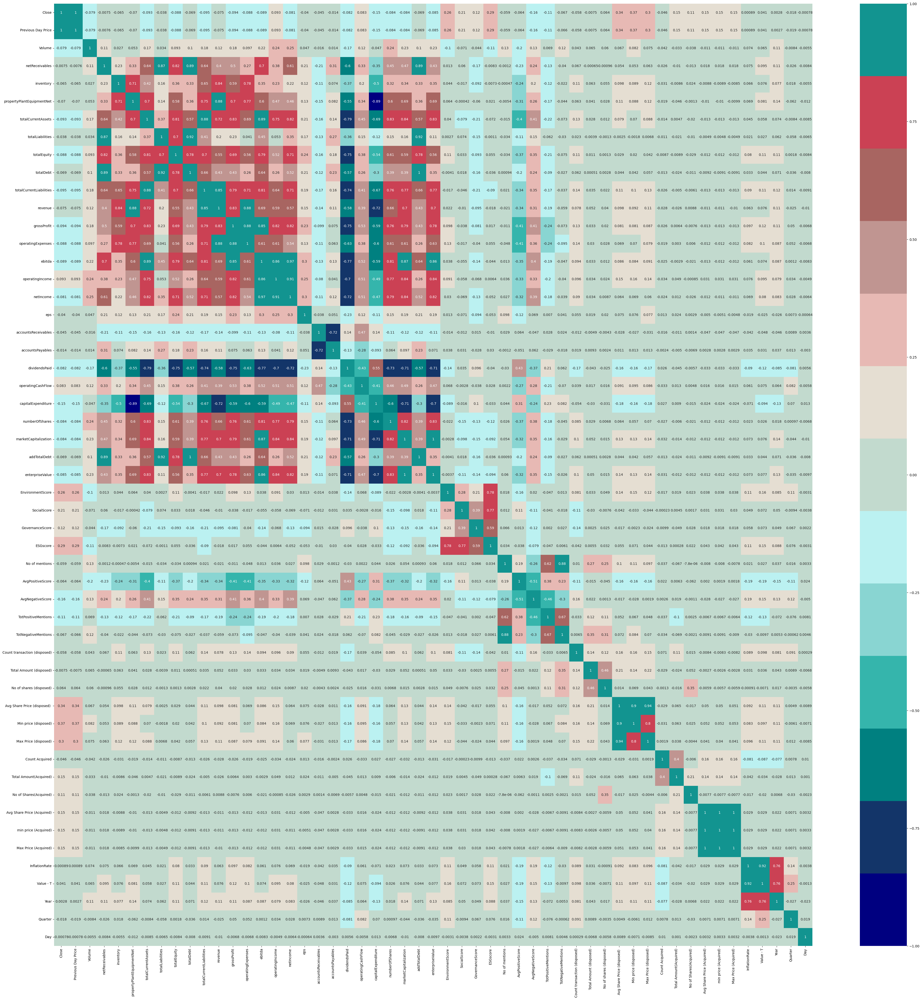

In [60]:
plt.figure(figsize=(50, 50))
sns.heatmap(df_imputed.corr(), annot = True, vmin = -1, vmax = 1, cmap= custom_palette)
plt.show()

In [61]:
newstocks_df.isnull().sum()

Close                               0
Previous Day Price                  0
Price Change                        0
Volume                              0
Ticker                              0
Market Capitalization               0
Industry                            0
Sector                              0
netReceivables                   4448
inventory                        4448
propertyPlantEquipmentNet        4448
totalCurrentAssets               4448
totalLiabilities                 4448
totalEquity                      4448
totalDebt                        4448
totalCurrentLiabilities          4448
revenue                          4246
grossProfit                      4246
operatingExpenses                4246
ebitda                           4246
operatingIncome                  4246
netIncome                        4246
eps                              4246
accountsReceivables              2808
accountsPayables                 2808
dividendsPaid                    2808
operatingCas

### Rerun Analysis 

Categorical Variables:
Index(['Price Change', 'Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'],
      dtype='object')
Numerical Variables:
['No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)']


### All Data 

All Imputed Data df_imputed, imputed all, did not treat outliers, log transform, scaled, dummies


Imputed Data - without tweet data - df_impute_drop

Imputed Data - leaving some data as 0  - df_imputed_some


2 years Data - df_sentiments


Fundamental Only - df_fundamentals


df_numerical_imputed_trainset - Imputed, outliers, log transformation and scaled.

newstocks_df_pure -  delete missing records- no imputation




rerun analysis 
feature engin\eering 

-label encoding
-scale normalize 
-PCA or select k best dimensionality reduction
-Baseline 
-SMOTE or NO SMOTE 
-Divide and model 


Close
Skew : 7.2


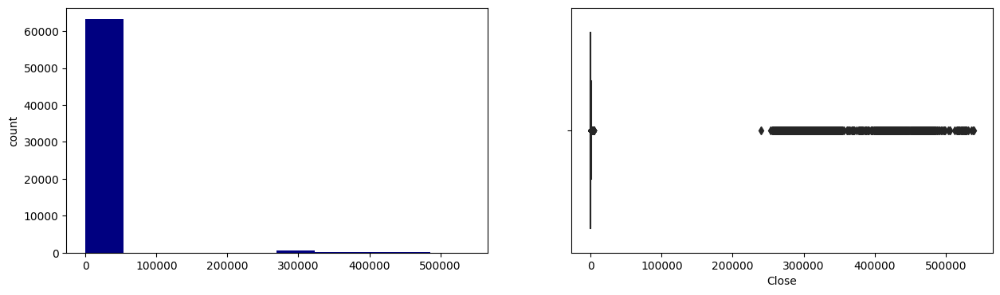

Previous Day Price
Skew : 7.2


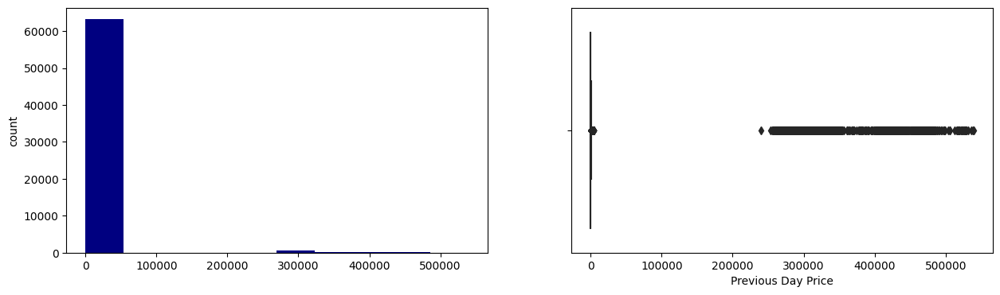

Volume
Skew : 10.26


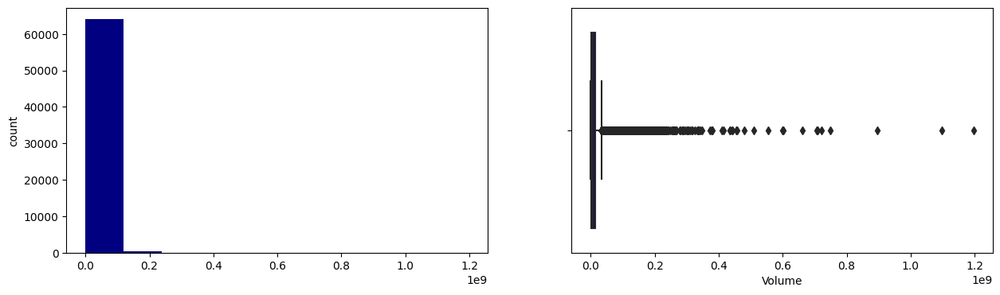

netReceivables
Skew : 4.3


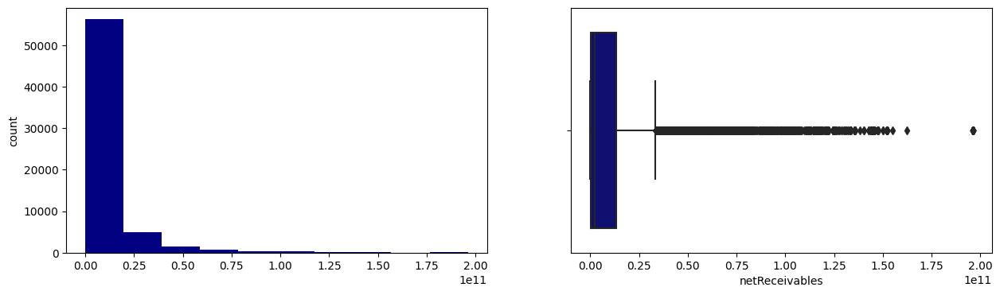

inventory
Skew : 4.05


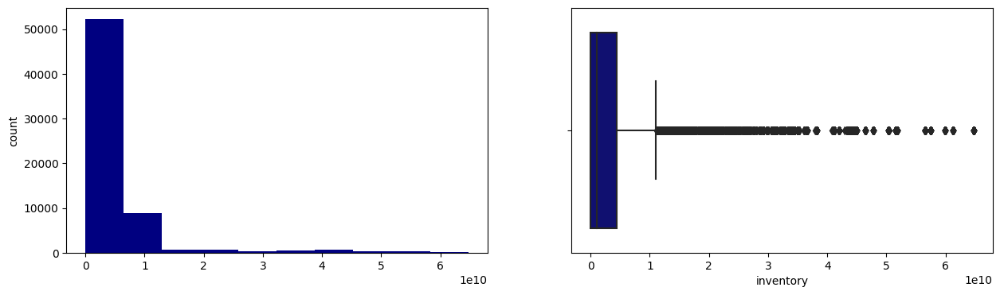

propertyPlantEquipmentNet
Skew : 3.3


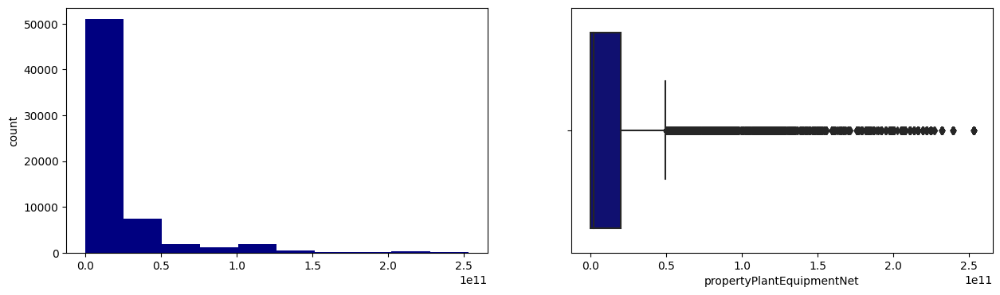

totalCurrentAssets
Skew : 1.79


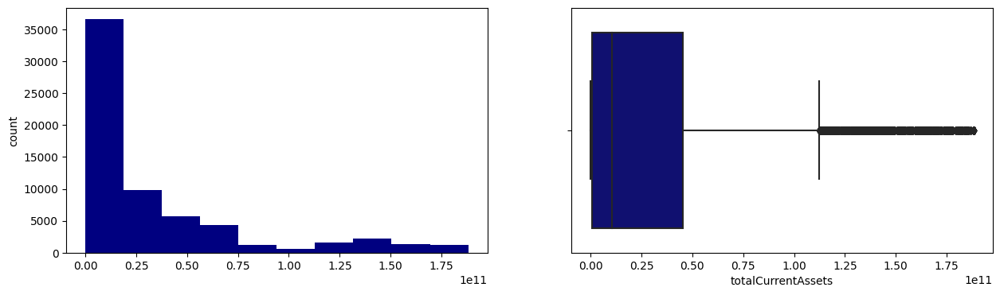

totalLiabilities
Skew : 5.9


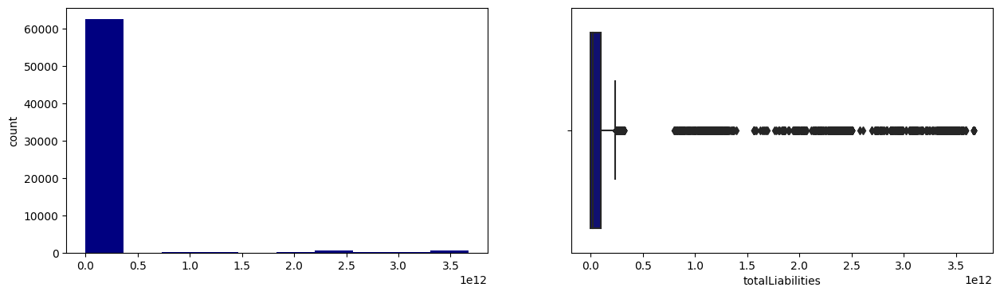

totalEquity
Skew : 2.16


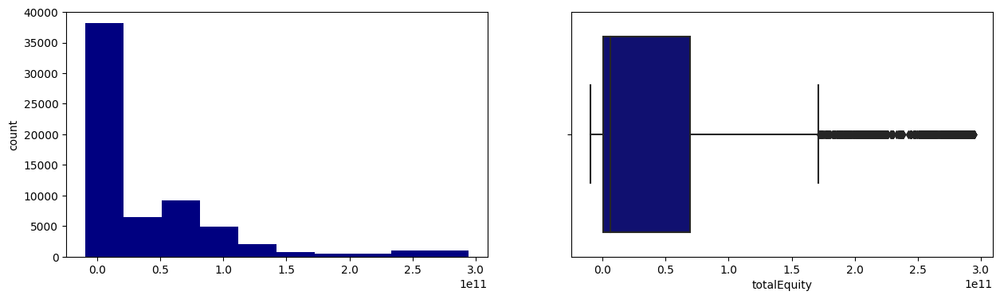

totalDebt
Skew : 4.15


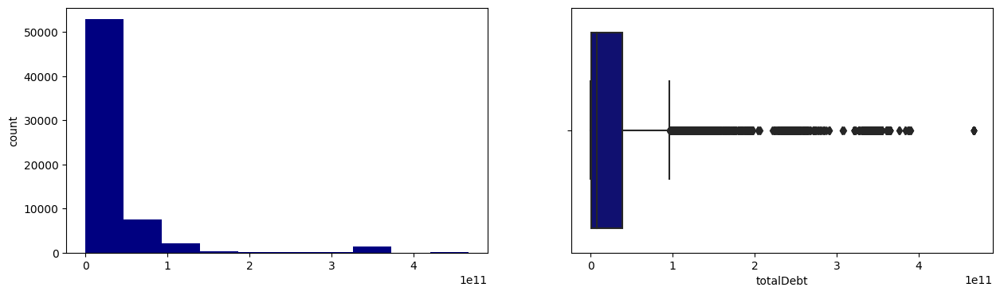

totalCurrentLiabilities
Skew : 1.86


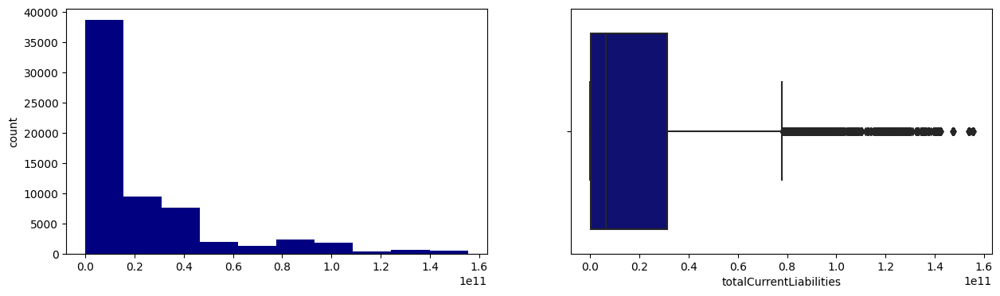

revenue
Skew : 2.91


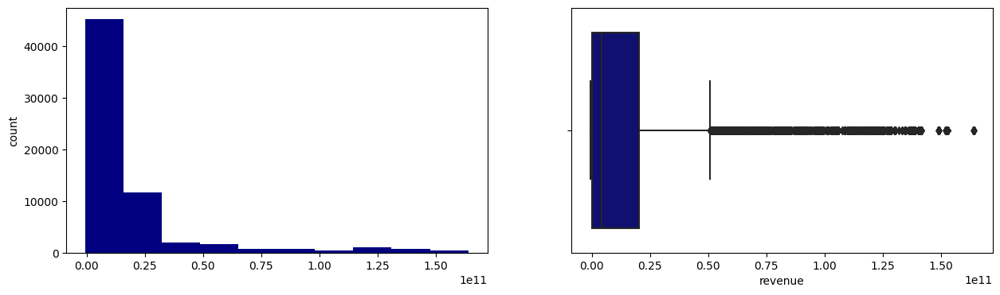

grossProfit
Skew : 1.82


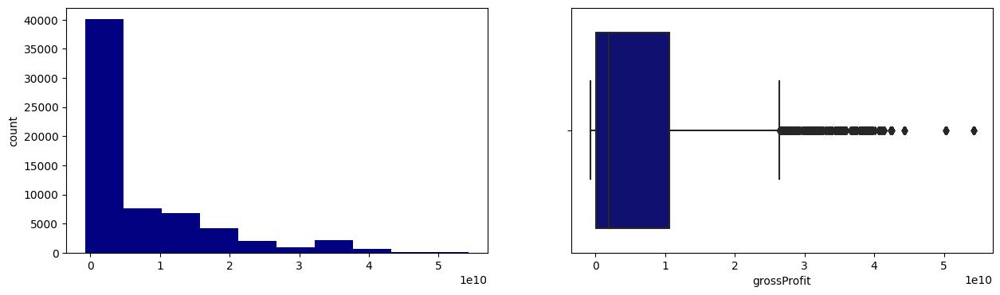

operatingExpenses
Skew : 2.29


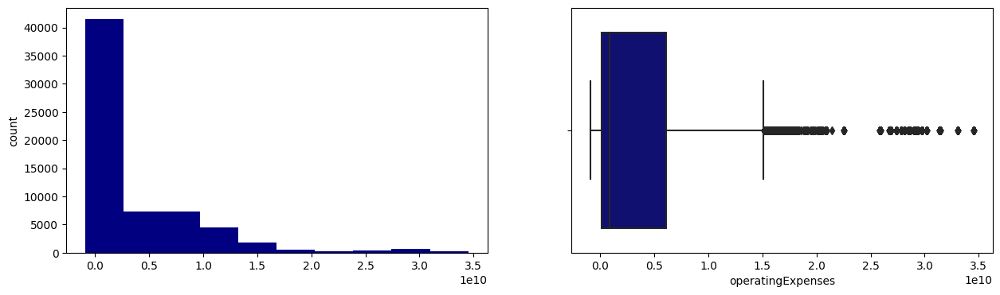

ebitda
Skew : 2.24


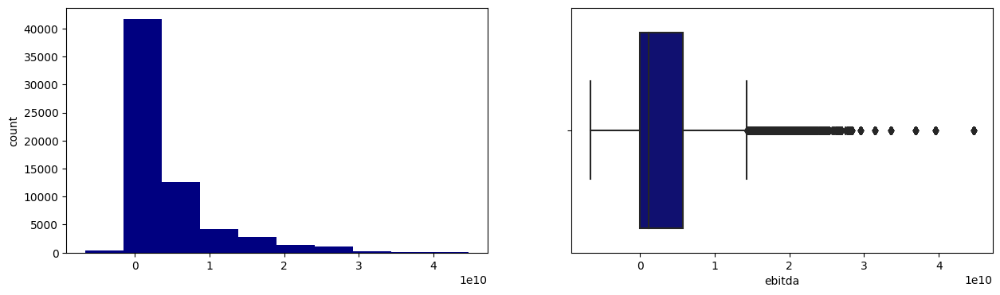

operatingIncome
Skew : 3.08


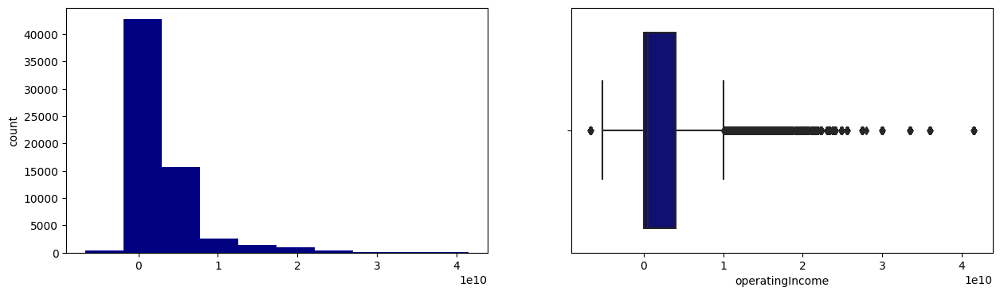

netIncome
Skew : 2.71


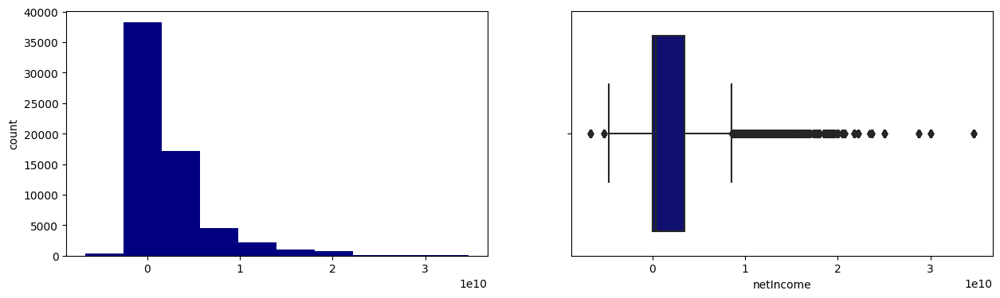

eps
Skew : -10.66


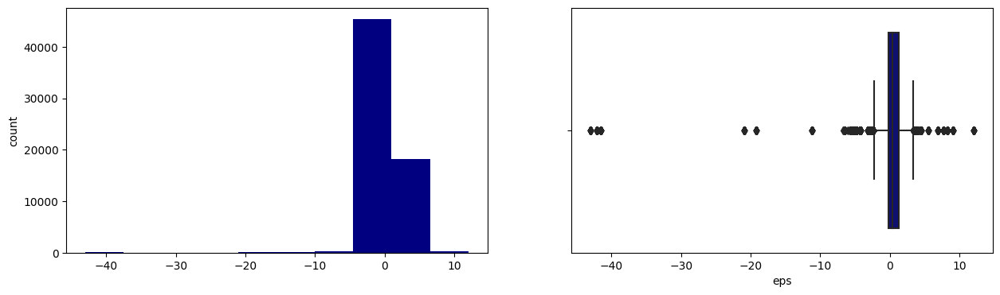

accountsReceivables
Skew : -2.33


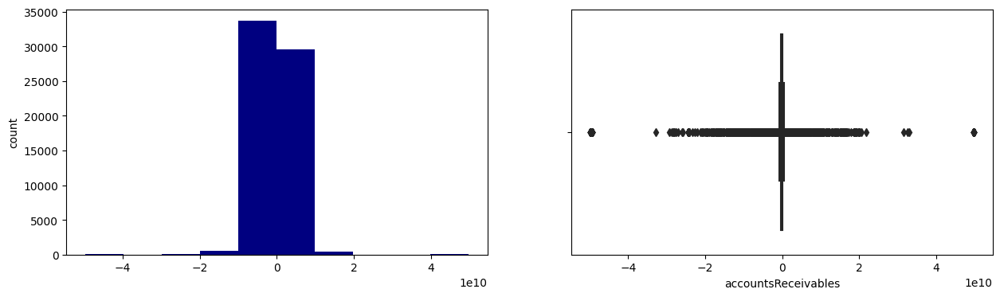

accountsPayables
Skew : 5.09


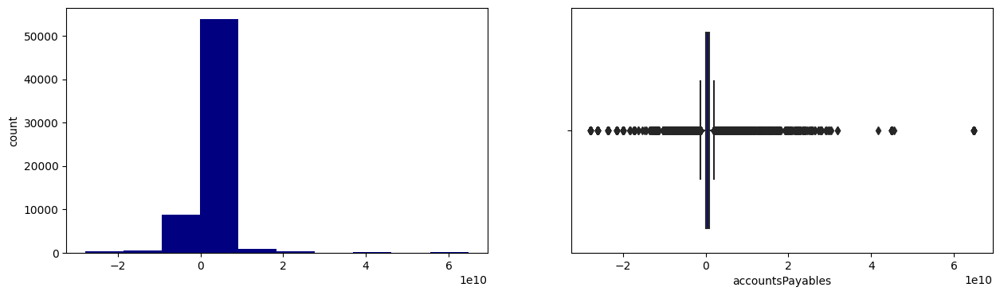

dividendsPaid
Skew : -0.93


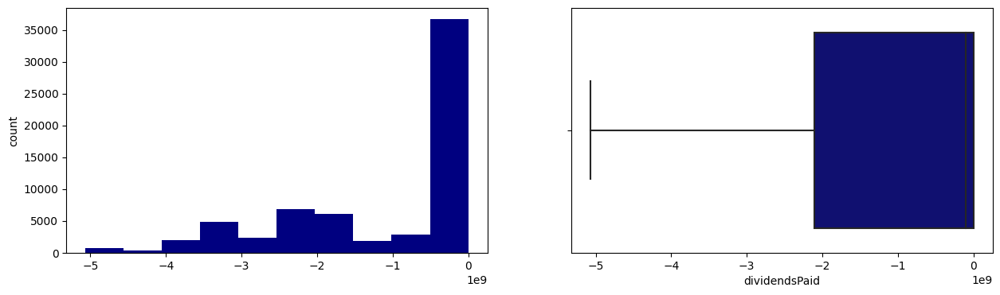

operatingCashFlow
Skew : 0.6


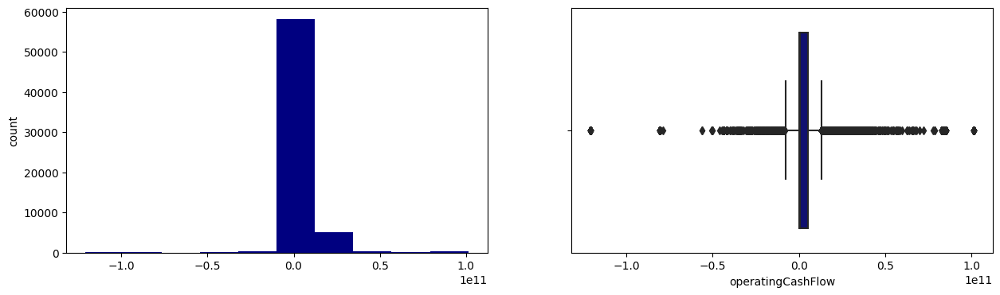

capitalExpenditure
Skew : -3.86


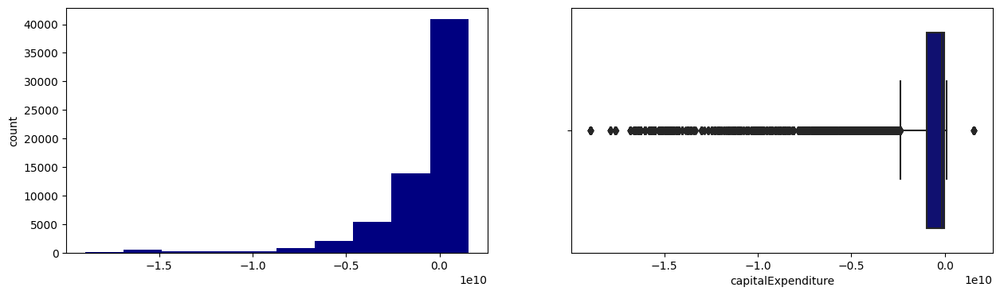

numberOfShares
Skew : 2.35


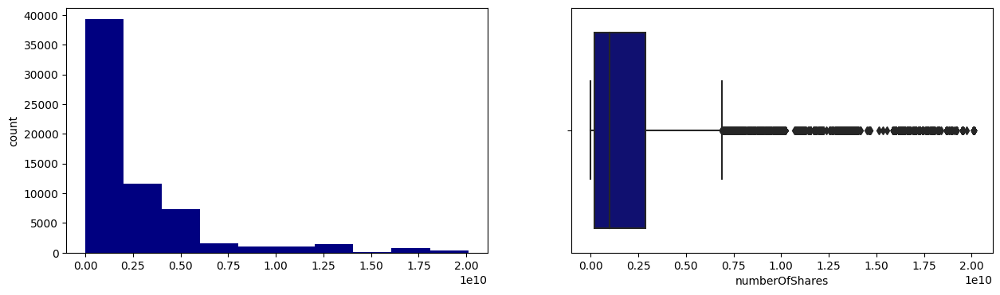

marketCapitalization
Skew : 2.79


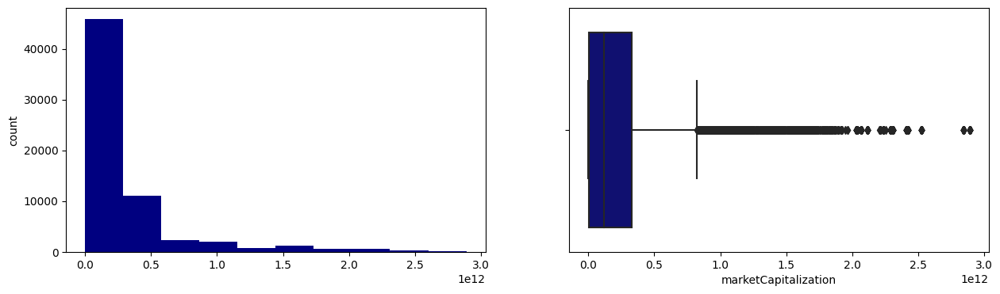

addTotalDebt
Skew : 4.15


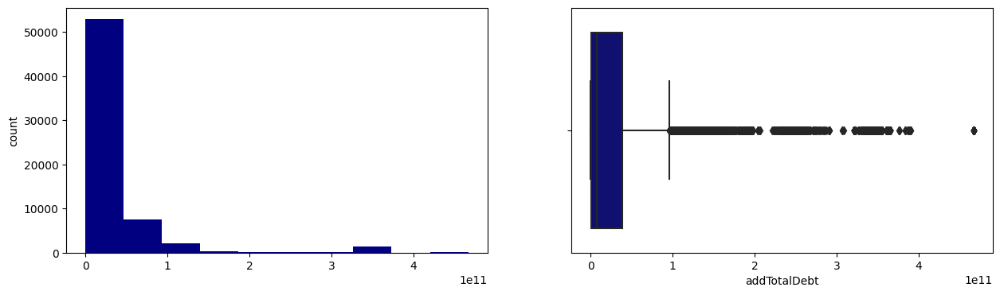

enterpriseValue
Skew : 2.78


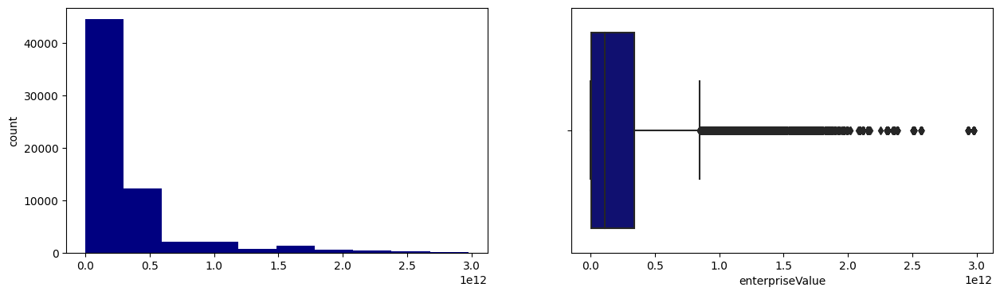

EnvironmentScore
Skew : -0.01


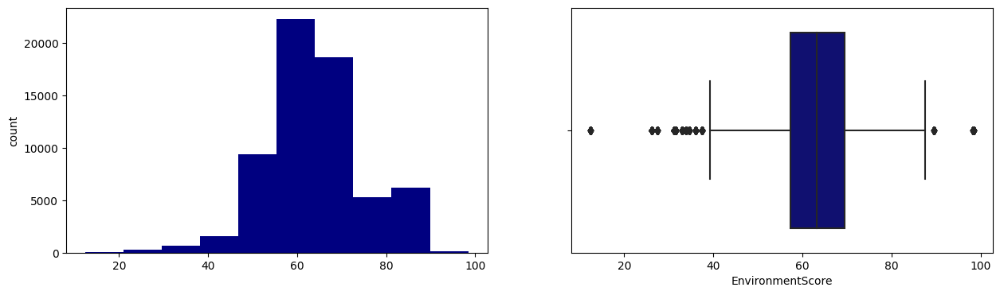

SocialScore
Skew : 0.48


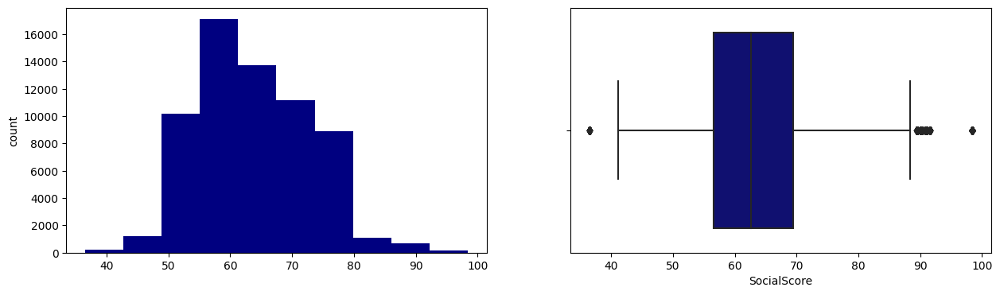

GovernanceScore
Skew : -0.21


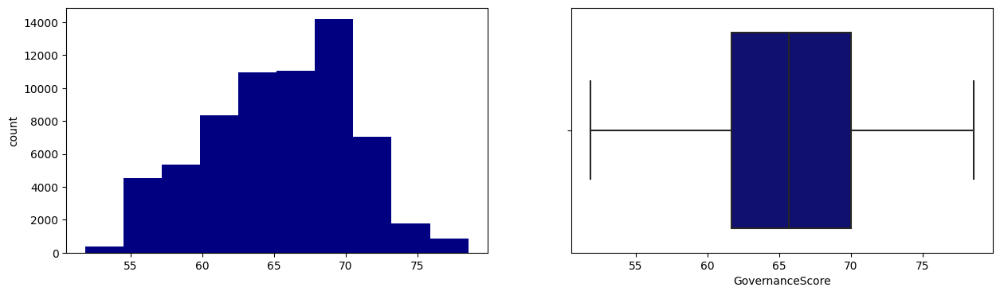

ESGscore
Skew : 0.64


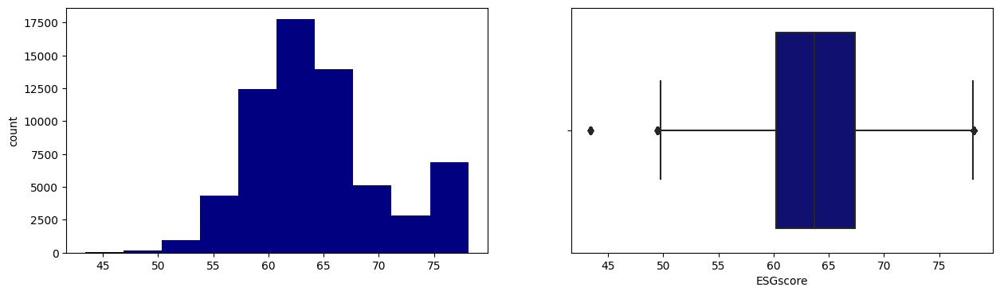

No of mentions
Skew : 9.4


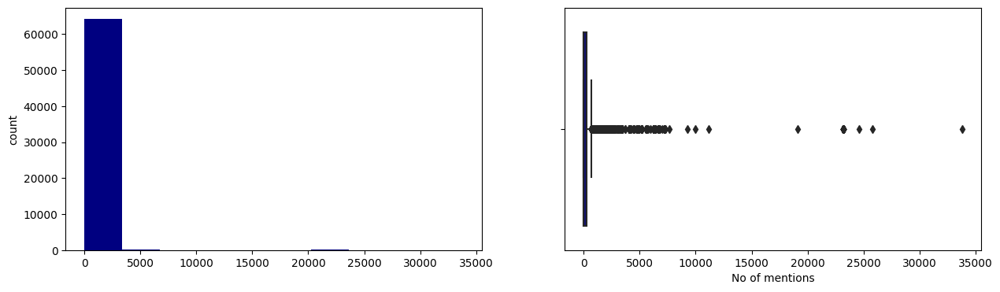

AvgPositiveScore
Skew : -0.22


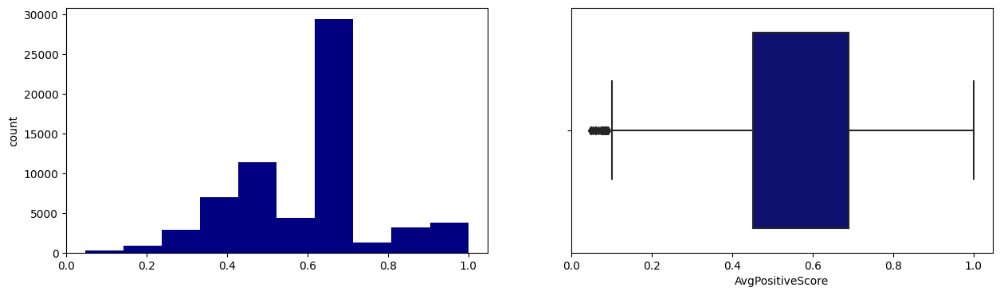

AvgNegativeScore
Skew : 1.16


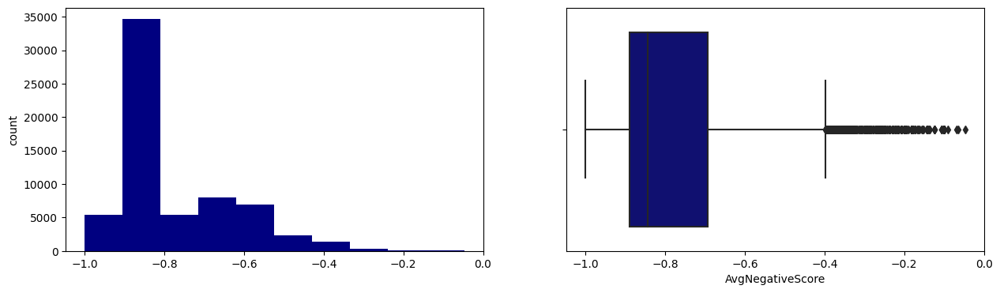

TotPositiveMentions
Skew : 1.86


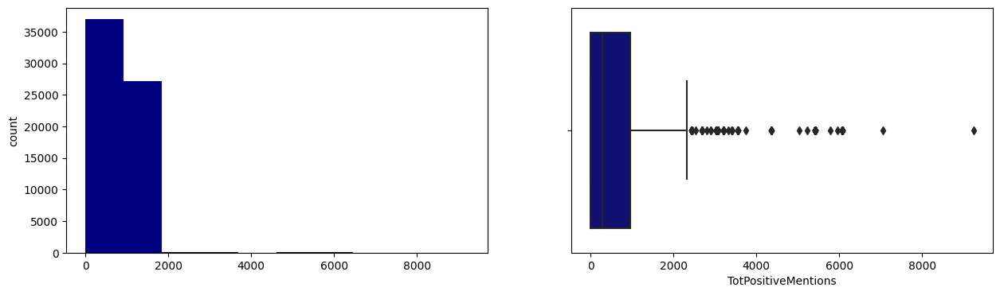

TotNegativeMentions
Skew : 18.19


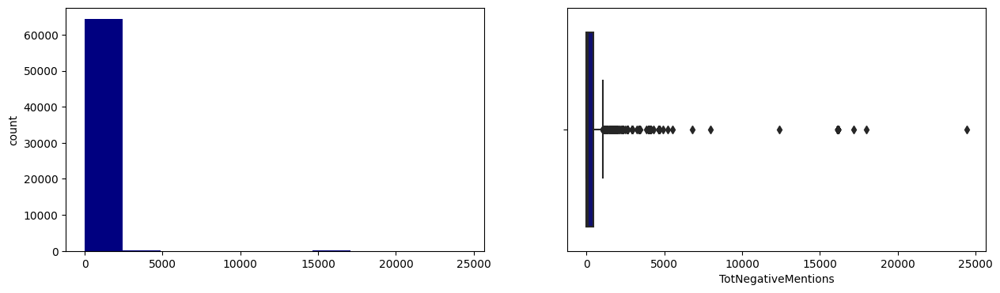

Count transaction (disposed)
Skew : 9.19


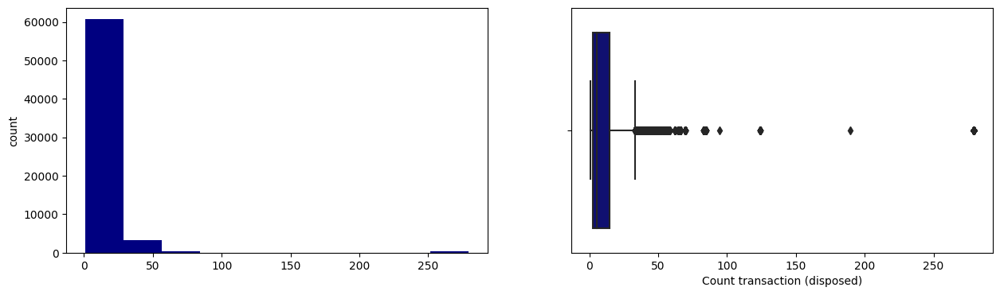

Total Amount (disposed)
Skew : 27.45


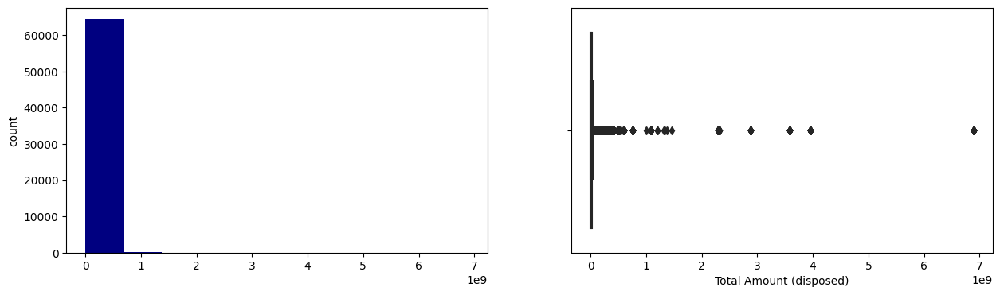

No of shares (disposed)
Skew : 10.33


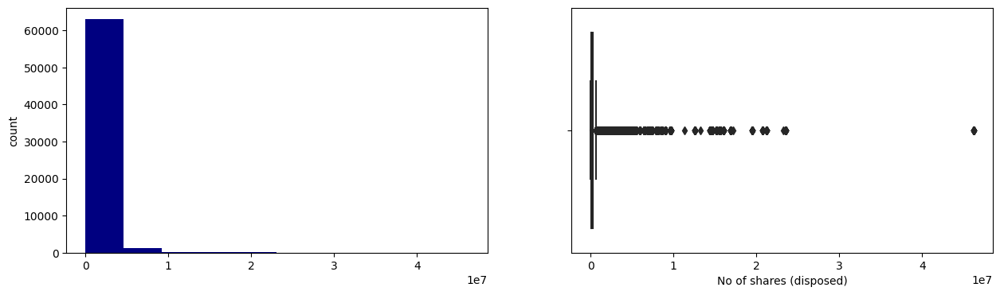

Avg Share Price (disposed) 
Skew : 2.85


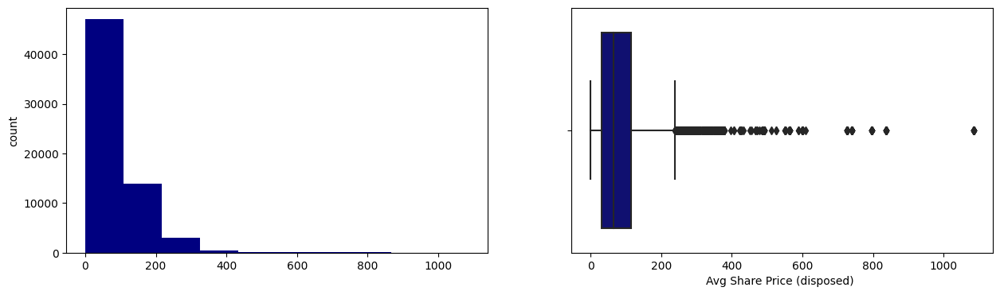

Min price (disposed)
Skew : 2.04


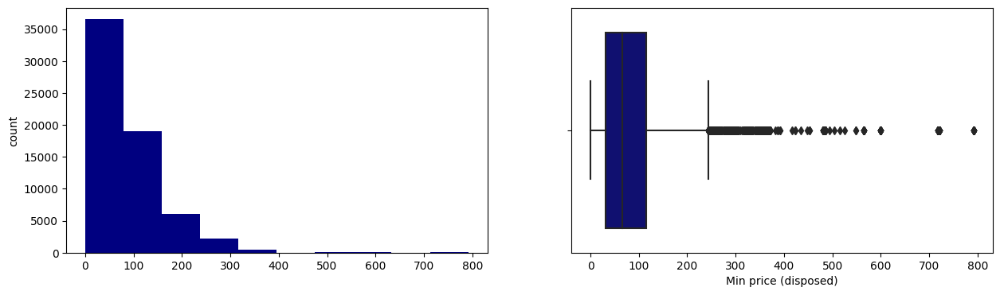

Max Price (disposed)
Skew : 5.51


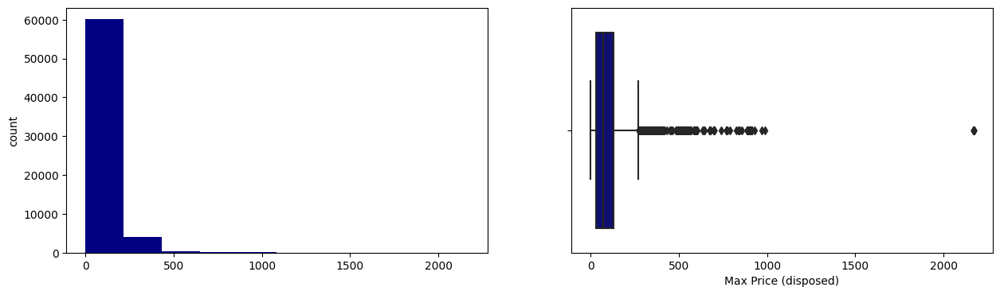

Count Acquired
Skew : 2.46


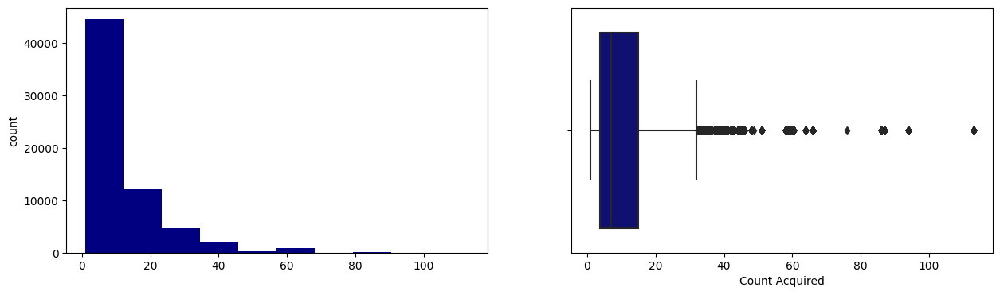

Total Amount(Acquired)
Skew : 3.48


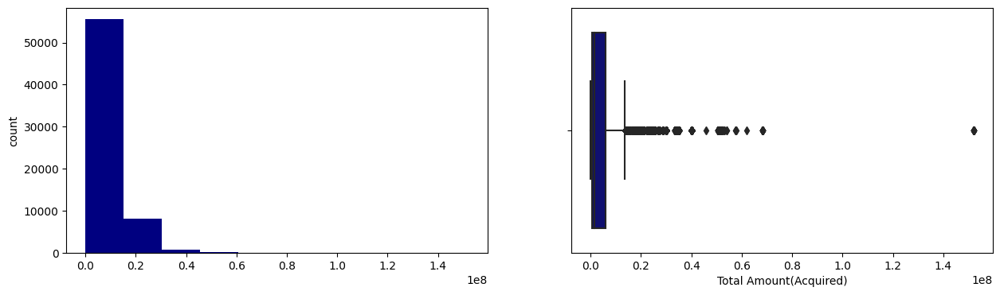

No of Shares(Acquired)
Skew : 12.05


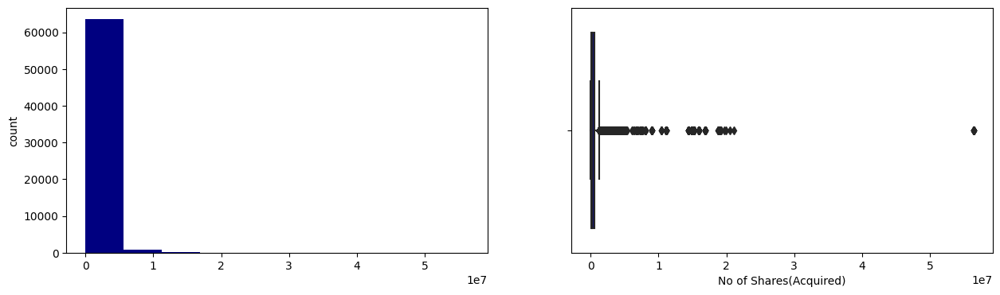

Avg Share Price (Acquired)
Skew : 52.84


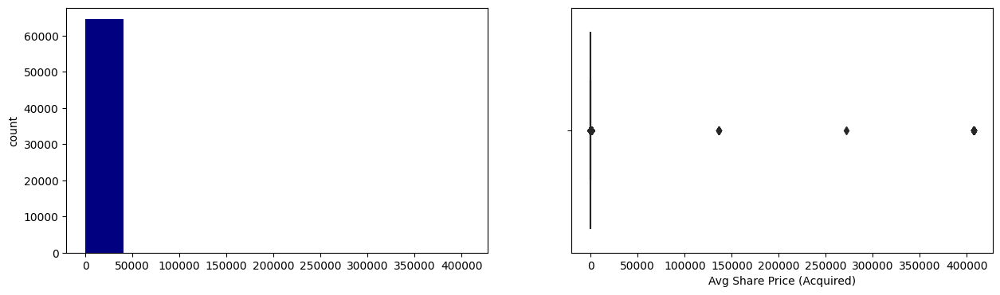

min price (Acquired)
Skew : 52.84


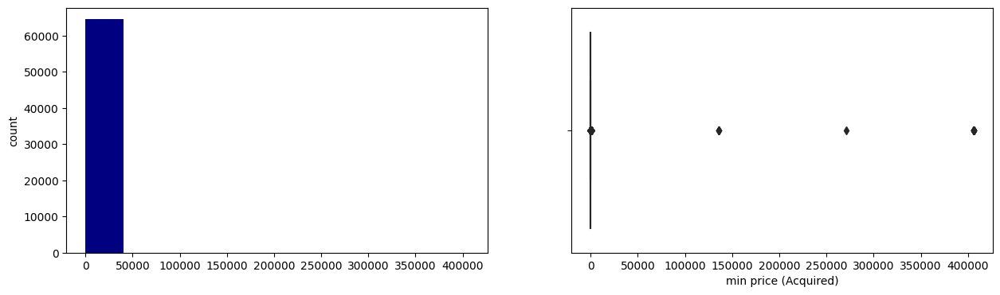

Max Price (Acquired)
Skew : 52.84


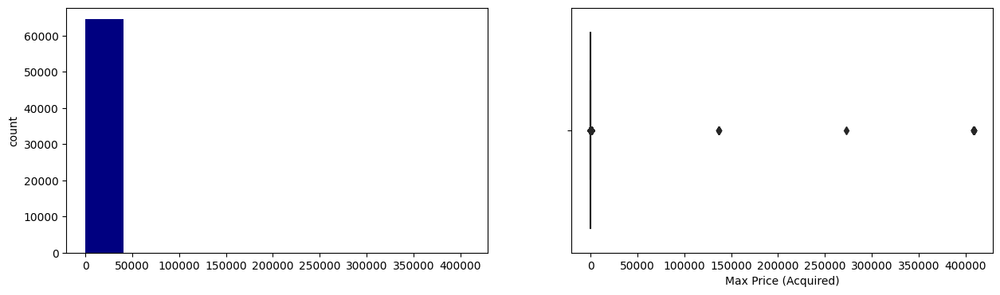

InflationRate
Skew : 0.34


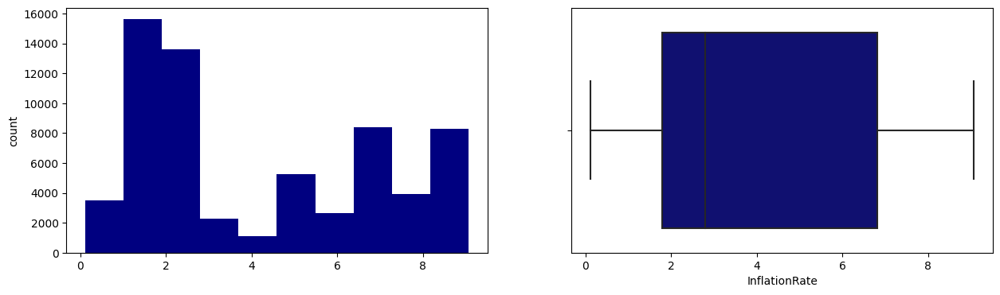

Value - T
Skew : 0.29


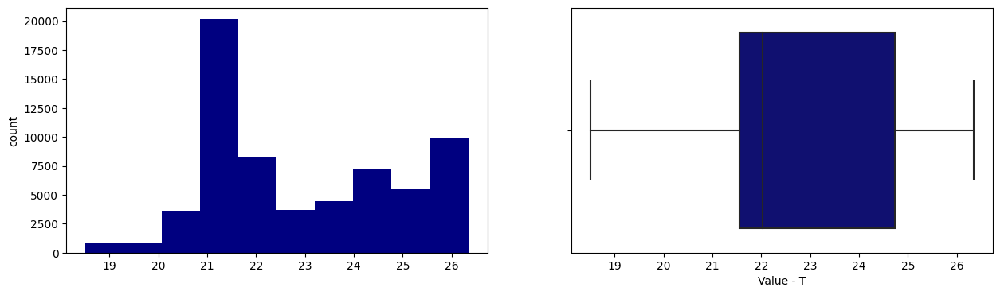

Year
Skew : -0.18


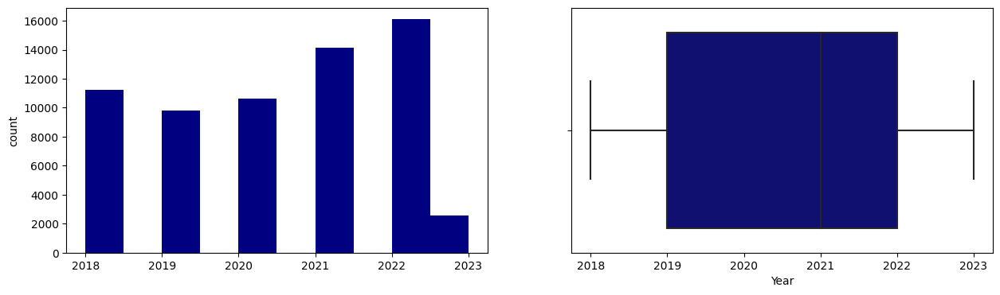

Quarter
Skew : -0.14


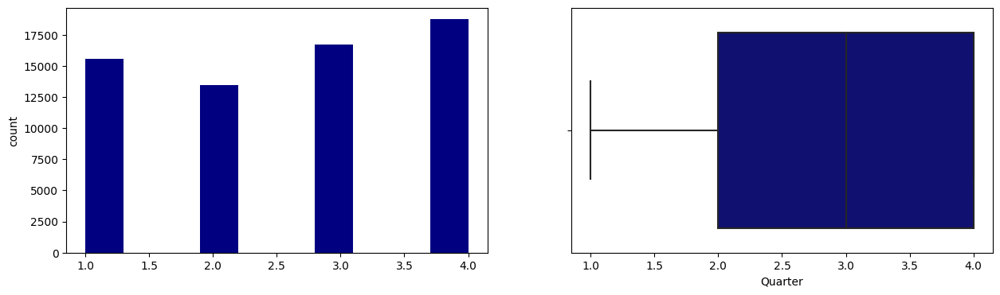

Day
Skew : 0.03


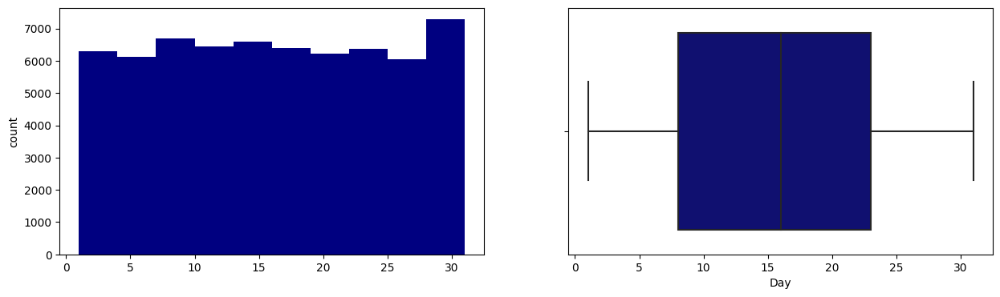

In [62]:
for col in num_cols:
    print(col)
    print('Skew :', round(df_imputed[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df_imputed[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_imputed[col])
    plt.show()

In [63]:
df_imputed.corr()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Close,1.00,1.00,-0.08,-0.01,-0.07,-0.07,-0.09,-0.04,-0.09,-0.07,-0.10,-0.07,-0.09,-0.09,-0.09,0.09,-0.08,-0.04,-0.05,-0.01,-0.08,0.08,-0.15,-0.08,-0.08,-0.07,-0.08,0.26,0.21,0.12,0.29,-0.06,-0.06,-0.16,-0.11,-0.07,-0.06,-0.01,0.06,0.34,0.37,0.30,-0.05,0.15,0.11,0.15,0.15,0.15,0.00,0.04,0.00,-0.02,-0.00
Previous Day Price,1.00,1.00,-0.08,-0.01,-0.07,-0.07,-0.09,-0.04,-0.09,-0.07,-0.10,-0.07,-0.09,-0.09,-0.09,0.09,-0.08,-0.04,-0.05,-0.01,-0.08,0.08,-0.15,-0.08,-0.08,-0.07,-0.08,0.26,0.21,0.12,0.29,-0.06,-0.06,-0.16,-0.11,-0.07,-0.06,-0.01,0.06,0.34,0.37,0.30,-0.05,0.15,0.11,0.15,0.15,0.15,0.00,0.04,0.00,-0.02,-0.00
Volume,-0.08,-0.08,1.00,0.11,0.03,0.05,0.17,0.03,0.09,0.10,0.18,0.12,0.18,0.10,0.22,0.24,0.25,0.05,-0.02,0.01,-0.17,0.12,-0.05,0.24,0.23,0.10,0.23,-0.10,-0.07,-0.04,-0.11,0.13,-0.20,0.13,0.07,0.12,0.04,0.07,0.06,0.07,0.08,0.08,-0.04,-0.03,-0.04,-0.01,-0.01,-0.01,0.07,0.06,0.11,-0.01,-0.01
netReceivables,-0.01,-0.01,0.11,1.00,0.23,0.33,0.64,0.87,0.82,0.89,0.64,0.40,0.50,0.27,0.70,0.38,0.61,0.21,-0.21,0.31,-0.60,0.33,-0.35,0.45,0.47,0.89,0.43,0.01,0.06,-0.17,-0.01,-0.00,-0.23,0.24,-0.13,-0.04,0.07,-0.00,-0.00,0.05,0.05,0.06,-0.03,-0.01,-0.01,0.02,0.02,0.02,0.08,0.10,0.11,-0.03,-0.01
inventory,-0.07,-0.07,0.03,0.23,1.00,0.71,0.42,0.16,0.36,0.33,0.65,0.84,0.59,0.78,0.35,0.23,0.22,0.12,-0.11,0.07,-0.37,0.20,-0.50,0.32,0.34,0.33,0.35,0.04,-0.02,-0.09,-0.01,-0.00,-0.24,0.20,-0.12,-0.02,0.11,0.06,0.06,0.10,0.09,0.12,-0.03,-0.01,0.02,-0.01,-0.01,-0.01,0.07,0.08,0.08,0.02,-0.01
propertyPlantEquipmentNet,-0.07,-0.07,0.05,0.33,0.71,1.00,0.70,0.14,0.58,0.36,0.75,0.88,0.70,0.77,0.60,0.47,0.46,0.13,-0.15,0.08,-0.55,0.34,-0.89,0.60,0.69,0.36,0.69,0.06,-0.00,-0.06,0.02,-0.01,-0.31,0.26,-0.17,-0.04,0.06,0.04,0.03,0.11,0.09,0.12,-0.02,-0.05,-0.00,-0.01,-0.01,-0.01,0.07,0.08,0.14,-0.06,-0.01
totalCurrentAssets,-0.09,-0.09,0.17,0.64,0.42,0.70,1.00,0.37,0.81,0.57,0.88,0.72,0.83,0.69,0.89,0.75,0.82,0.21,-0.16,0.14,-0.79,0.45,-0.69,0.83,0.84,0.57,0.83,0.04,-0.08,-0.21,-0.07,-0.01,-0.40,0.41,-0.22,-0.07,0.13,0.03,0.01,0.08,0.07,0.09,-0.01,0.00,-0.02,-0.01,-0.01,-0.01,0.04,0.06,0.07,-0.01,-0.01
totalLiabilities,-0.04,-0.04,0.03,0.87,0.16,0.14,0.37,1.00,0.70,0.92,0.41,0.20,0.23,0.04,0.45,0.05,0.35,0.17,-0.13,0.27,-0.36,0.15,-0.12,0.15,0.16,0.92,0.11,0.00,0.07,-0.15,-0.00,-0.03,-0.11,0.15,-0.06,-0.03,0.02,-0.00,-0.00,-0.00,-0.00,0.01,-0.01,-0.02,-0.01,-0.00,-0.00,-0.00,0.02,0.03,0.06,-0.06,-0.01
totalEquity,-0.09,-0.09,0.09,0.82,0.36,0.58,0.81,0.70,1.00,0.78,0.70,0.55,0.69,0.56,0.79,0.52,0.71,0.24,-0.16,0.18,-0.75,0.38,-0.54,0.61,0.59,0.78,0.56,0.11,0.03,-0.09,0.06,-0.03,-0.37,0.35,-0.21,-0.07,0.11,0.01,0.00,0.03,0.02,0.04,-0.01,-0.01,-0.03,-0.01,-0.01,-0.01,0.08,0.11,0.11,0.00,-0.01
totalDebt,-0.07,-0.07,0.10,0.89,0.33,0.36,0.57,0.92,0.78,1.00,0.66,0.43,0.43,0.26,0.64,0.26,0.52,0.21,-0.12,0.23,-0.57,0.26,-0.30,0.39,0.39,1.00,0.35,-0.00,0.02,-0.16,-0.04,0.00,-0.20,0.24,-0.09,-0.03,0.06,0.00,0.00,0.04,0.04,0.06,-0.01,-0.02,-0.01,-0.01,-0.01,-0.01,0.03,0.04,0.07,-0.04,-0.01


In [64]:
newstocks_df.corr()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Close,1.00,1.00,-0.08,0.19,0.24,0.59,0.49,0.03,0.35,0.11,0.42,0.44,0.35,0.35,0.37,0.28,0.29,0.08,-0.03,-0.01,0.08,0.09,-0.19,0.47,0.54,0.11,0.53,0.05,-0.05,-0.05,-0.01,-0.01,-0.00,0.00,-0.01,-0.01,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.35,0.35,0.35,-0.00,-0.01,0.00,-0.02,-0.00
Previous Day Price,1.00,1.00,-0.08,0.04,0.05,0.13,0.11,0.01,0.08,0.02,0.09,0.10,0.08,0.08,0.08,0.06,0.06,0.01,-0.03,-0.01,0.08,0.09,-0.19,0.10,0.12,0.02,0.12,0.01,-0.01,-0.01,-0.00,-0.01,-0.00,0.00,-0.01,-0.01,-0.07,-0.03,0.10,0.08,0.08,0.07,0.06,0.05,0.25,0.36,0.36,0.36,-0.00,-0.01,0.00,-0.02,-0.00
Volume,-0.08,-0.08,1.00,0.14,0.04,0.08,0.20,0.04,0.11,0.12,0.23,0.15,0.21,0.11,0.25,0.27,0.27,0.05,-0.01,0.01,-0.20,0.13,-0.09,0.27,0.26,0.12,0.27,-0.14,-0.08,-0.05,-0.15,0.52,0.03,-0.07,0.45,0.49,-0.04,0.15,0.17,-0.00,0.01,-0.01,0.01,-0.04,0.01,-0.03,-0.03,-0.03,0.08,0.07,0.11,-0.01,-0.01
netReceivables,0.19,0.04,0.14,1.00,0.10,0.33,0.40,0.86,0.80,0.88,0.38,0.39,0.39,0.26,0.70,0.38,0.61,0.20,-0.20,0.28,-0.54,0.32,-0.29,0.46,0.48,0.88,0.44,-0.00,0.06,-0.19,-0.04,0.07,0.15,-0.11,0.09,0.04,0.09,-0.02,-0.04,0.07,0.06,0.08,0.02,0.06,-0.04,0.24,0.26,0.18,0.06,0.07,0.05,0.04,-0.00
inventory,0.24,0.05,0.04,0.10,1.00,0.70,0.40,0.03,0.26,0.21,0.66,0.84,0.62,0.81,0.28,0.26,0.17,0.09,-0.03,0.04,-0.31,0.18,-0.47,0.29,0.28,0.21,0.30,0.15,0.02,-0.02,0.10,0.06,0.13,-0.10,0.07,0.04,0.28,0.21,0.15,0.23,0.12,0.26,-0.02,0.25,-0.06,0.25,0.16,0.24,0.06,0.09,0.03,0.06,-0.00
propertyPlantEquipmentNet,0.59,0.13,0.08,0.33,0.70,1.00,0.71,0.14,0.59,0.35,0.75,0.87,0.74,0.79,0.59,0.50,0.46,0.13,-0.11,0.06,-0.25,0.35,-0.89,0.57,0.64,0.35,0.65,0.13,0.02,-0.02,0.09,0.16,0.13,-0.15,0.17,0.12,0.07,0.10,0.07,0.26,0.13,0.30,0.21,0.01,-0.05,0.12,0.11,0.09,0.05,0.04,0.06,0.01,-0.00
totalCurrentAssets,0.49,0.11,0.20,0.40,0.40,0.71,1.00,0.02,0.63,0.27,0.86,0.70,0.87,0.75,0.80,0.84,0.77,0.17,-0.08,0.04,-0.53,0.48,-0.76,0.85,0.85,0.27,0.86,0.11,-0.11,-0.14,-0.05,0.13,0.21,-0.16,0.15,0.08,0.23,0.07,0.01,0.25,0.18,0.25,0.09,0.22,-0.06,0.30,0.22,0.28,0.04,0.06,0.03,0.06,-0.00
totalLiabilities,0.03,0.01,0.04,0.86,0.03,0.14,0.02,1.00,0.67,0.92,0.04,0.19,0.05,0.02,0.43,0.03,0.33,0.15,-0.13,0.25,-0.40,0.13,-0.03,0.14,0.16,0.92,0.11,0.01,0.09,-0.15,0.00,0.02,0.06,-0.02,0.02,0.01,0.02,-0.00,-0.02,0.04,0.03,0.05,-0.01,-0.00,-0.03,0.17,0.20,0.12,0.00,-0.00,0.01,-0.00,-0.00
totalEquity,0.35,0.08,0.11,0.80,0.26,0.59,0.63,0.67,1.00,0.76,0.49,0.54,0.62,0.55,0.78,0.52,0.69,0.23,-0.12,0.15,-0.54,0.38,-0.54,0.61,0.59,0.76,0.56,0.15,0.03,-0.08,0.08,0.08,0.19,-0.21,0.09,0.06,0.23,0.04,-0.02,0.19,0.15,0.19,0.20,0.19,-0.08,0.38,0.37,0.30,0.06,0.10,0.04,0.07,-0.00
totalDebt,0.11,0.02,0.12,0.88,0.21,0.35,0.27,0.92,0.76,1.00,0.34,0.43,0.31,0.24,0.63,0.26,0.51,0.19,-0.10,0.20,-0.59,0.26,-0.22,0.39,0.38,1.00,0.35,0.05,0.06,-0.13,0.02,0.05,0.14,-0.07,0.06,0.03,0.05,-0.01,-0.05,0.13,0.10,0.14,0.05,0.04,-0.05,0.31,0.33,0.24,0.01,0.02,0.01,0.03,-0.00


In [65]:
df_imputed2 =df_imputed.copy()

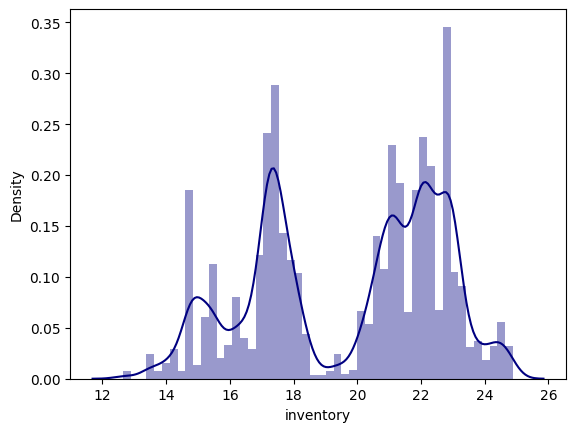

In [66]:
# Function for log and cube root transformation of the column
def log_cube_transform(data, col):
    for colname in col:
        # Log transform positive values
        data[colname][data[colname] > 0] = np.log(data[colname][data[colname] > 0] + 1e-10)
        # Cube root transform negative values
        data[colname][data[colname] < 0] = -1 * np.power(-1 * data[colname][data[colname] < 0], 1/3)
    
log_cube_transform(df_imputed2, ['Close', 'Previous Day Price', 'Volume', 'netReceivables', 'inventory', 'propertyPlantEquipmentNet', 'totalCurrentAssets', 'totalLiabilities', 'totalEquity', 'totalDebt', 'totalCurrentLiabilities', 'revenue', 'grossProfit', 'operatingExpenses', 'ebitda', 'operatingIncome', 'netIncome', 'eps', 'accountsReceivables', 'accountsPayables', 'dividendsPaid', 'operatingCashFlow', 'capitalExpenditure', 'numberOfShares', 'marketCapitalization', 'addTotalDebt', 'enterpriseValue', 'EnvironmentScore', 'SocialScore', 'GovernanceScore', 'ESGscore', 'No of mentions', 'AvgPositiveScore', 'AvgNegativeScore', 'TotPositiveMentions', 'TotNegativeMentions', 'Count transaction (disposed)', 'Total Amount (disposed)', 'No of shares (disposed)', 'Avg Share Price (disposed) ', 'Min price (disposed)', 'Max Price (disposed)', 'Count Acquired', 'Total Amount(Acquired)', 'No of Shares(Acquired)', 'Avg Share Price (Acquired)', 'min price (Acquired)', 'Max Price (Acquired)', 'InflationRate', 'Value - T', 'Year', 'Quarter', 'Day'])

# Plot the transformed feature 'inventory'
sns.distplot(df_imputed2["inventory"], axlabel="inventory");


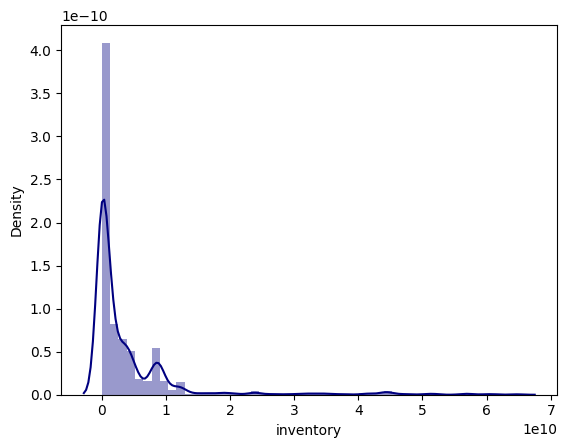

In [67]:
sns.distplot(df_imputed["inventory"], axlabel="inventory");

In [68]:
df_imputed.describe()

,Close,Previous Day Price,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
count,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00,64511.00
mean,7562.92,7562.92,13609513.43,9693369846.34,4076659669.70,18124695003.41,31361103735.07,125997446518.51,39211870825.99,29190595338.36,21760289827.04,15758520439.23,6690282141.34,3759632762.24,4050612583.20,2776821180.77,2466806009.56,0.36,-444304800.46,438969992.85,-1061747241.04,3664732079.42,-1137973679.83,2499903113.57,269127788502.67,29191989112.97,279273861246.53,64.05,64.00,65.53,64.53,472.84,0.60,-0.78,471.46,289.34,11.42,25857537.53,524446.96,84.00,84.41,94.15,11.28,5319461.03,692075.03,177.72,177.83,192.96,4.20,22.99,2020.34,2.60,15.67
std,52195.15,52195.15,24595106.79,19200772477.76,8514235175.45,34623258258.02,44756257654.11,466960718051.40,60137890934.62,58248175611.01,31247408564.21,28544211309.61,9758059780.19,5727208528.83,6401952551.23,4815155912.40,4368315443.80,2.82,3671343508.73,4058558410.84,1322147929.79,10191995175.98,2444983994.90,3629220950.80,430999436799.58,58247665451.94,444302841274.61,11.09,9.35,5.13,6.29,1116.55,0.18,0.15,513.76,610.10,22.81,180023910.10,1771289.44,78.70,75.26,93.60,11.87,8437915.78,1792796.53,7513.79,7492.24,7542.17,2.72,1.95,1.52,1.14,8.75
min,0.07,0.07,1.00,37742.00,309658.00,187000.00,122747.00,-1226844.00,-9463100000.00,33000.00,443242.00,-506655000.00,-686583000.00,-888000000.00,-6605779000.00,-6669379000.00,-6674523000.00,-43.00,-49719000000.00,-27808000000.00,-5066000000.00,-120772000000.00,-18935000000.00,155515.00,241035.98,33000.00,-157462400.00,12.47,36.56,51.86,43.42,1.00,0.05,-1.00,1.00,1.00,1.00,310.00,4.00,0.44,0.40,0.48,1.00,125.00,20.00,0.02,0.11,0.08,0.12,18.51,2018.00,1.00,1.00
25%,25.35,25.34,2460153.50,121630000.00,31302000.00,107156000.00,788353000.00,617901000.00,612517000.00,243867000.00,188862000.00,156810000.00,62771000.00,110077000.00,-5514005.00,-11294000.00,-12356000.00,-0.16,-285000000.00,-3228900.00,-2105000000.00,-4078188.00,-952000000.00,205232967.00,3450537720.36,243867000.00,4337522056.75,57.29,56.60,61.70,60.22,1.67,0.45,-0.89,1.67,2.00,2.33,390438.33,29679.33,30.81,30.81,31.79,3.67,505299.00,60733.33,6.91,16.52,18.28,1.79,21.55,2019.00,2.00,8.00
50%,91.05,91.05,6700469.00,2229000000.00,1015000000.00,1907000000.00,10629000000.00,17213000000.00,6361000000.00,7210000000.00,6359282000.00,4305000000.00,1892536000.00,844000000.00,1118000000.00,570000000.00,390940000.00,0.35,-19374000.00,4740000.00,-100000000.00,788000000.00,-173000000.00,977000000.00,121718250000.00,7210000000.00,112584157800.00,63.25,62.69,65.67,63.71,3.33,0.69,-0.84,283.67,78.00,5.67,4339075.00,85131.67,65.30,66.43,73.54,7.00,1592591.33,179916.00,23.51,28.76,34.99,2.80,22.03,2021.00,3.00,16.00
75%,178.74,178.74,15241904.00,13516000000.00,4454000000.00,19845000000.00,

creating dummies with label encoder 

## Trainings and predictions Using Date based splits

In [69]:
data = df_imputed2.copy()
data =data.drop(columns=["Price Change","Previous Day Price"])
#data["Close"]
#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

### Trying different encoding techniques to see which gives better results 

generated 3 tables

data_ohe
df_ordinal_encoded
df_target_encoded


In [71]:
import pandas as pd
!pip install category_encoders

import category_encoders as ce

# Assuming you have a DataFrame named 'df' with categorical columns 'cat_col1' and 'cat_col2'

df = data

# Ordinal Encoding
ordinal_encoder = ce.OrdinalEncoder(cols=['Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'])
df_ordinal_encoded = ordinal_encoder.fit_transform(df)

# Target Encoding
target_encoder = ce.TargetEncoder(cols=['Ticker', 'Market Capitalization', 'Industry', 'Sector',
       'IsCovidYear', 'Month', 'Day of Week'])
df_target_encoded = target_encoder.fit_transform(df, df['Close'])

# Print the encoded DataFrames
print("Ordinal Encoding:")
print(df_ordinal_encoded)
print("\nTarget Encoding:")
print(df_target_encoded)


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 4.5 MB/s eta 0:00:00
Ordinal Encoding:
       Ticker  Market Capitalization  Industry  Sector  IsCovidYear  \
0           1                      1         1       1            1   
1           1                      1         1       1            1   
2           1                      1         1       1            1   
3           1                      1         1       1            1   
4           1                      1         1       1            1   
...       ...                    ...       ...     ...          ...   
64506      50                      2         4      39            3   
64507      50                      2         4      39            3   
64508      50                      2         4      39            3   
64509      50                      2         4      39            3   
64510      50         

In [72]:
df_target_encoded.corr()

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Month,Day of Week,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Ticker,1.00,0.63,0.53,0.98,-0.04,-0.00,-0.00,0.95,-0.14,0.62,0.40,0.44,0.52,0.34,0.02,0.48,0.47,0.10,0.27,0.08,0.08,0.30,0.09,0.15,-0.34,-0.18,-0.50,0.12,-0.58,0.39,0.49,0.47,0.13,0.27,0.02,0.01,0.17,0.23,-0.30,0.01,0.17,0.17,0.12,0.23,-0.10,0.44,0.42,0.45,-0.03,0.09,-0.04,0.19,0.16,0.20,-0.02,0.01,-0.03,-0.00,0.00
Market Capitalization,0.63,1.00,0.26,0.57,-0.01,0.04,-0.00,0.60,0.30,0.73,0.71,0.68,0.77,0.48,0.02,0.70,0.76,0.14,0.26,0.06,0.36,0.45,0.35,0.40,-0.43,-0.12,-0.75,0.13,-0.61,0.73,0.77,0.70,0.15,0.20,-0.01,0.03,0.12,0.49,-0.33,0.16,0.16,0.25,0.30,0.36,0.16,0.42,0.41,0.43,0.04,0.16,0.06,0.27,0.28,0.30,0.07,0.08,0.01,0.09,0.00
Industry,0.53,0.26,1.00,0.54,0.05,-0.03,0.00,0.50,0.06,0.34,0.11,0.18,0.31,0.20,-0.01,0.28,0.27,0.06,0.15,0.05,0.01,0.11,0.03,0.04,-0.13,-0.22,-0.15,-0.09,-0.21,0.18,0.28,0.28,0.02,0.05,0.12,0.02,0.08,0.17,-0.13,-0.04,0.26,0.23,0.09,0.15,-0.00,0.24,0.23,0.24,0.02,-0.01,-0.01,0.07,0.09,0.10,0.01,0.02,0.06,-0.06,-0.00
Sector,0.98,0.57,0.54,1.00,-0.03,-0.00,-0.00,0.93,-0.15,0.60,0.36,0.41,0.48,0.32,0.02,0.45,0.43,0.09,0.27,0.08,0.07,0.28,0.07,0.09,-0.32,-0.18,-0.47,0.12,-0.54,0.35,0.45,0.44,0.13,0.25,0.02,0.02,0.16,0.21,-0.28,-0.01,0.16,0.16,0.11,0.22,-0.12,0.44,0.42,0.45,-0.02,0.10,-0.04,0.20,0.17,0.21,-0.01,0.02,-0.03,0.00,0.00
IsCovidYear,-0.04,-0.01,0.05,-0.03,1.00,-0.07,0.00,0.06,0.17,0.04,0.04,0.04,0.11,0.02,-0.01,0.06,0.07,-0.03,0.00,0.02,-0.12,-0.10,-0.10,0.06,-0.06,-0.02,-0.02,-0.02,-0.02,0.05,0.10,0.06,-0.03,0.00,-0.01,0.04,0.01,0.09,-0.11,0.11,0.02,-0.01,0.07,0.05,0.01,0.11,0.10,0.11,-0.04,-0.03,-0.03,0.04,0.04,0.04,0.30,0.47,0.82,0.03,-0.01
Month,-0.00,0.04,-0.03,-0.00,-0.07,1.00,0.01,0.01,0.00,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.01,0.00,0.01,-0.02,0.02,0.02,0.03,0.01,-0.03,0.17,0.00,0.10,0.05,0.01,0.00,0.02,-0.01,0.03,-0.05,0.07,0.01,-0.01,0.03,-0.04,0.00,0.01,-0.01,0.01,0.00,0.02,0.02,0.02,-0.00,-0.02,-0.01,0.03,0.02,0.02,0.02,0.01,-0.13,0.60,0.01
Day of Week,-0.00,-0.00,0.00,-0.00,0.00,0.01,1.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.01,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.01,0.00
Close,0.95,0.60,0.50,0.93,0.06,0.01,0.00,1.00,-0.13,0.60,0.39,0.42,0.51,0.34,0.04,0.46,0.46,0.08,0.24,0.06,0.09,0.29,0.09,0.17,-0.32,-0.17,-0.49,0.12,-0.55,0.38,0.52,0.46,0.16,0.24,-0.00,0.02,0.14,0.23,-0.31,0.01,0.18,0.19,0.13,0.24,-0.09,0.44,0.42,0.45,-0.03,0.08,-0.03,0.18,0.15,0.20,-0.01,0.03,0.02,0.01,-0.00
Volume,-0.14,0.30,0.06,-0.15,0.17,0.00,-0.00,-0.13,1.00,0.38,0.48,0.49,0.56,0.30,0.01,0.51,0.55,0.08,0.13,0.01,0.22,0.04,0.18,0.16,-0.17,-0.03,-0.27,-0.03,-0.14,0.52,0.53,0.51,0.04,-0.04,-0.25,-0.12,-0.20,0.29,-0.33,0.26,0.23,0.29,0.48,0.36,0.43,0.24,0.25,0.27,0.22,0.09,0.24,0.15,0.27,0.24,0.13,0.13,0.18,0.04,-0.01
netReceivables,0.62,0.73,0.34,0.60,0.04,0.00,-0.00,0.60,0.38,1.00,0.79,0.85,0.90,0.59,0.09,0.86,0.89,0.20,0.38,0.10,0.38,0.41,0.34,0.33,-0.52,-0.21,-0.76,0.08,-0.70,0.80,0.85,0.86,0.16,0.15,-0.06,-0.1

In [73]:


from sklearn.model_selection import train_test_split
X = df_target_encoded.drop(columns=["Close"])
y = df_target_encoded["Close"]

# Sort the data by date
sorted_df = df_target_encoded.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2021-12-31'
test_start_date = '2022-01-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [74]:
X_train

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
64510,-0.62,2.63,3.00,-0.62,4.03,2018-01-02,4.16,4.23,10.03,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,-0.27,9.89,12.94,-102.66,-119.53,-23.64,18.32,19.11,11.44,19.09,4.07,4.10,4.22,4.13,0.51,-0.52,-0.90,0.00,0.51,0.00,12.60,10.79,1.81,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,-1.17,0.74,3.04,7.61,0.00,0.69
36726,2.83,2.63,3.00,3.05,4.03,2018-01-02,4.16,4.23,15.35,17.07,16.30,17.29,19.01,19.74,-463.18,19.67,17.62,16.08,17.06,17.79,-345.45,-351.73,-359.22,-1.41,15.83,-236.89,-102.66,-404.28,-53.13,16.64,20.38,19.67,20.66,4.23,4.05,4.19,4.16,0.51,-1.03,-0.97,0.00,0.00,2.12,16.92,12.12,4.82,4.79,4.84,2.96,14.27,15.15,3.15,3.64,3.39,0.74,3.04,7.61,0.00,0.69
8435,0.23,2.63,3.00,0.23,4.03,2018-01-02,4.16,4.23,10.06,13.50,13.69,12.47,16.50,16.18,16.36,12.61,15.28,13.32,-80.92,15.45,-125.37,-195.96,-141.24,-1.33,13.38,-53.94,-106.59,-159.77,-39.69,13.99,21.83,15.25,21.82,4.09,4.19,4.17,4.15,0.51,-0.72,-0.97,6.86,5.44,0.00,12.29,9.69,2.92,2.92,2.92,0.00,12.69,11.23,0.85,0.81,0.95,0.74,3.04,7.61,0.00,0.69
57725,5.21,5.29,4.96,4.98,4.03,2018-01-02,4.16,4.23,15.61,22.05,21.06,21.58,23.64,24.28,24.25,23.73,22.98,22.35,22.13,20.43,21.98,21.93,21.68,0.11,17.31,17.03,-788.37,21.76,-597.21,21.44,26.23,23.73,26.28,4.03,3.96,4.17,4.06,7.57,-0.72,-0.96,6.86,6.60,2.16,17.38,12.20,5.23,5.23,5.23,2.20,17.38,12.64,4.38,4.32,4.44,0.74,3.04,7.61,0.00,0.69
35415,5.91,5.29,4.94,5.16,4.03,2018-01-02,4.16,4.23,16.20,21.52,21.37,19.65,22.78,23.50,22.11,22.60,22.52,22.03,21.13,20.78,21.52,19.92,19.49,-0.74,19.16,18.12,-449.79,-618.63,-363.34,19.89,25.58,22.60,25.61,4.13,4.23,4.23,4.20,0.51,-0.72,-0.95,6.86,6.06,1.10,15.21,12.30,4.05,4.39,5.07,2.93,15.51,11.43,4.76,3.43,5.29,0.74,3.04,7.61,0.00,0.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45125,3.99,5.29,4.94,3.99,4.31,2021-12-30,4.23,4.22,16.12,19.54,21.00,20.02,22.04,22.10,20.19,20.93,21.50,20.16,19.85,20.14,-484.12,-518.82,-523.30,-0.63,-516.93,16.98,-461.04,18.62,-355.54,20.18,24.82,20.93,24.79,4.03,4.18,4.16,4.13,5.81,-1.06,-0.94,1.39,3.09,0.69,14.96,10.84,4.18,4.65,4.30,1.73,14.46,13.40,3.87,3.74,4.17,1.95,3.20,7.61,1.39,3.40
304,5.19,5.29,4.96,5.19,4.31,2021-12-30,4.23,4.22,17.91,24.90,22.49,24.39,25.75,26.46,25.00,25.53,25.72,25.54,24.72,23.27,24.52,24.45,24.27,0.75,-1578.62,23.71,-1551.13,24.57,-1409.96,23.52,28.69,25.53,28.72,3.91,4.51,4.20,4.24,7.61,-0.75,-0.88,6.87,5.04,2.43,15.69,11.90,4.84,5.00,4.93,2.16,13.69,13.17,1.63,3.24,2.95,1.95,3.20,7.61,1.39,3.40
25151,4.03,5.29,4.37,4.03,4.31,2021-12-30,4.23,4.22,15.86,21.98,21.95,23.02,23.84,24.96,23.86,24.48,23.72,22.97,22.41,21.81,21.96,21.24,21.60,-0.83,-658.08,20.48,-1219.81,21.95,-861.32,22.19,26.27,24.48,26.39,4.21,4.13,4.24,4.19,5.43,-0.83,-0.59,5.35,1.95,1.95,16.90,12.28,4.20,4.17,4.22,2.75,13.50,12.22,2.49,1.26,3.65,1.95,3.20,7.61,1.39,3.40
53531,6.12,5.29,4.39,6.12,4.31,2021-12-30,4.23,4.22,16.57,21.37,22.47,24

In [75]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 
X_test['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 


In [76]:
X_train

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
64510,-0.62,2.63,3.00,-0.62,4.03,1514851200000000000,4.16,4.23,10.03,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,-0.27,9.89,12.94,-102.66,-119.53,-23.64,18.32,19.11,11.44,19.09,4.07,4.10,4.22,4.13,0.51,-0.52,-0.90,0.00,0.51,0.00,12.60,10.79,1.81,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,-1.17,0.74,3.04,7.61,0.00,0.69
36726,2.83,2.63,3.00,3.05,4.03,1514851200000000000,4.16,4.23,15.35,17.07,16.30,17.29,19.01,19.74,-463.18,19.67,17.62,16.08,17.06,17.79,-345.45,-351.73,-359.22,-1.41,15.83,-236.89,-102.66,-404.28,-53.13,16.64,20.38,19.67,20.66,4.23,4.05,4.19,4.16,0.51,-1.03,-0.97,0.00,0.00,2.12,16.92,12.12,4.82,4.79,4.84,2.96,14.27,15.15,3.15,3.64,3.39,0.74,3.04,7.61,0.00,0.69
8435,0.23,2.63,3.00,0.23,4.03,1514851200000000000,4.16,4.23,10.06,13.50,13.69,12.47,16.50,16.18,16.36,12.61,15.28,13.32,-80.92,15.45,-125.37,-195.96,-141.24,-1.33,13.38,-53.94,-106.59,-159.77,-39.69,13.99,21.83,15.25,21.82,4.09,4.19,4.17,4.15,0.51,-0.72,-0.97,6.86,5.44,0.00,12.29,9.69,2.92,2.92,2.92,0.00,12.69,11.23,0.85,0.81,0.95,0.74,3.04,7.61,0.00,0.69
57725,5.21,5.29,4.96,4.98,4.03,1514851200000000000,4.16,4.23,15.61,22.05,21.06,21.58,23.64,24.28,24.25,23.73,22.98,22.35,22.13,20.43,21.98,21.93,21.68,0.11,17.31,17.03,-788.37,21.76,-597.21,21.44,26.23,23.73,26.28,4.03,3.96,4.17,4.06,7.57,-0.72,-0.96,6.86,6.60,2.16,17.38,12.20,5.23,5.23,5.23,2.20,17.38,12.64,4.38,4.32,4.44,0.74,3.04,7.61,0.00,0.69
35415,5.91,5.29,4.94,5.16,4.03,1514851200000000000,4.16,4.23,16.20,21.52,21.37,19.65,22.78,23.50,22.11,22.60,22.52,22.03,21.13,20.78,21.52,19.92,19.49,-0.74,19.16,18.12,-449.79,-618.63,-363.34,19.89,25.58,22.60,25.61,4.13,4.23,4.23,4.20,0.51,-0.72,-0.95,6.86,6.06,1.10,15.21,12.30,4.05,4.39,5.07,2.93,15.51,11.43,4.76,3.43,5.29,0.74,3.04,7.61,0.00,0.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45125,3.99,5.29,4.94,3.99,4.31,1640822400000000000,4.23,4.22,16.12,19.54,21.00,20.02,22.04,22.10,20.19,20.93,21.50,20.16,19.85,20.14,-484.12,-518.82,-523.30,-0.63,-516.93,16.98,-461.04,18.62,-355.54,20.18,24.82,20.93,24.79,4.03,4.18,4.16,4.13,5.81,-1.06,-0.94,1.39,3.09,0.69,14.96,10.84,4.18,4.65,4.30,1.73,14.46,13.40,3.87,3.74,4.17,1.95,3.20,7.61,1.39,3.40
304,5.19,5.29,4.96,5.19,4.31,1640822400000000000,4.23,4.22,17.91,24.90,22.49,24.39,25.75,26.46,25.00,25.53,25.72,25.54,24.72,23.27,24.52,24.45,24.27,0.75,-1578.62,23.71,-1551.13,24.57,-1409.96,23.52,28.69,25.53,28.72,3.91,4.51,4.20,4.24,7.61,-0.75,-0.88,6.87,5.04,2.43,15.69,11.90,4.84,5.00,4.93,2.16,13.69,13.17,1.63,3.24,2.95,1.95,3.20,7.61,1.39,3.40
25151,4.03,5.29,4.37,4.03,4.31,1640822400000000000,4.23,4.22,15.86,21.98,21.95,23.02,23.84,24.96,23.86,24.48,23.72,22.97,22.41,21.81,21.96,21.24,21.60,-0.83,-658.08,20.48,-1219.81,21.95,-861.32,22.19,26.27,24.48,26.39,4.21,4.13,4.24,4.19,5.43,-0.83,-0.59,5.35,1.95,1.95,16.90,12.28,4.20,4.17,4.22,2.75,13.50,12.22,2.49,1.26,3.65,1.95,3.20,7.61,1.39,3.40


Model 1  - df_numerical_imputed_trainset dropping multicollinearity;no dimension reduction
data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

Dimensionality Reduction 

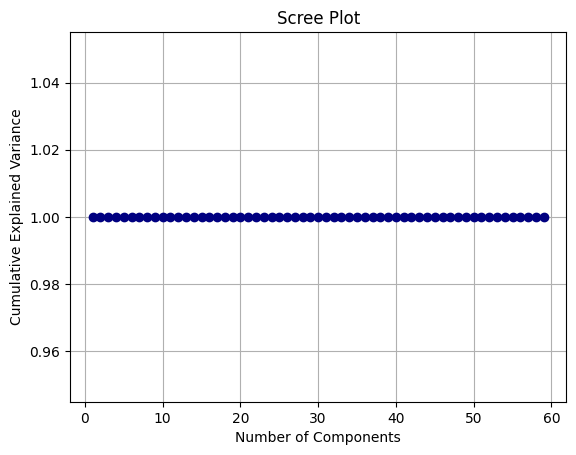

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [78]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                         Feature  Importance
0                         Ticker        0.64
8                         Volume        0.10
3                         Sector        0.07
17                       revenue        0.05
12            totalCurrentAssets        0.04
5                           Date        0.02
30          marketCapitalization        0.02
26                 dividendsPaid        0.01
10                     inventory        0.01
29                numberOfShares        0.00
33              EnvironmentScore        0.00
13              totalLiabilities        0.00
14                   totalEquity        0.00
31                  addTotalDebt        0.00
19             operatingExpenses        0.00
18                   grossProfit        0.00
11     propertyPlantEquipmentNet        0.00
27             operatingCashFlow        0.00
24           accountsReceivables        0.00
16       totalCurrentLiabilities        0.00
32               enterpriseValue        0.00
15        

In [79]:
from sklearn.tree import DecisionTreeRegressor
import pandas as pd


# Create a decision tree regressor
model = DecisionTreeRegressor()

# Fit the model
model.fit(X_train, y_train)

# Get the feature importances
importances = model.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the feature importances in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                         Feature  Importance
0                         Ticker        0.58
8                         Volume        0.27
12            totalCurrentAssets        0.04
5                           Date        0.02
30          marketCapitalization        0.02
19             operatingExpenses        0.02
26                 dividendsPaid        0.01
10                     inventory        0.01
33              EnvironmentScore        0.00
3                         Sector        0.00
11     propertyPlantEquipmentNet        0.00
31                  addTotalDebt        0.00
27             operatingCashFlow        0.00
24           accountsReceivables        0.00
13              totalLiabilities        0.00
22                     netIncome        0.00
32               enterpriseValue        0.00
29                numberOfShares        0.00
21               operatingIncome        0.00
18                   grossProfit        0.00
55                     Value - T        0.00
6         

In [80]:
X_train.shape

(45790, 59)

In [81]:
#PCA

from sklearn.decomposition import PCA

# Create PCA object with desired number of components
n_components = 1  # Choose the number of principal components
pca = PCA(n_components=n_components)

# Fit PCA on the one-hot encoded training data
pca.fit(X_train)

# Transform the training data to its principal components
X_train_pca = pca.transform(X_train)

# Print the explained variance ratio of each principal component
print("Explained Variance Ratio:")
for i in range(n_components):
    print("PC{}: {:.2f}%".format(i+1, pca.explained_variance_ratio_[i] * 100))

# Print the shape of the transformed data
print("Shape of X_train_pca:", X_train_pca.shape)


Explained Variance Ratio:
PC1: 100.00%
Shape of X_train_pca: (45790, 1)


In [82]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=25)
X_pca = pca.fit_transform(X_train)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(25)], index=feature_names)


In [83]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25
Ticker,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.01,0.00,0.01,-0.07,-0.02,0.02,0.07,0.15,-0.36,-0.03,0.05,0.02,-0.25,0.06,0.19
Market Capitalization,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.06,-0.02,-0.08,0.02,0.06,0.02,-0.03,0.06,0.21,-0.18,-0.07,0.03
Industry,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.02,0.23,0.36,-0.19,-0.22,-0.31,0.21,-0.27,-0.05,-0.08,0.01,0.20
Sector,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.00,0.01,-0.06,-0.01,0.06,0.03,0.14,-0.39,0.01,0.01,-0.08,-0.20,0.13,0.21
IsCovidYear,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00
Date,-1.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00
Month,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00
Day of Week,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00
Volume,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.01,0.00,0.00,0.00,0.00,-0.10,0.18,-0.21,0.21,-0.03,0.29,0.24,-0.03,0.09,0.11,0.08,-0.08
netReceivables,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.01,0.01,0.02,-0.13,0.24,0.15,0.29,0.23,0.03,-0.11,0.21,-0.16,0.05,0.57,0.15


In [84]:
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Fit the PCA on the one-hot encoded training data
n_components = 50
pca = PCA(n_components=n_components)
pca.fit(X_train)

# Step 2: Get the explained variance ratio and cumulative explained variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Step 3: Get the original column headers
column_headers = X_train.columns

# Step 4: Transform the training data to its principal components
X_train_pca = pca.transform(X_train)

# Step 5: Create a DataFrame with the transformed data and corresponding column headers
column_headers_pca = [f"PC{i+1}" for i in range(n_components)]
X_train_pca_df = pd.DataFrame(X_train_pca, columns=column_headers_pca)

# Step 6: Map the principal components to the original column headers
component_mapping = pd.DataFrame(pca.components_.T, columns=column_headers_pca, index=column_headers)


In [85]:
component_mapping

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
Ticker,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.01,-0.00,-0.01,0.01,0.03,-0.10,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00
Market Capitalization,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.04,-0.06,0.06,0.01,0.06,-0.12,0.03,-0.00,0.03,0.15,-0.21,-0.20,0.34,-0.27,0.37,0.35,0.08,0.44,0.23,-0.17,0.14,0.11,0.03,-0.02,0.03,-0.02,0.04,0.01,0.04,0.03,0.06,0.09,0.01,-0.21,-0.15,0.13,0.01
Industry,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.02,-0.03,-0.02,0.11,0.19,-0.22,0.43,-0.30,0.22,-0.07,0.40,0.20,0.01,0.18,0.18,0.36,0.10,-0.12,-0.17,0.07,-0.06,-0.07,-0.08,-0.02,-0.06,0.12,0.07,-0.00,-0.00,-0.01,0.12,-0.01,0.09,-0.10,0.00,-0.04,-0.02
Sector,0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.00,0.01,0.06,-0.37,0.32,-0.32,-0.26,0.10,-0.07,0.03,-0.00,-0.00,0.06,0.11,0.01,0.07,0.02,-0.07,-0.05,0.02,-0.00,0.02,0.01,0.05,0.07,0.02,-0.02,-0.02,0.02,0.02,0.01,-0.01,-0.09,-0.02,-0.05,0.09,0.02,0.01,0.02
IsCovidYear,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.01,-0.01,-0.02,0.02,-0.04,0.04,-0.05,0.08,0.14,0.14,0.14,-0.23,-0.27,0.16,0.16,-0.23,0.32,0.31,0.22,0.19,-0.25,0.26,-0.22,-0.27,0.18,-0.12,-0.08,0.16,0.10,-0.11,-0.09,-0.07,0.13,0.08,0.02
Date,-1.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00
Month,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.01,-0.01,-0.01,0.02,0.02,-0.01,-0.00,0.01,-0.00,-0.01,-0.01,-0.01,0.01,0.01,-0.01,-0.01,-0.00,0.02,-0.00,0.01,0.02,-0.02,-0.01,0.00,0.02,0.02,0.03
Day of Week,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00
Volume,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.01,0.00,0.00,0.00,0.00,-0.22,-0.08,0.26,-0.02,-0.27,0.21,-0.05,0.03,0.27,-0.30,0.31,0.05,0.12,0.15,0.04,0.12,0.01,0.19,0.00,0.06,-0.05,0.28,0.26,0.11,0.01,-0.01,0.01,0.02,0.02,0.01,-0.18,-0.16,0.04,-0.00,-0.08,0.12,-0.02
netReceivables,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.01,0.01,0.02,-0.16,-0.02,-0.13,0.41,0.33,-0.14,-0.07,0.33,0.01,-0.09,-0.15,0.11,0.15,0.32,-0.27,-0.06,-0.03,0.08,0.07,0.03,-0.18,0.29,0.21,0.10,0.02,-0.00,0.00,-0.01,0.04,0.01,0.01,-0.04,0.07,-0.09,-0.05,0.06,-0.03


In [87]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [88]:
X_train

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
64510,-0.62,2.63,3.00,-0.62,4.03,1514851200000000000,4.16,4.23,10.03,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,-0.27,9.89,12.94,-102.66,-119.53,-23.64,18.32,19.11,11.44,19.09,4.07,4.10,4.22,4.13,0.51,-0.52,-0.90,0.00,0.51,0.00,12.60,10.79,1.81,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,-1.17,0.74,3.04,7.61,0.00,0.69
36726,2.83,2.63,3.00,3.05,4.03,1514851200000000000,4.16,4.23,15.35,17.07,16.30,17.29,19.01,19.74,-463.18,19.67,17.62,16.08,17.06,17.79,-345.45,-351.73,-359.22,-1.41,15.83,-236.89,-102.66,-404.28,-53.13,16.64,20.38,19.67,20.66,4.23,4.05,4.19,4.16,0.51,-1.03,-0.97,0.00,0.00,2.12,16.92,12.12,4.82,4.79,4.84,2.96,14.27,15.15,3.15,3.64,3.39,0.74,3.04,7.61,0.00,0.69
8435,0.23,2.63,3.00,0.23,4.03,1514851200000000000,4.16,4.23,10.06,13.50,13.69,12.47,16.50,16.18,16.36,12.61,15.28,13.32,-80.92,15.45,-125.37,-195.96,-141.24,-1.33,13.38,-53.94,-106.59,-159.77,-39.69,13.99,21.83,15.25,21.82,4.09,4.19,4.17,4.15,0.51,-0.72,-0.97,6.86,5.44,0.00,12.29,9.69,2.92,2.92,2.92,0.00,12.69,11.23,0.85,0.81,0.95,0.74,3.04,7.61,0.00,0.69
57725,5.21,5.29,4.96,4.98,4.03,1514851200000000000,4.16,4.23,15.61,22.05,21.06,21.58,23.64,24.28,24.25,23.73,22.98,22.35,22.13,20.43,21.98,21.93,21.68,0.11,17.31,17.03,-788.37,21.76,-597.21,21.44,26.23,23.73,26.28,4.03,3.96,4.17,4.06,7.57,-0.72,-0.96,6.86,6.60,2.16,17.38,12.20,5.23,5.23,5.23,2.20,17.38,12.64,4.38,4.32,4.44,0.74,3.04,7.61,0.00,0.69
35415,5.91,5.29,4.94,5.16,4.03,1514851200000000000,4.16,4.23,16.20,21.52,21.37,19.65,22.78,23.50,22.11,22.60,22.52,22.03,21.13,20.78,21.52,19.92,19.49,-0.74,19.16,18.12,-449.79,-618.63,-363.34,19.89,25.58,22.60,25.61,4.13,4.23,4.23,4.20,0.51,-0.72,-0.95,6.86,6.06,1.10,15.21,12.30,4.05,4.39,5.07,2.93,15.51,11.43,4.76,3.43,5.29,0.74,3.04,7.61,0.00,0.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45125,3.99,5.29,4.94,3.99,4.31,1640822400000000000,4.23,4.22,16.12,19.54,21.00,20.02,22.04,22.10,20.19,20.93,21.50,20.16,19.85,20.14,-484.12,-518.82,-523.30,-0.63,-516.93,16.98,-461.04,18.62,-355.54,20.18,24.82,20.93,24.79,4.03,4.18,4.16,4.13,5.81,-1.06,-0.94,1.39,3.09,0.69,14.96,10.84,4.18,4.65,4.30,1.73,14.46,13.40,3.87,3.74,4.17,1.95,3.20,7.61,1.39,3.40
304,5.19,5.29,4.96,5.19,4.31,1640822400000000000,4.23,4.22,17.91,24.90,22.49,24.39,25.75,26.46,25.00,25.53,25.72,25.54,24.72,23.27,24.52,24.45,24.27,0.75,-1578.62,23.71,-1551.13,24.57,-1409.96,23.52,28.69,25.53,28.72,3.91,4.51,4.20,4.24,7.61,-0.75,-0.88,6.87,5.04,2.43,15.69,11.90,4.84,5.00,4.93,2.16,13.69,13.17,1.63,3.24,2.95,1.95,3.20,7.61,1.39,3.40
25151,4.03,5.29,4.37,4.03,4.31,1640822400000000000,4.23,4.22,15.86,21.98,21.95,23.02,23.84,24.96,23.86,24.48,23.72,22.97,22.41,21.81,21.96,21.24,21.60,-0.83,-658.08,20.48,-1219.81,21.95,-861.32,22.19,26.27,24.48,26.39,4.21,4.13,4.24,4.19,5.43,-0.83,-0.59,5.35,1.95,1.95,16.90,12.28,4.20,4.17,4.22,2.75,13.50,12.22,2.49,1.26,3.65,1.95,3.20,7.61,1.39,3.40


In [89]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [90]:
import matplotlib.pyplot as plt

data = {
    "Ticker": ["AAPL", "ABNB", "AMC", "AMD", "AMZN", "APPN", "AYTU", "BRK.A", "CDMO", "CLNE",
               "CLOV", "COIN", "DIS", "FB", "GME", "GOOGL", "HIMS", "JNJ", "JPM", "KO",
               "LMND", "MA", "MCD", "META", "MRNA", "MSFT", "NFLX", "NVAX", "NVDA", "PFE",
               "PG", "PYPL", "RBLX", "ROKU", "RUN", "SLQT", "SNOW", "SPCE", "SQ", "TDOC",
               "TSLA", "TTD", "UPST", "V", "WISH", "WKHS", "WMT", "XAIR", "ZM", "ZOM"],
    "Close": [5.18, 5.11, 3.30, 4.97, 4.59, 4.18, 0.30, 13.02, 3.37, 1.81,
1.31, 5.53, 5.04, 5.03, 5.00, 7.97, 1.88, 5.14, 5.06, 4.08,
3.74, 5.88, 5.59, 5.82, 5.54, 5.82, 6.40, 4.96, 5.68, 4.08,
5.10, 5.24, 4.64, 5.43, 3.54, 2.20, 5.83, 2.59, 5.08, 4.52,
6.96, 4.52, 5.02, 5.38, 1.13, 1.47, 4.97, 2.24, 5.21, -1.06]
}


df = pd.DataFrame(data)

In [91]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test, cv=5, param_grid=None):
    
    if param_grid is not None:
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv)
        grid_search.fit(x_train, y_train)
        model = grid_search.best_estimator_
        
    train_pred = cross_val_predict(model, x_train, y_train, cv=cv)
    test_pred = model.predict(x_test)

    train_mae = mean_absolute_error(y_train, train_pred)
    train_mse = mean_squared_error(y_train, train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r_squared = r2_score(y_train, train_pred)

    test_mae = mean_absolute_error(y_test, test_pred)
    test_mse = mean_squared_error(y_test, test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r_squared = r2_score(y_test, test_pred)

    train_result = {
        "Model": f"{model_name} Train",
        "MAE": round(train_mae, 2),
        "MSE": round(train_mse, 2),
        "RMSE": round(train_rmse, 2),
        "R2 Score": round(train_r_squared, 4)
    }
    print(train_result)

    test_result = {
        "Model": f"{model_name} Test",
        "MAE": round(test_mae, 2),
        "MSE": round(test_mse, 2),
        "RMSE": round(test_rmse, 2),
        "R2 Score": round(test_r_squared, 4)
    }
    print(test_result)


    tickers_table = df_imputed["Ticker"]

    rf_df_tmp_train = pd.DataFrame({"Actual": y_train[:30], "Predicted": train_pred[:30]})
    rf_df_tmp_test = pd.DataFrame({"Actual": y_test[:30], "Predicted": test_pred[:30]})

    # Merge on index
    rf_df_tmp_train = rf_df_tmp_train.merge(tickers_table, left_index=True, right_index=True)
    rf_df_tmp_test = rf_df_tmp_test.merge(tickers_table, left_index=True, right_index=True)

    # Set Ticker column as the index
    rf_df_tmp_train.set_index("Ticker", inplace=True)
    rf_df_tmp_test.set_index("Ticker", inplace=True)

    # Add "Close" data to the dataframes
    rf_df_tmp_train["Close"] = df.set_index("Ticker")["Close"]
    rf_df_tmp_test["Close"] = df.set_index("Ticker")["Close"]

    # Plot the dataframes
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))

    rf_df_tmp_train.plot(ax=ax1, figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax1.legend(["Actual", "Predicted", "Baseline"])
    ax1.set_xticklabels(rf_df_tmp_train.index)

    rf_df_tmp_test.plot(ax=ax2, figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax2.legend(["Actual", "Predicted", "Baseline"])
    ax2.set_xticklabels(rf_df_tmp_test.index)

    plt.tight_layout()
    plt.show()



    return train_result, test_result





In [92]:
models = []

In [95]:
# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train_scaled, y_train)

LinearRegression()

{'Model': 'Linear Regression Train', 'MAE': 0.44, 'MSE': 0.41, 'RMSE': 0.64, 'R2 Score': 0.9142}
{'Model': 'Linear Regression Test', 'MAE': 2.19, 'MSE': 164.13, 'RMSE': 12.81, 'R2 Score': -38.7405}


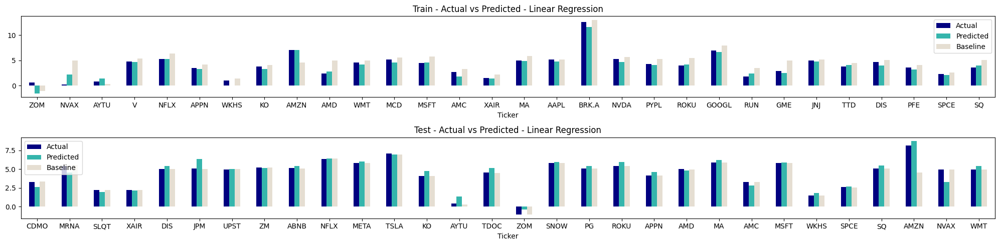

In [96]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

In [97]:
# Ridge 
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)

Ridge()

{'Model': 'Ridge Regression Train', 'MAE': 0.43, 'MSE': 0.33, 'RMSE': 0.58, 'R2 Score': 0.9297}
{'Model': 'Ridge Regression Test', 'MAE': 2.02, 'MSE': 122.74, 'RMSE': 11.08, 'R2 Score': -28.7184}


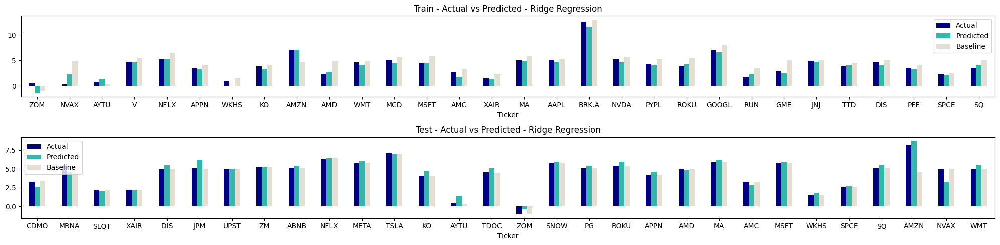

In [98]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


In [99]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

{'Model': 'Lasso Regression Train', 'MAE': 1.54, 'MSE': 4.79, 'RMSE': 2.19, 'R2 Score': -0.0083}
{'Model': 'Lasso Regression Test', 'MAE': 1.32, 'MSE': 4.18, 'RMSE': 2.05, 'R2 Score': -0.0133}


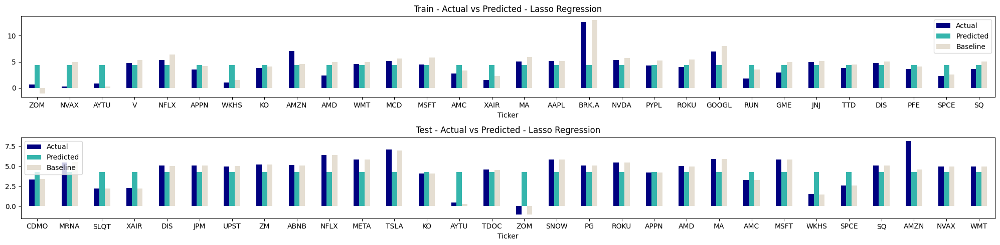

In [100]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


In [101]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.27, 'MSE': 0.16, 'RMSE': 0.4, 'R2 Score': 0.9666}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.57, 'MSE': 0.81, 'RMSE': 0.9, 'R2 Score': 0.8047}


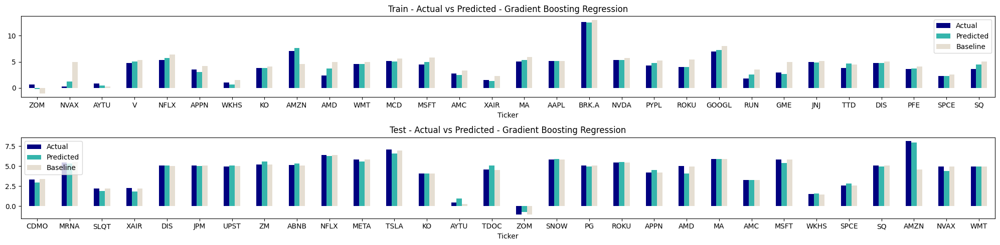

In [102]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

In [103]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

{'Model': 'Elastic Regression Train', 'MAE': 1.5, 'MSE': 4.59, 'RMSE': 2.14, 'R2 Score': 0.0337}
{'Model': 'Elastic Regression Test', 'MAE': 1.27, 'MSE': 3.98, 'RMSE': 1.99, 'R2 Score': 0.0364}


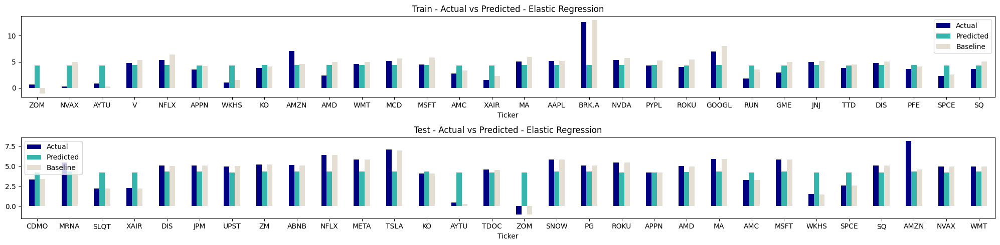

In [104]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


In [115]:
# Random forest regressor 
rf = RandomForestRegressor()
rf.fit(X_train_scaled, y_train)

RandomForestRegressor()

{'Model': 'Random Forest Regression Train', 'MAE': 0.24, 'MSE': 0.15, 'RMSE': 0.39, 'R2 Score': 0.968}
{'Model': 'Random Forest Regression Test', 'MAE': 0.61, 'MSE': 0.85, 'RMSE': 0.92, 'R2 Score': 0.7938}


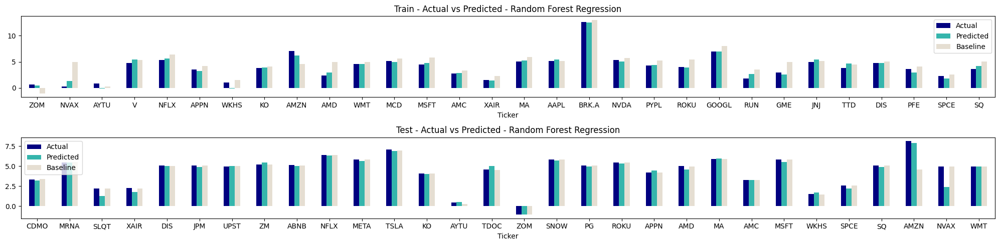

In [116]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


In [117]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor()
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor()

{'Model': 'Decision Tree Regression Train', 'MAE': 0.28, 'MSE': 0.21, 'RMSE': 0.46, 'R2 Score': 0.955}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.69, 'MSE': 1.09, 'RMSE': 1.05, 'R2 Score': 0.735}


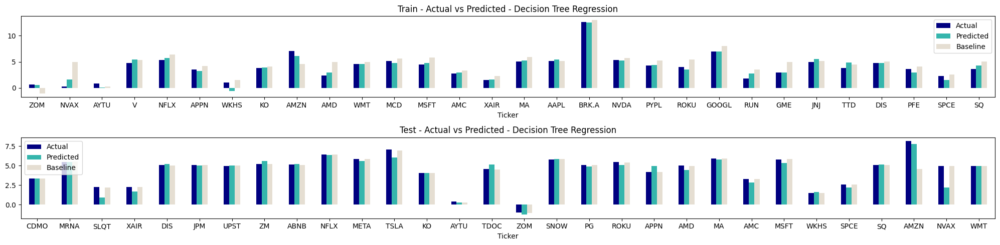

In [118]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

In [119]:
# Support Vector Machine regressor 
svr = SVR()
svr.fit(X_train_scaled, y_train)

SVR()

{'Model': 'SVR Regression Train', 'MAE': 0.31, 'MSE': 0.21, 'RMSE': 0.45, 'R2 Score': 0.9565}
{'Model': 'SVR Regression Test', 'MAE': 0.73, 'MSE': 1.28, 'RMSE': 1.13, 'R2 Score': 0.6893}


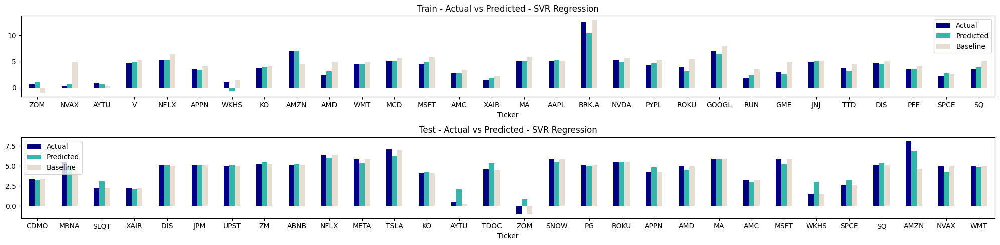

In [120]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [121]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor()
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor()

{'Model': 'AdaBoost Regression Train', 'MAE': 0.45, 'MSE': 0.33, 'RMSE': 0.57, 'R2 Score': 0.931}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.76, 'MSE': 1.2, 'RMSE': 1.09, 'R2 Score': 0.7101}


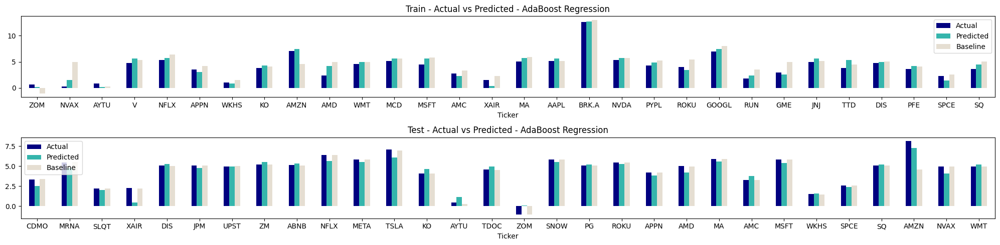

In [122]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

In [124]:
result_noout_df

,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.44,0.41,0.64,0.91
1,Linear Regression Test,2.19,164.13,12.81,-38.74
2,Ridge Regression Train,0.43,0.33,0.58,0.93
3,Ridge Regression Test,2.02,122.74,11.08,-28.72
4,Lasso Regression Train,1.54,4.79,2.19,-0.01
5,Lasso Regression Test,1.32,4.18,2.05,-0.01
6,Gradient Boosting Regression Train,0.27,0.16,0.40,0.97
7,Gradient Boosting Regression Test,0.57,0.81,0.90,0.80
8,Elastic Regression Train,1.50,4.59,2.14,0.03
9,Elastic Regression Test,1.27,3.98,1.99,0.04


In [113]:
result_noout_df = pd.DataFrame(models)
result_noout_df


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.44,0.41,0.64,0.91
1,Linear Regression Test,2.19,164.13,12.81,-38.74
2,Ridge Regression Train,0.43,0.33,0.58,0.93
3,Ridge Regression Test,2.02,122.74,11.08,-28.72
4,Lasso Regression Train,1.54,4.79,2.19,-0.01
5,Lasso Regression Test,1.32,4.18,2.05,-0.01
6,Gradient Boosting Regression Train,0.27,0.16,0.40,0.97
7,Gradient Boosting Regression Test,0.57,0.81,0.90,0.80
8,Elastic Regression Train,1.50,4.59,2.14,0.03
9,Elastic Regression Test,1.27,3.98,1.99,0.04


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.44,0.41,0.64,0.91
1,Linear Regression Test,2.19,164.13,12.81,-38.74
2,Ridge Regression Train,0.43,0.33,0.58,0.93
3,Ridge Regression Test,2.02,122.74,11.08,-28.72
4,Lasso Regression Train,1.54,4.79,2.19,-0.01
5,Lasso Regression Test,1.32,4.18,2.05,-0.01
6,Gradient Boosting Regression Train,0.27,0.16,0.40,0.97
7,Gradient Boosting Regression Test,0.57,0.81,0.90,0.80
8,Elastic Regression Train,1.50,4.59,2.14,0.03
9,Elastic Regression Test,1.27,3.98,1.99,0.04


result_ohe_df - for one hot encoder all imputed tickers 
result_te_df - for target encoder on all imputed tickers
result_oe_df - for ordinal encoder on all imputed tickers
result_noout_df - no outlier was treated 

## FINISH

### Trainings and predictions based on dimensionality and data reductions 

### DIMENSION REDUCTION

In [125]:
#data col reduction more dims
data_col_red = df_imputed2.copy()
data_col_red = data_col_red.drop(columns=["Price Change","Previous Day Price","Day of Week","Quarter", "Day", "Year", "Avg Share Price (Acquired)", "Avg Share Price (disposed) ", "accountsPayables", "addTotalDebt", "Value - T","Market Capitalization","Month","EnvironmentScore","GovernanceScore", "eps","ESGscore","AvgPositiveScore","AvgNegativeScore","IsCovidYear" ])
#data["Close"]
#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date'])) 

In [126]:
import pandas as pd
import category_encoders as ce

# Assuming you have a DataFrame named 'df' with categorical columns 'cat_col1' and 'cat_col2'

df = data_col_red

# Ordinal Encoding
ordinal_encoder = ce.OrdinalEncoder(cols=['Ticker','Industry', 'Sector'
        ])
df_ordinal_encoded = ordinal_encoder.fit_transform(df)

# Target Encoding
target_encoder = ce.TargetEncoder(cols=['Ticker', 'Industry', 'Sector'
    ])
df_target_encoded = target_encoder.fit_transform(df, df['Close'])

# Print the encoded DataFrames
print("Ordinal Encoding:")
print(df_ordinal_encoded)
print("\nTarget Encoding:")
print(df_target_encoded)


Ordinal Encoding:
       Ticker  Industry  Sector       Date  Close  Volume  netReceivables  \
0           1         1       1 2023-03-17   5.04   18.41           23.37   
1           1         1       1 2023-03-16   5.05   18.15           24.18   
2           1         1       1 2023-03-15   5.03   18.16           13.66   
3           1         1       1 2023-03-14   5.03   18.12           13.66   
4           1         1       1 2023-03-13   5.01   18.25           23.73   
...       ...       ...     ...        ...    ...     ...             ...   
64506      50         4      39 2018-01-08   0.71    9.47           11.15   
64507      50         4      39 2018-01-05   0.69   10.42           11.15   
64508      50         4      39 2018-01-04   0.62    8.74           11.15   
64509      50         4      39 2018-01-03   0.63    9.59           11.15   
64510      50         4      39 2018-01-02   0.64   10.03           11.15   

       inventory  propertyPlantEquipmentNet  totalCurrent

In [127]:
df_target_encoded.corr()

,Ticker,Industry,Sector,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
Ticker,1.00,0.53,0.98,0.95,-0.14,0.62,0.40,0.44,0.52,0.34,0.02,0.48,0.47,0.10,0.27,0.08,0.08,0.30,0.09,-0.34,-0.50,0.12,-0.58,0.39,0.49,0.13,0.02,0.23,0.17,0.17,0.12,0.23,-0.10,0.42,0.45,-0.03,0.09,-0.04,0.16,0.20,-0.02
Industry,0.53,1.00,0.54,0.50,0.06,0.34,0.11,0.18,0.31,0.20,-0.01,0.28,0.27,0.06,0.15,0.05,0.01,0.11,0.03,-0.13,-0.15,-0.09,-0.21,0.18,0.28,0.02,0.12,0.17,0.26,0.23,0.09,0.15,-0.00,0.23,0.24,0.02,-0.01,-0.01,0.09,0.10,0.01
Sector,0.98,0.54,1.00,0.93,-0.15,0.60,0.36,0.41,0.48,0.32,0.02,0.45,0.43,0.09,0.27,0.08,0.07,0.28,0.07,-0.32,-0.47,0.12,-0.54,0.35,0.45,0.13,0.02,0.21,0.16,0.16,0.11,0.22,-0.12,0.42,0.45,-0.02,0.10,-0.04,0.17,0.21,-0.01
Close,0.95,0.50,0.93,1.00,-0.13,0.60,0.39,0.42,0.51,0.34,0.04,0.46,0.46,0.08,0.24,0.06,0.09,0.29,0.09,-0.32,-0.49,0.12,-0.55,0.38,0.52,0.16,-0.00,0.23,0.18,0.19,0.13,0.24,-0.09,0.42,0.45,-0.03,0.08,-0.03,0.15,0.20,-0.01
Volume,-0.14,0.06,-0.15,-0.13,1.00,0.38,0.48,0.49,0.56,0.30,0.01,0.51,0.55,0.08,0.13,0.01,0.22,0.04,0.18,-0.17,-0.27,-0.03,-0.14,0.52,0.53,0.04,-0.25,0.29,0.23,0.29,0.48,0.36,0.43,0.25,0.27,0.22,0.09,0.24,0.27,0.24,0.13
netReceivables,0.62,0.34,0.60,0.60,0.38,1.00,0.79,0.85,0.90,0.59,0.09,0.86,0.89,0.20,0.38,0.10,0.38,0.41,0.34,-0.52,-0.76,0.08,-0.70,0.80,0.85,0.16,-0.06,0.38,0.19,0.24,0.33,0.33,0.14,0.39,0.42,0.08,0.13,0.09,0.28,0.29,0.13
inventory,0.40,0.11,0.36,0.39,0.48,0.79,1.00,0.83,0.85,0.56,0.20,0.82,0.87,0.15,0.26,0.06,0.42,0.38,0.35,-0.46,-0.74,0.08,-0.67,0.81,0.81,0.17,-0.11,0.39,0.12,0.22,0.36,0.35,0.23,0.36,0.38,0.08,0.14,0.09,0.29,0.30,0.13
propertyPlantEquipmentNet,0.44,0.18,0.41,0.42,0.49,0.85,0.83,1.00,0.87,0.61,-0.06,0.91,0.90,0.21,0.34,0.09,0.42,0.35,0.33,-0.47,-0.74,0.08,-0.75,0.82,0.83,0.15,-0.13,0.37,0.14,0.23,0.37,0.33,0.23,0.34,0.36,0.12,0.10,0.10,0.26,0.27,0.10
totalCurrentAssets,0.52,0.31,0.48,0.51,0.56,0.90,0.85,0.87,1.00,0.60,0.11,0.90,0.96,0.19,0.33,0.09,0.35,0.36,0.31,-0.51,-0.77,0.07,-0.71,0.88,0.91,0.14,-0.13,0.41,0.17,0.25,0.43,0.39,0.25,0.40,0.43,0.12,0.12,0.14,0.30,0.31,0.15
totalLiabilities,0.34,0.20,0.32,0.34,0.30,0.59,0.56,0.61,0.60,1.00,-0.02,0.63,0.64,0.11,0.19,0.05,0.22,0.20,0.18,-0.32,-0.50,-0.01,-0.44,0.50,0.57,0.10,-0.06,0.27,0.15,0.20,0.22,0.21,0.13,0.23,0.24,0.06,0.06,0.06,0.17,0.19,0.11


In [128]:
df_target_encoded

,Ticker,Industry,Sector,Date,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
0,5.19,4.96,5.19,2023-03-17,5.04,18.41,23.37,21.32,23.32,24.35,25.25,23.68,24.41,24.49,24.04,23.21,22.18,22.90,22.76,22.59,20.82,-1362.00,22.75,-888.39,22.41,27.36,27.40,4.22,8.04,7.17,7.57,2.51,17.96,13.54,4.96,4.76,2.04,12.67,13.97,2.68,2.29,1.52
1,5.19,4.96,5.19,2023-03-16,5.05,18.15,24.18,21.94,24.02,25.15,25.97,24.37,25.11,25.19,24.77,23.92,22.82,23.65,23.52,23.37,-1234.06,-1355.44,23.44,-1215.14,23.11,28.06,28.10,4.13,8.47,7.50,7.75,1.47,15.00,11.75,4.51,4.00,1.67,15.16,13.06,3.04,2.98,1.69
2,5.19,4.96,5.19,2023-03-15,5.03,18.16,13.66,15.25,12.57,18.06,19.15,-513.36,14.23,16.84,17.22,16.84,17.11,-179.75,-183.89,-182.04,22.00,-1339.24,-173.15,-89.84,17.36,19.66,19.59,4.35,8.46,7.49,7.76,1.30,14.91,10.18,4.56,4.74,1.67,13.02,13.16,3.04,3.39,0.75
3,5.19,4.96,5.19,2023-03-14,5.03,18.12,13.66,15.25,12.57,18.06,19.15,-513.36,14.23,16.84,17.22,16.84,17.11,-179.75,-183.89,-182.04,-1896.14,-1461.49,-173.15,-89.84,17.36,19.66,19.59,4.35,8.47,7.50,7.75,3.06,21.10,16.66,4.68,4.93,1.47,14.57,14.45,1.00,2.21,0.75
4,5.19,4.96,5.19,2023-03-13,5.01,18.25,23.73,21.22,23.37,24.53,25.34,23.54,24.41,24.66,24.13,23.27,22.21,22.97,22.84,22.66,-1281.66,-1533.04,22.81,-1031.28,22.40,27.41,27.45,4.24,8.04,7.17,7.57,2.56,15.12,14.45,3.89,4.19,2.12,13.15,13.82,-0.71,1.98,1.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64506,-0.62,3.00,-0.62,2018-01-08,0.71,9.47,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,9.89,-102.66,-119.53,-23.64,18.32,19.11,19.09,4.10,0.51,0.00,0.51,0.00,12.60,10.79,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,0.74
64507,-0.62,3.00,-0.62,2018-01-05,0.69,10.42,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,9.89,-102.66,-119.53,-23.64,18.32,19.11,19.09,4.10,0.51,0.00,0.51,0.00,12.60,10.79,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,0.74
64508,-0.62,3.00,-0.62,2018-01-04,0.62,8.74,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,9.89,-102.66,-119.53,-23.64,18.32,19.11,19.09,4.10,0.51,0.00,0.51,0.00,12.60,10.79,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,0.74
64509,-0.62,3.00,-0.62,2018-01-03,0.63,9.59,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,9.89,-102.66,-119.53,-23.64,18.32,19.11,19.09,4.10,0.51,0.00,0.51,0.00,12.60,10.79,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,0.74


In [129]:
#split based on full dataset 

from sklearn.model_selection import train_test_split
X = df_target_encoded.drop(columns=["Close"])
y = df_target_encoded["Close"]

# Sort the data by date
sorted_df = df_target_encoded.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2021-12-31'
test_start_date = '2022-01-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [130]:
X_test

,Ticker,Industry,Sector,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
10049,2.21,3.00,3.05,2022-01-03,13.55,17.26,16.86,18.49,19.13,19.37,17.85,19.02,18.16,17.27,16.02,15.58,15.20,15.00,14.63,-214.52,-106.59,15.46,-271.54,17.94,20.87,20.90,4.18,0.51,0.00,0.29,0.00,8.93,5.86,3.07,3.07,0.00,10.70,6.55,1.19,1.54,2.01
32020,4.35,3.00,3.05,2022-01-03,16.29,21.94,21.39,21.11,23.52,23.08,23.56,20.67,22.95,22.50,22.32,20.36,22.19,22.16,22.02,13.82,-461.04,21.74,-509.16,19.81,24.96,24.90,4.22,7.57,6.86,6.60,1.73,15.61,11.41,4.32,4.38,1.61,14.30,11.34,3.27,3.54,2.01
48255,1.88,5.91,1.88,2022-01-03,13.94,19.32,15.57,18.13,19.94,20.66,20.02,20.43,18.63,19.43,18.86,18.84,16.09,14.95,-186.13,-268.58,-102.63,16.88,-207.62,18.92,19.94,20.73,4.31,0.00,6.86,0.00,1.10,12.47,10.52,2.19,2.26,1.39,10.18,12.11,2.80,0.97,2.01
61216,1.75,3.00,1.75,2022-01-03,12.51,13.31,12.77,15.25,18.35,16.86,18.10,15.06,16.19,11.89,-40.82,16.11,-269.81,-273.38,-271.46,-154.50,-102.66,-199.16,-69.66,17.06,18.96,18.37,4.04,1.39,0.00,0.00,0.00,12.60,10.79,1.81,1.81,0.00,12.63,11.33,1.30,1.30,2.01
14794,4.73,4.94,5.16,2022-01-03,16.14,23.42,21.02,24.21,24.22,25.33,25.22,24.71,24.13,23.81,22.70,22.34,21.89,21.51,20.82,-1118.96,-1309.40,-585.78,-993.63,21.32,26.36,26.50,4.28,0.51,6.86,6.06,0.51,14.55,10.00,4.06,4.10,1.30,13.91,15.14,2.96,2.96,2.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13061,4.84,5.91,4.84,2023-03-17,17.25,23.43,20.73,24.53,25.15,24.98,25.29,23.94,24.15,24.00,23.68,22.74,23.35,23.18,23.03,-1419.75,-1555.23,22.98,-1517.27,21.97,27.73,27.74,4.25,6.15,4.97,3.98,3.33,15.80,11.69,3.94,4.20,1.39,15.08,11.69,4.05,4.15,1.26
43510,4.82,4.96,4.98,2023-03-17,17.12,24.49,22.16,24.11,25.65,27.58,25.73,25.98,25.19,24.55,23.96,23.05,23.56,23.45,23.02,22.02,-1501.13,22.96,-1516.36,23.32,27.37,27.46,3.98,7.01,6.64,4.77,2.56,16.68,12.38,4.30,4.30,3.33,14.62,13.10,-1.01,2.57,0.89
22561,4.80,5.91,4.80,2023-03-17,17.46,24.80,22.31,24.20,25.68,27.75,25.76,26.00,25.21,24.63,24.02,23.09,23.46,23.52,22.95,-2417.10,-1495.49,-3099.98,-1582.09,23.32,27.51,27.56,4.04,4.76,2.30,3.19,1.79,16.74,13.18,4.82,5.01,2.43,16.25,14.35,2.16,2.23,0.30
1311,4.94,4.39,4.94,2023-03-17,15.52,22.74,22.90,23.32,24.17,24.93,24.50,24.05,24.14,23.56,22.97,22.41,22.48,22.14,21.87,-634.68,-1336.82,22.14,-848.36,21.34,26.58,26.63,4.24,3.86,0.98,2.12,1.95,17.68,12.91,4.74,4.83,2.34,11.92,10.39,2.20,2.20,1.73


In [131]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(X_train['Date'])) 
X_test['Date'] = pd.to_numeric(pd.to_datetime(X_test['Date'])) 


Dimensionality Reduction 

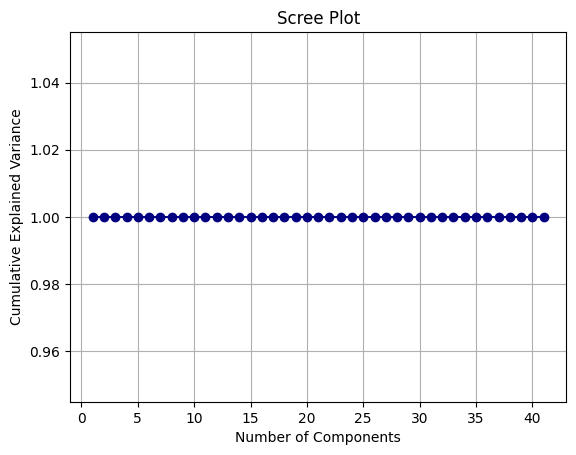

In [132]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [133]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                         Feature  Importance
0                         Ticker        0.63
4                         Volume        0.08
2                         Sector        0.08
13                       revenue        0.07
8             totalCurrentAssets        0.05
3                           Date        0.02
24          marketCapitalization        0.02
11                     totalDebt        0.01
6                      inventory        0.01
20                 dividendsPaid        0.01
23                numberOfShares        0.00
9               totalLiabilities        0.00
15             operatingExpenses        0.00
10                   totalEquity        0.00
14                   grossProfit        0.00
7      propertyPlantEquipmentNet        0.00
12       totalCurrentLiabilities        0.00
21             operatingCashFlow        0.00
25               enterpriseValue        0.00
40                 InflationRate        0.00
18                     netIncome        0.00
26        

In [134]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_train)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(15)], index=feature_names)


In [135]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
Ticker,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.01,0.00,0.01,-0.07,0.02,-0.15
Industry,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.05,0.03,-0.04
Sector,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.01,-0.00,-0.01,0.00,0.01,-0.06,0.02,-0.14
Date,-1.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00
Volume,-0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.01,0.00,0.00,0.00,0.00,-0.17,0.15,0.32
netReceivables,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,-0.01,0.01,0.02,-0.21,0.10,0.03
inventory,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.01,-0.17,0.09,0.13
propertyPlantEquipmentNet,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.01,0.01,-0.01,0.01,0.01,-0.19,0.07,0.13
totalCurrentAssets,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.01,-0.19,0.11,0.12
totalLiabilities,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.01,-0.00,0.00,0.01,-0.60,-0.78,-0.04


In [136]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [137]:
X_train

,Ticker,Industry,Sector,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
64510,-0.62,3.00,-0.62,1514851200000000000,10.03,11.15,15.97,12.41,15.21,14.05,15.10,12.61,14.05,15.86,14.53,14.59,-128.74,-129.46,-129.49,9.89,-102.66,-119.53,-23.64,18.32,19.11,19.09,4.10,0.51,0.00,0.51,0.00,12.60,10.79,1.81,1.81,0.69,10.71,12.32,-1.17,-1.17,0.74
36726,2.83,3.00,3.05,1514851200000000000,15.35,17.07,16.30,17.29,19.01,19.74,-463.18,19.67,17.62,16.08,17.06,17.79,-345.45,-351.73,-359.22,15.83,-102.66,-404.28,-53.13,16.64,20.38,20.66,4.05,0.51,0.00,0.00,2.12,16.92,12.12,4.79,4.84,2.96,14.27,15.15,3.64,3.39,0.74
8435,0.23,3.00,0.23,1514851200000000000,10.06,13.50,13.69,12.47,16.50,16.18,16.36,12.61,15.28,13.32,-80.92,15.45,-125.37,-195.96,-141.24,13.38,-106.59,-159.77,-39.69,13.99,21.83,21.82,4.19,0.51,6.86,5.44,0.00,12.29,9.69,2.92,2.92,0.00,12.69,11.23,0.81,0.95,0.74
57725,5.21,4.96,4.98,1514851200000000000,15.61,22.05,21.06,21.58,23.64,24.28,24.25,23.73,22.98,22.35,22.13,20.43,21.98,21.93,21.68,17.31,-788.37,21.76,-597.21,21.44,26.23,26.28,3.96,7.57,6.86,6.60,2.16,17.38,12.20,5.23,5.23,2.20,17.38,12.64,4.32,4.44,0.74
35415,5.91,4.94,5.16,1514851200000000000,16.20,21.52,21.37,19.65,22.78,23.50,22.11,22.60,22.52,22.03,21.13,20.78,21.52,19.92,19.49,19.16,-449.79,-618.63,-363.34,19.89,25.58,25.61,4.23,0.51,6.86,6.06,1.10,15.21,12.30,4.39,5.07,2.93,15.51,11.43,3.43,5.29,0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45125,3.99,4.94,3.99,1640822400000000000,16.12,19.54,21.00,20.02,22.04,22.10,20.19,20.93,21.50,20.16,19.85,20.14,-484.12,-518.82,-523.30,-516.93,-461.04,18.62,-355.54,20.18,24.82,24.79,4.18,5.81,1.39,3.09,0.69,14.96,10.84,4.65,4.30,1.73,14.46,13.40,3.74,4.17,1.95
304,5.19,4.96,5.19,1640822400000000000,17.91,24.90,22.49,24.39,25.75,26.46,25.00,25.53,25.72,25.54,24.72,23.27,24.52,24.45,24.27,-1578.62,-1551.13,24.57,-1409.96,23.52,28.69,28.72,4.51,7.61,6.87,5.04,2.43,15.69,11.90,5.00,4.93,2.16,13.69,13.17,3.24,2.95,1.95
25151,4.03,4.37,4.03,1640822400000000000,15.86,21.98,21.95,23.02,23.84,24.96,23.86,24.48,23.72,22.97,22.41,21.81,21.96,21.24,21.60,-658.08,-1219.81,21.95,-861.32,22.19,26.27,26.39,4.13,5.43,5.35,1.95,1.95,16.90,12.28,4.17,4.22,2.75,13.50,12.22,1.26,3.65,1.95
53531,6.12,4.39,6.12,1640822400000000000,16.57,21.37,22.47,24.16,24.02,24.14,24.13,22.91,23.70,23.60,22.30,21.53,21.99,21.68,21.57,16.71,-1519.74,22.25,-1219.59,21.84,27.70,27.69,4.05,8.82,8.11,7.00,1.10,15.51,12.40,4.31,5.07,2.71,14.83,11.62,3.63,4.93,1.95


In [138]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [139]:
import matplotlib.pyplot as plt

data = {
    "Ticker": ["AAPL", "ABNB", "AMC", "AMD", "AMZN", "APPN", "AYTU", "BRK.A", "CDMO", "CLNE",
               "CLOV", "COIN", "DIS", "FB", "GME", "GOOGL", "HIMS", "JNJ", "JPM", "KO",
               "LMND", "MA", "MCD", "META", "MRNA", "MSFT", "NFLX", "NVAX", "NVDA", "PFE",
               "PG", "PYPL", "RBLX", "ROKU", "RUN", "SLQT", "SNOW", "SPCE", "SQ", "TDOC",
               "TSLA", "TTD", "UPST", "V", "WISH", "WKHS", "WMT", "XAIR", "ZM", "ZOM"],
    "Close": [5.18, 5.11, 3.30, 4.97, 4.59, 4.18, 0.30, 13.02, 3.37, 1.81,
1.31, 5.53, 5.04, 5.03, 5.00, 7.97, 1.88, 5.14, 5.06, 4.08,
3.74, 5.88, 5.59, 5.82, 5.54, 5.82, 6.40, 4.96, 5.68, 4.08,
5.10, 5.24, 4.64, 5.43, 3.54, 2.20, 5.83, 2.59, 5.08, 4.52,
6.96, 4.52, 5.02, 5.38, 1.13, 1.47, 4.97, 2.24, 5.21, -1.06]
}


df = pd.DataFrame(data)

In [140]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test, cv=5, param_grid=None):
    
    if param_grid is not None:
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv)
        grid_search.fit(x_train, y_train)
        model = grid_search.best_estimator_
        
    train_pred = cross_val_predict(model, x_train, y_train, cv=cv)
    test_pred = model.predict(x_test)

    train_mae = mean_absolute_error(y_train, train_pred)
    train_mse = mean_squared_error(y_train, train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r_squared = r2_score(y_train, train_pred)

    test_mae = mean_absolute_error(y_test, test_pred)
    test_mse = mean_squared_error(y_test, test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r_squared = r2_score(y_test, test_pred)

    train_result = {
        "Model": f"{model_name} Train",
        "MAE": round(train_mae, 2),
        "MSE": round(train_mse, 2),
        "RMSE": round(train_rmse, 2),
        "R2 Score": round(train_r_squared, 4)
    }
    print(train_result)

    test_result = {
        "Model": f"{model_name} Test",
        "MAE": round(test_mae, 2),
        "MSE": round(test_mse, 2),
        "RMSE": round(test_rmse, 2),
        "R2 Score": round(test_r_squared, 4)
    }
    print(test_result)


    tickers_table = df_imputed["Ticker"]

    rf_df_tmp_train = pd.DataFrame({"Actual": y_train[:30], "Predicted": train_pred[:30]})
    rf_df_tmp_test = pd.DataFrame({"Actual": y_test[:30], "Predicted": test_pred[:30]})

    # Merge on index
    rf_df_tmp_train = rf_df_tmp_train.merge(tickers_table, left_index=True, right_index=True)
    rf_df_tmp_test = rf_df_tmp_test.merge(tickers_table, left_index=True, right_index=True)

    # Set Ticker column as the index
    rf_df_tmp_train.set_index("Ticker", inplace=True)
    rf_df_tmp_test.set_index("Ticker", inplace=True)

    # Add "Close" data to the dataframes
    rf_df_tmp_train["Close"] = df.set_index("Ticker")["Close"]
    rf_df_tmp_test["Close"] = df.set_index("Ticker")["Close"]

    # Plot the dataframes
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))

    rf_df_tmp_train.plot(ax=ax1, figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax1.legend(["Actual", "Predicted", "Baseline"])
    ax1.set_xticklabels(rf_df_tmp_train.index)

    rf_df_tmp_test.plot(ax=ax2, figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax2.legend(["Actual", "Predicted", "Baseline"])
    ax2.set_xticklabels(rf_df_tmp_test.index)

    plt.tight_layout()
    plt.show()



    return train_result, test_result





In [143]:
models = []

In [144]:
# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train_scaled, y_train)

LinearRegression()

{'Model': 'Linear Regression Train', 'MAE': 0.46, 'MSE': 0.5, 'RMSE': 0.71, 'R2 Score': 0.8947}
{'Model': 'Linear Regression Test', 'MAE': 2.02, 'MSE': 130.49, 'RMSE': 11.42, 'R2 Score': -30.5943}


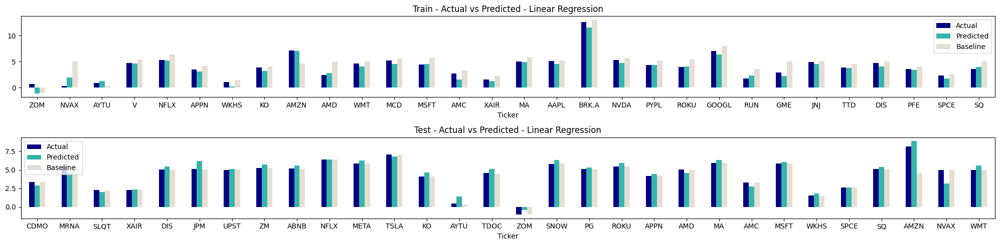

In [145]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

In [146]:
# Ridge 
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)

Ridge()

{'Model': 'Ridge Regression Train', 'MAE': 0.45, 'MSE': 0.36, 'RMSE': 0.6, 'R2 Score': 0.9242}
{'Model': 'Ridge Regression Test', 'MAE': 1.89, 'MSE': 102.6, 'RMSE': 10.13, 'R2 Score': -23.843}


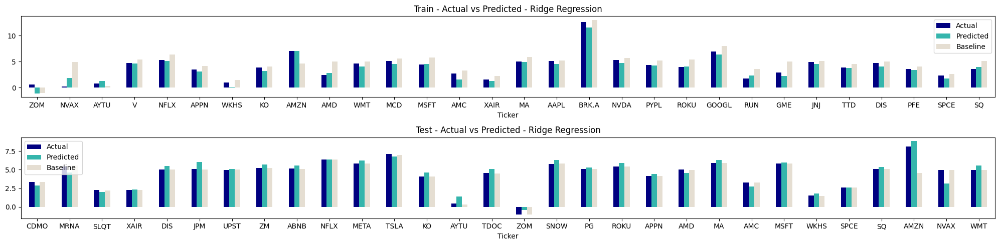

In [147]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


In [148]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

{'Model': 'Lasso Regression Train', 'MAE': 1.54, 'MSE': 4.79, 'RMSE': 2.19, 'R2 Score': -0.0083}
{'Model': 'Lasso Regression Test', 'MAE': 1.32, 'MSE': 4.18, 'RMSE': 2.05, 'R2 Score': -0.0133}


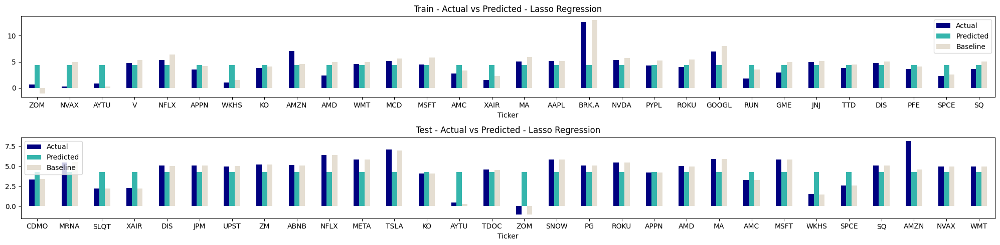

In [149]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


In [150]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.27, 'MSE': 0.16, 'RMSE': 0.4, 'R2 Score': 0.9664}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.57, 'MSE': 0.81, 'RMSE': 0.9, 'R2 Score': 0.8043}


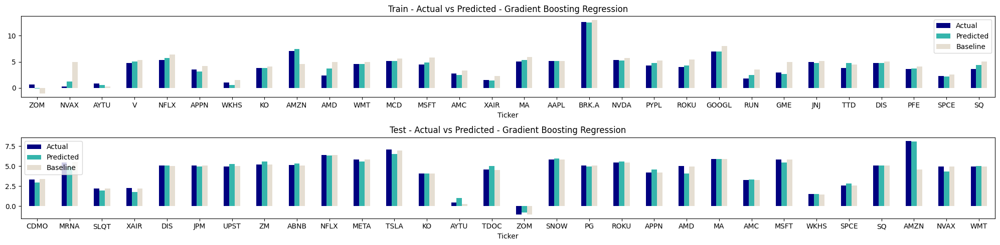

In [151]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

In [152]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

{'Model': 'Elastic Regression Train', 'MAE': 1.54, 'MSE': 4.79, 'RMSE': 2.19, 'R2 Score': -0.0083}
{'Model': 'Elastic Regression Test', 'MAE': 1.32, 'MSE': 4.18, 'RMSE': 2.05, 'R2 Score': -0.0133}


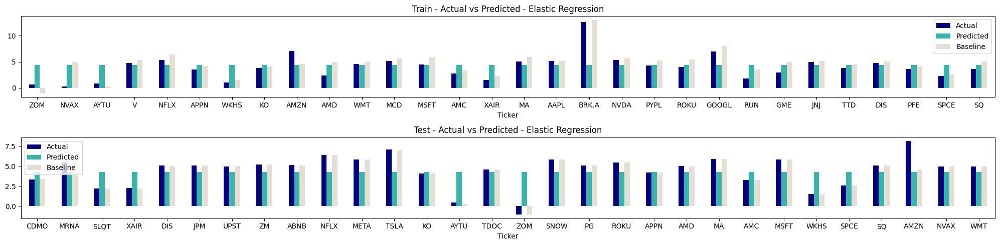

In [153]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


In [154]:
# Random forest regressor 
rf = RandomForestRegressor()
rf.fit(X_train_scaled, y_train)

RandomForestRegressor()

{'Model': 'Random Forest Regression Train', 'MAE': 0.22, 'MSE': 0.14, 'RMSE': 0.37, 'R2 Score': 0.9707}
{'Model': 'Random Forest Regression Test', 'MAE': 0.6, 'MSE': 0.84, 'RMSE': 0.92, 'R2 Score': 0.7962}


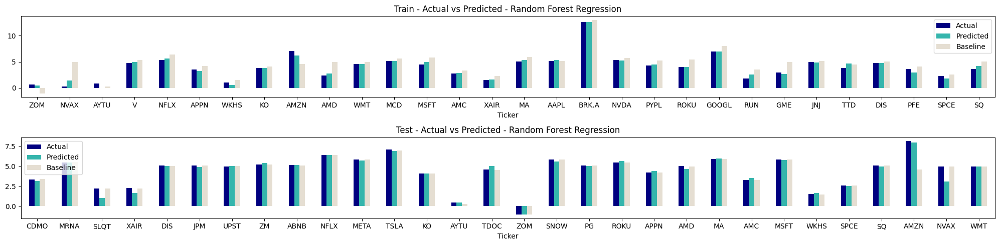

In [155]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


In [156]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor()
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor()

{'Model': 'Decision Tree Regression Train', 'MAE': 0.26, 'MSE': 0.18, 'RMSE': 0.43, 'R2 Score': 0.9611}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.64, 'MSE': 0.96, 'RMSE': 0.98, 'R2 Score': 0.7676}


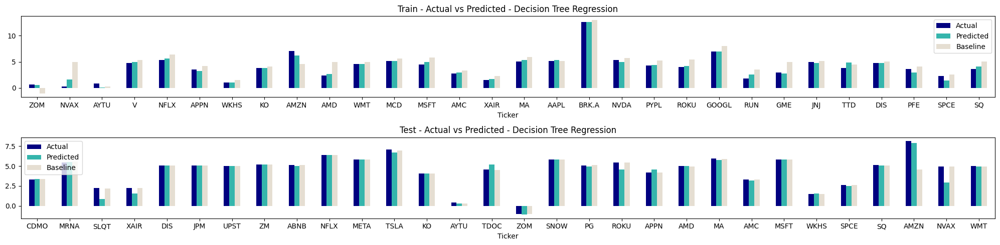

In [157]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

In [158]:
# Support Vector Machine regressor 
svr = SVR()
svr.fit(X_train_scaled, y_train)

SVR()

{'Model': 'SVR Regression Train', 'MAE': 0.28, 'MSE': 0.18, 'RMSE': 0.42, 'R2 Score': 0.9629}
{'Model': 'SVR Regression Test', 'MAE': 0.74, 'MSE': 1.21, 'RMSE': 1.1, 'R2 Score': 0.7075}


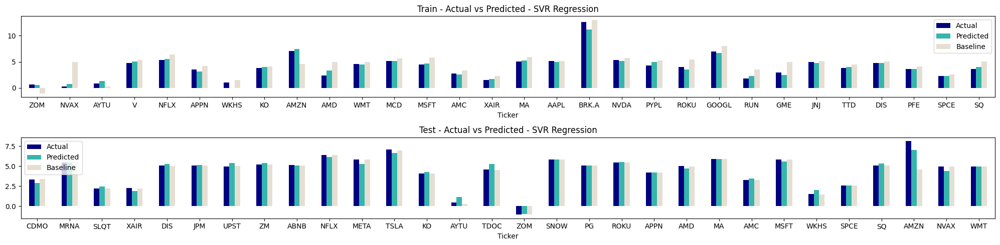

In [159]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [160]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor()
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor()

{'Model': 'AdaBoost Regression Train', 'MAE': 0.45, 'MSE': 0.33, 'RMSE': 0.58, 'R2 Score': 0.9295}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.75, 'MSE': 1.14, 'RMSE': 1.07, 'R2 Score': 0.7249}


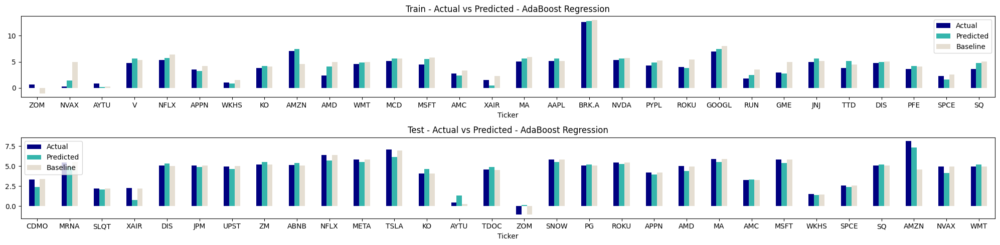

In [161]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

In [162]:
result_col_red = pd.DataFrame(models)
result_col_red


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.46,0.50,0.71,0.89
1,Linear Regression Test,2.02,130.49,11.42,-30.59
2,Ridge Regression Train,0.45,0.36,0.60,0.92
3,Ridge Regression Test,1.89,102.60,10.13,-23.84
4,Lasso Regression Train,1.54,4.79,2.19,-0.01
5,Lasso Regression Test,1.32,4.18,2.05,-0.01
6,Gradient Boosting Regression Train,0.27,0.16,0.40,0.97
7,Gradient Boosting Regression Test,0.57,0.81,0.90,0.80
8,Elastic Regression Train,1.54,4.79,2.19,-0.01
9,Elastic Regression Test,1.32,4.18,2.05,-0.01


In [ ]:
result_noout_df

## FINISH LINE

## FINISH LINE

### ROW REDUCTION

In [163]:
#data row reduction

data_row_red = df_imputed2.copy()

import pandas as pd

# create sample dataframe
df = data_row_red

# filter dataframe with dates between '2022-01-03' and '2022-01-07'
start_date = pd.to_datetime('2021-01-01')
end_date = pd.to_datetime('2022-12-31')
data_row_red = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

data_row_red=data_row_red.drop(columns=["Price Change","Previous Day Price"])



In [164]:
data_row_red

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
52,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2022-12-30,December,Friday,4.87,18.16,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,0.64,22.18,-1824.66,-1556.10,24.25,-1558.71,23.49,28.36,25.43,28.40,3.91,3.91,4.15,4.00,8.54,-0.53,-0.98,7.63,7.81,3.36,18.75,13.77,5.04,4.95,5.13,3.49,13.76,13.91,1.93,3.24,2.95,1.86,3.26,7.61,1.39,3.40
53,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2022-12-29,December,Thursday,4.86,18.14,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,0.64,22.18,-1824.66,-1556.10,24.25,-1558.71,23.49,28.36,25.43,28.40,3.91,3.91,4.15,4.00,8.90,-0.65,-0.99,7.75,8.37,2.79,18.00,13.24,4.83,4.95,4.94,1.99,13.76,13.85,1.93,3.24,2.95,1.86,3.26,7.61,1.39,3.37
54,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2022-12-28,December,Wednesday,4.84,18.26,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,0.64,22.18,-1824.66,-1556.10,24.25,-1558.71,23.49,28.36,25.43,28.40,3.91,3.91,4.15,4.00,9.14,-0.69,-0.99,7.97,8.62,2.75,18.63,14.05,4.58,4.53,4.66,1.67,13.76,14.15,1.93,3.24,2.95,1.86,3.26,7.61,1.39,3.33
55,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2022-12-27,December,Tuesday,4.87,18.05,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,0.64,22.18,-1824.66,-1556.10,24.25,-1558.71,23.49,28.36,25.43,28.40,3.91,3.91,4.15,4.00,8.75,-0.81,-0.99,7.73,8.14,2.16,17.98,13.05,4.84,4.81,4.88,1.61,16.28,13.84,2.68,3.24,3.08,1.86,3.26,7.61,1.39,3.30
56,AAPL,Large-cap,Information Technology,Consumer Electronics,PostCovid,2022-12-23,December,Friday,4.88,17.97,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,0.64,22.18,-1824.66,-1556.10,24.25,-1558.71,23.49,28.36,25.43,28.40,3.91,3.91,4.15,4.00,8.74,-0.67,-0.99,7.70,8.13,1.99,18.00,12.99,4.83,4.95,4.94,2.08,13.69,13.21,1.63,3.24,2.95,1.86,3.26,7.61,1.39,3.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63750,ZOM,Small-cap,Health Care,Diagnostics & Research,PostCovid,2021-01-08,January,Friday,-0.90,19.49,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-0.17,-20.44,-49.38,-106.59,-138.18,-26.26,20.61,21.06,14.41,20.85,3.44,4.24,4.30,4.06,0.51,-0.75,-0.98,0.00,0.00,0.29,13.47,9.11,3.83,3.62,4.01,0.00,12.30,9.26,3.04,3.04,3.04,0.34,3.10,7.61,0.00,2.08
63751,ZOM,Small-cap,Health Care,Diagnostics & Research,PostCovid,2021-01-07,January,Thursday,-0.97,18.67,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-0.17,-20.44,-49.38,-106.59,-138.18,-26.26,20.61,21.06,14.41,20.85,3.44,4.24,4.30,4.06,0.51,-0.75,-0.98,0.00,0.00,1.10,14.44,9.36,4.88,4.87,4.89,2.08,10.81,10.52,0.86,3.04,1.90,0.34,3.10,7.61,0.00,1.95
63752,ZOM,Small-cap,Health Care,Diagnostics & Research,Pos

In [165]:
import pandas as pd
import category_encoders as ce

# Assuming you have a DataFrame named 'df' with categorical columns 'cat_col1' and 'cat_col2'

df = data_row_red

# Ordinal Encoding
ordinal_encoder = ce.OrdinalEncoder(cols=['Ticker', 'Market Capitalization', 'Industry', 'Sector',
        'Month', 'Day of Week', 'IsCovidYear'])
df_ordinal_encoded = ordinal_encoder.fit_transform(df)

# Target Encoding
target_encoder = ce.TargetEncoder(cols=['Ticker', 'Market Capitalization', 'Industry', 'Sector',
    'Month', 'Day of Week','IsCovidYear'])
df_target_encoded = target_encoder.fit_transform(df, df['Close'])

# Print the encoded DataFrames
print("Ordinal Encoding:")
print(df_ordinal_encoded)
print("\nTarget Encoding:")
print(df_target_encoded)


Ordinal Encoding:
       Ticker  Market Capitalization  Industry  Sector  IsCovidYear  \
52          1                      1         1       1            1   
53          1                      1         1       1            1   
54          1                      1         1       1            1   
55          1                      1         1       1            1   
56          1                      1         1       1            1   
...       ...                    ...       ...     ...          ...   
63750      49                      2         4      39            1   
63751      49                      2         4      39            1   
63752      49                      2         4      39            1   
63753      49                      2         4      39            1   
63754      49                      2         4      39            1   

            Date  Month  Day of Week  Close  Volume  netReceivables  \
52    2022-12-30      1            1   4.87   18.16       

In [166]:
df_target_encoded.corr()

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Month,Day of Week,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
Ticker,1.00,0.58,0.45,0.98,NaN,0.00,0.00,0.96,-0.28,0.62,0.42,0.46,0.50,0.47,0.00,0.48,0.46,0.20,0.22,0.45,0.14,0.31,0.12,0.18,-0.33,-0.18,-0.50,0.19,-0.58,0.27,0.49,0.48,0.15,0.22,0.02,-0.06,0.12,0.24,-0.13,-0.03,0.20,0.22,0.06,0.16,-0.14,0.41,0.38,0.41,-0.00,0.12,-0.06,0.19,0.17,0.20,-0.00,0.01,0.02,-0.00,0.00
Market Capitalization,0.58,1.00,0.23,0.52,NaN,-0.16,-0.00,0.55,0.24,0.77,0.76,0.73,0.83,0.78,0.05,0.74,0.80,0.33,0.26,0.71,0.46,0.56,0.45,0.43,-0.46,-0.10,-0.77,0.29,-0.65,0.71,0.79,0.74,0.15,0.07,-0.04,-0.06,-0.01,0.50,-0.22,0.13,0.18,0.28,0.21,0.29,0.11,0.37,0.36,0.38,0.03,0.20,0.02,0.28,0.31,0.30,0.08,0.13,0.05,0.16,-0.00
Industry,0.45,0.23,1.00,0.47,NaN,0.10,0.00,0.43,-0.03,0.27,0.05,0.15,0.21,0.22,-0.04,0.21,0.17,0.05,0.15,0.14,0.02,0.10,0.04,-0.01,-0.04,-0.21,-0.07,-0.04,-0.15,0.04,0.22,0.19,0.00,-0.01,0.08,0.14,0.07,0.19,-0.04,-0.10,0.27,0.24,0.00,0.08,-0.02,0.16,0.16,0.17,0.06,-0.03,-0.03,0.02,0.05,0.05,-0.03,-0.07,-0.01,-0.10,0.00
Sector,0.98,0.52,0.47,1.00,NaN,-0.00,-0.00,0.94,-0.30,0.59,0.38,0.43,0.46,0.43,0.00,0.46,0.42,0.19,0.22,0.40,0.12,0.30,0.10,0.10,-0.32,-0.17,-0.46,0.18,-0.55,0.22,0.44,0.45,0.15,0.20,0.01,-0.06,0.10,0.22,-0.11,-0.04,0.19,0.20,0.04,0.14,-0.16,0.39,0.36,0.40,0.01,0.12,-0.07,0.19,0.17,0.20,0.00,0.02,0.03,0.00,0.00
IsCovidYear,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Month,0.00,-0.16,0.10,-0.00,NaN,1.00,0.01,0.07,-0.08,-0.15,-0.19,-0.16,-0.15,-0.16,-0.03,-0.17,-0.17,-0.02,-0.06,-0.20,-0.12,-0.12,-0.16,0.01,0.17,-0.14,0.19,-0.16,0.11,-0.15,-0.07,-0.17,0.05,-0.20,-0.01,-0.04,-0.13,-0.10,0.16,-0.19,0.12,0.09,-0.08,-0.02,-0.01,-0.03,-0.02,-0.04,0.02,-0.03,0.03,-0.07,-0.07,-0.06,-0.45,-0.53,-0.03,-0.95,-0.01
Day of Week,0.00,-0.00,0.00,-0.00,NaN,0.01,1.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.01,0.00,-0.00,0.01,0.00,0.01,-0.00,-0.00,-0.00,0.00,0.01,0.01,0.00,-0.00,0.00,0.00,-0.01,-0.01,-0.01,-0.00
Close,0.96,0.55,0.43,0.94,NaN,0.07,0.00,1.00,-0.29,0.58,0.40,0.44,0.48,0.44,0.01,0.46,0.44,0.19,0.19,0.42,0.16,0.32,0.13,0.19,-0.31,-0.18,-0.49,0.18,-0.55,0.27,0.52,0.46,0.20,0.15,-0.02,-0.07,0.05,0.23,-0.13,-0.03,0.22,0.24,0.06,0.19,-0.12,0.41,0.38,0.42,0.02,0.13,-0.04,0.20,0.17,0.21,-0.11,-0.15,-0.13,-0.07,-0.01
Volume,-0.28,0.24,-0.03,-0.30,NaN,-0.08,-0.00,-0.29,1.00,0.26,0.42,0.44,0.48,0.44,-0.03,0.39,0.46,0.18,0.02,0.43,0.23,0.07,0.19,0.14,-0.13,-0.01,-0.21,0.02,-0.13,0.48,0.43,0.39,0.01,-0.21,-0.21,-0.06,-0.25,0.28,-0.26,0.23,0.13,0.24,0.36,0.28,0.40,0.10,0.12,0.13,0.04,0.07,0.11,0.03,0.18,0.11,0.05,0.08,0.03,0.07,-0.01
netReceivables,0.62,0.77,0.27,0.59,NaN,-0.15,-0.00,0.58,0.26,1.00,0.80,0.82,0.89,0.90,0.06,0.86,0.88,0.47,0.31,0.79,0.46,0.49,0.41,0.34,-0.54,-0.19,-0.79,0.19,-0.71,0.73,0.82,0.85,0.18,0.04,-0.02,-0.10,-0.02,0.41,-0.29,0.19,0.20,0.26,0.21,0.24,0.07,0

In [167]:
#split based on data reduction

from sklearn.model_selection import train_test_split
X = df_target_encoded.drop(columns=["Close"])
y = df_target_encoded["Close"]

# Sort the data by date
sorted_df = df_target_encoded.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2022-06-30'
test_start_date = '2022-07-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [168]:
X_test

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
59781,4.94,5.20,4.33,4.94,4.35,2022-07-01,4.34,4.35,15.58,22.74,24.82,25.46,25.16,25.81,25.07,24.90,25.33,25.75,24.33,24.13,23.01,22.65,22.36,0.63,-1256.76,20.89,-1154.30,23.29,-1581.16,21.73,26.62,24.90,26.75,4.24,3.91,4.17,4.11,1.90,-1.02,-0.88,1.10,1.67,0.51,10.69,7.86,4.60,4.60,4.62,2.08,14.19,10.60,3.08,2.94,3.32,2.14,3.24,7.61,1.10,0.00
63378,-0.78,2.93,3.33,-0.78,4.35,2022-07-01,4.34,4.35,16.96,14.40,14.69,15.96,18.66,16.42,19.41,14.31,15.78,15.38,15.09,16.13,-151.63,-187.50,-170.94,-0.17,-70.20,14.82,-102.66,-140.44,-83.16,20.70,19.15,14.31,18.91,4.00,4.27,4.28,4.19,0.51,-0.77,-0.97,0.00,0.29,3.14,17.46,12.94,4.60,4.51,4.67,2.83,16.74,13.06,3.76,3.90,4.11,2.14,3.24,7.61,1.10,0.00
53405,6.45,5.20,4.51,6.45,4.35,2022-07-01,4.34,4.35,17.03,21.51,23.06,24.27,24.31,24.23,24.41,22.49,23.93,23.79,22.41,21.25,22.25,22.03,21.91,0.05,-577.90,20.48,-1524.63,22.35,-1217.12,21.87,27.45,22.49,27.43,4.25,4.00,4.16,4.14,7.57,-0.72,-0.96,6.86,6.60,1.10,17.07,10.30,6.73,6.67,6.81,1.39,15.00,10.91,4.10,3.81,4.31,2.14,3.24,7.61,1.10,0.00
43688,5.04,5.20,5.19,5.11,4.35,2022-07-01,4.34,4.35,16.09,24.45,22.23,21.30,24.73,24.75,23.73,23.09,24.49,22.65,21.97,21.56,21.41,20.83,21.01,0.14,-280.20,-303.66,-461.04,21.39,-566.71,20.87,25.32,23.09,25.36,3.88,4.32,4.09,4.11,7.57,-0.72,-0.96,6.86,6.60,0.00,11.28,6.98,4.30,4.30,4.30,0.00,11.30,7.68,0.98,3.32,1.00,2.14,3.24,7.61,1.10,0.00
32972,5.60,5.20,5.19,4.95,4.35,2022-07-01,4.34,4.35,16.94,24.17,22.17,25.23,25.80,25.95,25.88,24.82,25.19,24.64,24.27,23.30,23.94,23.79,23.59,0.85,23.19,-1161.51,-1665.63,23.87,-1845.25,22.73,28.18,24.82,28.20,4.13,4.02,4.03,4.06,0.51,-0.93,-0.86,0.51,0.69,2.27,17.04,11.87,5.26,4.87,5.33,1.99,13.62,12.04,2.82,3.51,3.49,2.14,3.24,7.61,1.10,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27837,5.85,5.20,5.19,5.11,4.35,2022-12-30,4.21,4.35,14.30,21.95,22.22,22.11,23.53,24.20,22.57,23.36,23.37,22.48,22.48,21.69,21.95,21.88,21.65,0.97,-537.17,19.45,-779.15,21.85,-697.27,20.68,26.53,23.36,26.55,4.45,4.36,4.25,4.36,5.33,-0.93,-0.97,3.14,5.11,0.00,14.64,8.75,5.89,5.89,5.89,0.00,13.25,8.75,4.50,4.50,4.50,1.86,3.26,7.61,1.39,3.40
54590,4.71,2.93,4.93,4.71,4.35,2022-12-30,4.21,4.35,14.95,21.58,20.22,19.79,22.07,21.54,21.47,19.38,21.43,20.01,19.83,19.78,18.76,18.42,18.08,-1.24,-681.60,19.36,-88.79,18.97,-370.01,20.01,23.81,19.38,23.78,4.45,4.36,4.25,4.36,0.51,-0.72,-0.95,6.86,6.06,1.79,14.37,12.43,3.32,3.23,3.95,1.39,11.08,12.97,0.96,0.56,2.75,1.86,3.26,7.61,1.39,3.40
29148,5.50,5.20,4.51,5.50,4.35,2022-12-30,4.21,4.35,14.36,21.47,17.77,24.32,22.41,24.76,-1817.46,24.61,22.06,22.50,21.95,20.51,21.74,21.68,21.37,0.96,-658.08,20.48,-1035.86,21.51,-808.71,20.41,25.99,24.61,26.20,4.45,4.36,4.25,4.36,5.86,-0.51,-0.93,5.16,4.75,0.00,12.02,4.53,1.72,1.72,1.73,0.00,10.66,10.03,0.63,0.63,0.63,1.86,3.26,7.61,1.39,3.40
19416,5.14,5.20,3.33,5.14,4.35,2022-12-30,4.21,4.35,15.25,23.68,23.25,23.71,24.74,25.43,25

In [169]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(X_train['Date'])) 
X_test['Date'] = pd.to_numeric(pd.to_datetime(X_test['Date'])) 


Dimensionality Reduction 

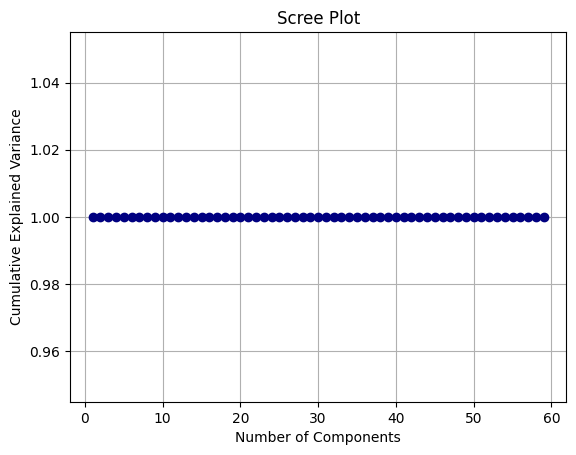

In [170]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [171]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                         Feature  Importance
0                         Ticker        0.67
17                       revenue        0.07
8                         Volume        0.07
3                         Sector        0.04
29                numberOfShares        0.04
30          marketCapitalization        0.04
32               enterpriseValue        0.02
5                           Date        0.01
14                   totalEquity        0.00
31                  addTotalDebt        0.00
26                 dividendsPaid        0.00
34                   SocialScore        0.00
12            totalCurrentAssets        0.00
23                           eps        0.00
2                       Industry        0.00
10                     inventory        0.00
41           TotNegativeMentions        0.00
36                      ESGscore        0.00
19             operatingExpenses        0.00
13              totalLiabilities        0.00
28            capitalExpenditure        0.00
16       t

In [172]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_train)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(15)], index=feature_names)


In [173]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
Ticker,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.01,-0.01,-0.01,-0.11,0.13,-0.06
Market Capitalization,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.01,-0.07,-0.01,-0.02
Industry,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.05,0.01,-0.06
Sector,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.01,-0.01,-0.01,-0.10,0.13,-0.06
IsCovidYear,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00
Date,-1.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00
Month,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.01,0.00
Day of Week,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00
Volume,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.01,0.00,-0.02,-0.11,-0.20,-0.03
netReceivables,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.01,-0.08,-0.21,0.02,-0.24


In [174]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [175]:
X_train

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
63754,-0.78,2.93,3.33,-0.78,4.35,1609718400000000000,4.58,4.36,19.83,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-0.17,-20.44,-49.38,-106.59,-138.18,-26.26,20.61,21.06,14.41,20.85,3.44,4.24,4.30,4.06,0.51,-0.75,-0.98,0.00,0.00,0.00,8.86,8.76,0.10,0.10,0.10,0.00,12.30,9.26,3.04,3.04,3.04,0.34,3.10,7.61,0.00,1.39
11608,2.03,2.93,2.03,2.03,4.35,1609718400000000000,4.58,4.36,15.61,18.31,17.13,19.58,19.44,19.15,20.05,18.32,18.27,18.16,16.52,16.88,15.62,-185.99,-192.82,-0.34,15.56,13.01,-106.59,15.00,-149.30,19.11,21.73,18.32,21.72,4.24,4.06,4.21,4.17,0.51,-0.72,-0.95,6.86,6.06,1.10,15.06,12.76,2.30,2.28,2.31,1.39,16.37,12.70,4.70,0.31,5.39,0.34,3.10,7.61,0.00,1.39
44064,5.04,5.20,5.19,5.11,4.35,1609718400000000000,4.58,4.36,15.91,24.39,22.34,21.31,24.70,24.69,23.69,22.91,24.45,22.52,21.81,21.35,20.93,20.76,20.82,-0.40,-459.47,-323.96,-925.99,21.29,-604.59,20.88,26.38,22.91,26.39,3.72,4.34,4.21,4.12,7.57,-0.72,-0.96,6.86,6.60,0.29,11.65,10.31,4.89,4.89,4.89,1.10,14.07,10.91,4.51,3.80,4.87,0.34,3.10,7.61,0.00,1.39
12919,1.47,2.93,3.33,1.73,4.35,1609718400000000000,4.58,4.36,16.86,17.72,17.18,16.03,20.51,19.44,20.19,17.84,18.97,19.12,-241.63,18.47,-322.11,-491.99,-364.47,-0.51,-325.54,-165.12,-106.59,-452.85,-46.26,19.75,21.77,17.84,21.64,3.92,4.12,4.22,4.09,0.51,-1.10,-0.83,0.51,1.54,1.95,14.77,9.30,4.90,4.84,4.94,1.95,18.84,17.85,2.30,2.30,2.30,0.34,3.10,7.61,0.00,1.39
42753,4.96,5.20,4.33,4.96,4.35,1609718400000000000,4.58,4.36,15.94,22.30,22.52,23.77,23.84,24.97,24.56,24.12,24.19,23.62,22.94,22.41,22.27,22.05,21.91,0.26,-521.71,20.42,-1262.23,22.13,-868.90,21.62,26.53,24.12,26.59,4.01,4.50,4.26,4.28,7.57,-0.72,-0.96,6.86,6.60,1.67,13.79,11.98,4.31,5.12,5.14,2.91,14.52,10.81,5.19,4.22,5.57,0.34,3.10,7.61,0.00,1.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18656,1.99,2.93,3.33,1.73,4.35,1656460800000000000,4.40,4.36,14.32,15.41,16.79,15.31,19.26,17.92,19.58,15.39,17.83,18.55,18.28,18.49,-261.32,-272.30,-269.98,-0.46,11.98,14.97,-102.66,-185.61,-111.23,19.13,20.64,15.39,20.59,4.13,4.19,4.16,4.16,0.00,-0.81,-0.98,0.00,0.00,1.79,14.29,10.83,4.81,4.81,4.82,2.23,10.14,10.33,0.58,0.58,0.58,2.20,3.24,7.61,0.69,3.37
56029,4.34,2.93,5.38,5.11,4.35,1656460800000000000,4.40,4.36,16.09,17.74,17.20,18.66,20.54,20.87,20.44,20.68,19.25,19.25,19.25,19.38,-289.17,-317.83,-310.28,-0.71,19.16,16.28,-106.59,-377.14,-192.38,18.24,21.70,20.68,21.76,4.04,3.98,4.10,4.04,0.51,-0.72,-0.95,6.86,6.06,2.48,14.08,10.31,3.81,3.70,3.97,1.39,10.01,10.31,-0.71,-0.80,0.16,2.20,3.24,7.61,0.69,3.37
7305,0.40,2.93,3.33,0.40,4.35,1656460800000000000,4.40,4.36,11.80,16.89,16.20,15.66,17.91,18.33,17.65,16.72,17.98,17.13,16.51,16.90,-249.09,-261.65,-260.61,-0.29,15.59,12.94,-106.59,-192.15,-127.30,20.39,23.02,16.72,23.02,4.01,4.17,4.15,4.11,0.51,-0.39,-0.91,0.00,0.00,0.00,12.60,10.79,1.81,1.81,1.81,1.61,13.13,10.96,1.81,1.77,1.92,2.20,3.24,7.61,

In [176]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [177]:
import matplotlib.pyplot as plt

data = {
    "Ticker": ["AAPL", "ABNB", "AMC", "AMD", "AMZN", "APPN", "AYTU", "BRK.A", "CDMO", "CLNE",
               "CLOV", "COIN", "DIS", "FB", "GME", "GOOGL", "HIMS", "JNJ", "JPM", "KO",
               "LMND", "MA", "MCD", "META", "MRNA", "MSFT", "NFLX", "NVAX", "NVDA", "PFE",
               "PG", "PYPL", "RBLX", "ROKU", "RUN", "SLQT", "SNOW", "SPCE", "SQ", "TDOC",
               "TSLA", "TTD", "UPST", "V", "WISH", "WKHS", "WMT", "XAIR", "ZM", "ZOM"],
    "Close": [5.18, 5.11, 3.30, 4.97, 4.59, 4.18, 0.30, 13.02, 3.37, 1.81,
1.31, 5.53, 5.04, 5.03, 5.00, 7.97, 1.88, 5.14, 5.06, 4.08,
3.74, 5.88, 5.59, 5.82, 5.54, 5.82, 6.40, 4.96, 5.68, 4.08,
5.10, 5.24, 4.64, 5.43, 3.54, 2.20, 5.83, 2.59, 5.08, 4.52,
6.96, 4.52, 5.02, 5.38, 1.13, 1.47, 4.97, 2.24, 5.21, -1.06]
}


df = pd.DataFrame(data)

In [178]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test, cv=5, param_grid=None):
    
    if param_grid is not None:
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv)
        grid_search.fit(x_train, y_train)
        model = grid_search.best_estimator_
        
    train_pred = cross_val_predict(model, x_train, y_train, cv=cv)
    test_pred = model.predict(x_test)

    train_mae = mean_absolute_error(y_train, train_pred)
    train_mse = mean_squared_error(y_train, train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r_squared = r2_score(y_train, train_pred)

    test_mae = mean_absolute_error(y_test, test_pred)
    test_mse = mean_squared_error(y_test, test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r_squared = r2_score(y_test, test_pred)

    train_result = {
        "Model": f"{model_name} Train",
        "MAE": round(train_mae, 2),
        "MSE": round(train_mse, 2),
        "RMSE": round(train_rmse, 2),
        "R2 Score": round(train_r_squared, 4)
    }
    print(train_result)

    test_result = {
        "Model": f"{model_name} Test",
        "MAE": round(test_mae, 2),
        "MSE": round(test_mse, 2),
        "RMSE": round(test_rmse, 2),
        "R2 Score": round(test_r_squared, 4)
    }
    print(test_result)


    tickers_table = df_imputed["Ticker"]

    rf_df_tmp_train = pd.DataFrame({"Actual": y_train[:30], "Predicted": train_pred[:30]})
    rf_df_tmp_test = pd.DataFrame({"Actual": y_test[:30], "Predicted": test_pred[:30]})

    # Merge on index
    rf_df_tmp_train = rf_df_tmp_train.merge(tickers_table, left_index=True, right_index=True)
    rf_df_tmp_test = rf_df_tmp_test.merge(tickers_table, left_index=True, right_index=True)

    # Set Ticker column as the index
    rf_df_tmp_train.set_index("Ticker", inplace=True)
    rf_df_tmp_test.set_index("Ticker", inplace=True)

    # Add "Close" data to the dataframes
    rf_df_tmp_train["Close"] = df.set_index("Ticker")["Close"]
    rf_df_tmp_test["Close"] = df.set_index("Ticker")["Close"]

    # Plot the dataframes
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))

    rf_df_tmp_train.plot(ax=ax1, figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax1.legend(["Actual", "Predicted", "Baseline"])
    ax1.set_xticklabels(rf_df_tmp_train.index)

    rf_df_tmp_test.plot(ax=ax2, figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax2.legend(["Actual", "Predicted", "Baseline"])
    ax2.set_xticklabels(rf_df_tmp_test.index)

    plt.tight_layout()
    plt.show()



    return train_result, test_result





In [179]:
models = []

In [180]:
# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train_scaled, y_train)

LinearRegression()

{'Model': 'Linear Regression Train', 'MAE': 0.32, 'MSE': 0.18, 'RMSE': 0.42, 'R2 Score': 0.9564}
{'Model': 'Linear Regression Test', 'MAE': 0.95, 'MSE': 13.12, 'RMSE': 3.62, 'R2 Score': -2.9995}


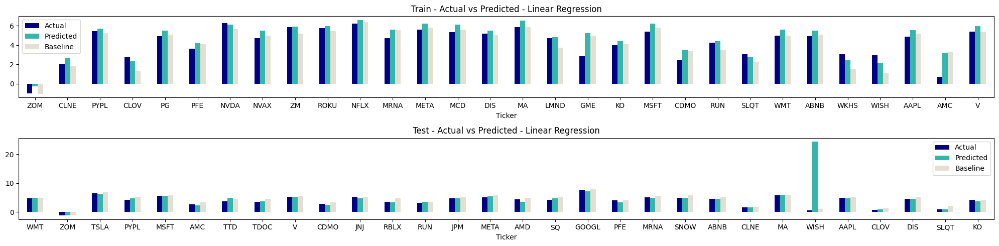

In [181]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

In [182]:
# Ridge 
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)

Ridge()

{'Model': 'Ridge Regression Train', 'MAE': 0.32, 'MSE': 0.18, 'RMSE': 0.42, 'R2 Score': 0.957}
{'Model': 'Ridge Regression Test', 'MAE': 0.68, 'MSE': 3.09, 'RMSE': 1.76, 'R2 Score': 0.0579}


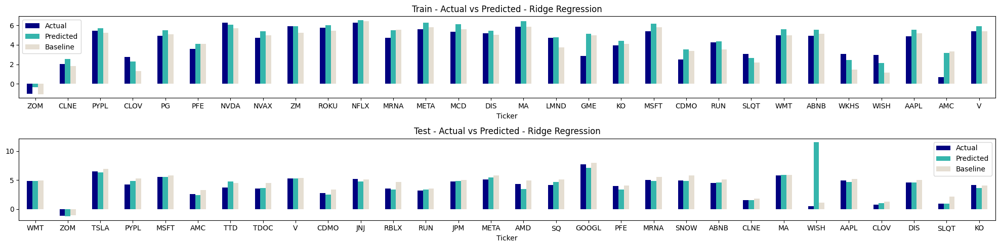

In [183]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


In [184]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

{'Model': 'Lasso Regression Train', 'MAE': 1.41, 'MSE': 4.16, 'RMSE': 2.04, 'R2 Score': -0.0078}
{'Model': 'Lasso Regression Test', 'MAE': 1.12, 'MSE': 3.51, 'RMSE': 1.87, 'R2 Score': -0.0699}


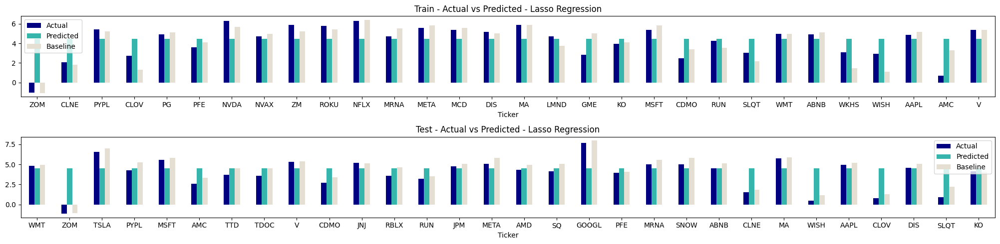

In [185]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


In [186]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.22, 'MSE': 0.11, 'RMSE': 0.34, 'R2 Score': 0.9728}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.36, 'MSE': 0.33, 'RMSE': 0.57, 'R2 Score': 0.9006}


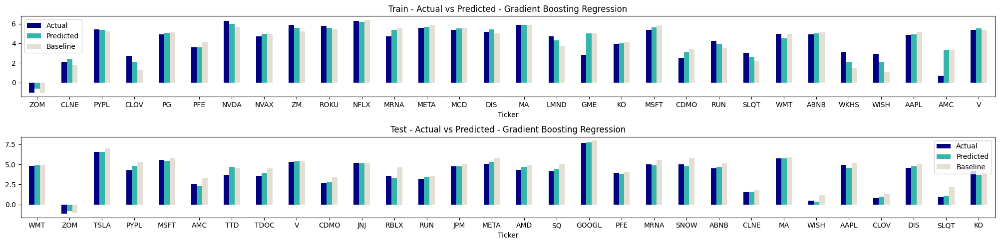

In [187]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

In [188]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

{'Model': 'Elastic Regression Train', 'MAE': 1.4, 'MSE': 4.11, 'RMSE': 2.03, 'R2 Score': 0.0044}
{'Model': 'Elastic Regression Test', 'MAE': 1.11, 'MSE': 3.46, 'RMSE': 1.86, 'R2 Score': -0.0553}


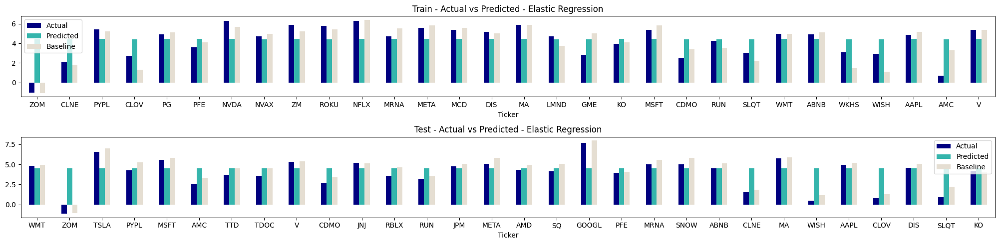

In [189]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


In [190]:
# Random forest regressor 
rf = RandomForestRegressor()
rf.fit(X_train_scaled, y_train)

RandomForestRegressor()

{'Model': 'Random Forest Regression Train', 'MAE': 0.2, 'MSE': 0.12, 'RMSE': 0.35, 'R2 Score': 0.97}
{'Model': 'Random Forest Regression Test', 'MAE': 0.34, 'MSE': 0.47, 'RMSE': 0.69, 'R2 Score': 0.8565}


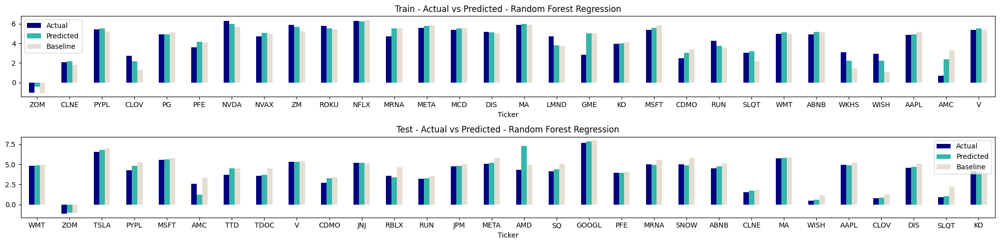

In [191]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


In [192]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor()
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor()

{'Model': 'Decision Tree Regression Train', 'MAE': 0.23, 'MSE': 0.38, 'RMSE': 0.62, 'R2 Score': 0.908}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.34, 'MSE': 0.48, 'RMSE': 0.69, 'R2 Score': 0.855}


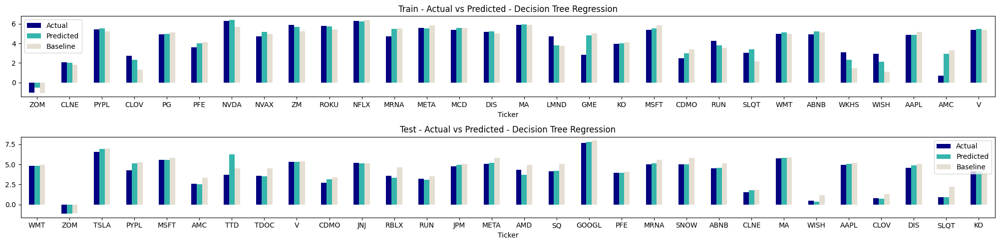

In [193]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

In [194]:
# Support Vector Machine regressor 
svr = SVR()
svr.fit(X_train_scaled, y_train)

SVR()

{'Model': 'SVR Regression Train', 'MAE': 0.25, 'MSE': 0.15, 'RMSE': 0.39, 'R2 Score': 0.9632}
{'Model': 'SVR Regression Test', 'MAE': 0.48, 'MSE': 0.91, 'RMSE': 0.95, 'R2 Score': 0.7236}


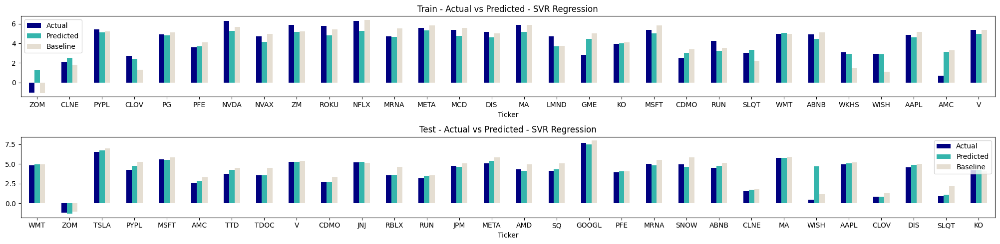

In [195]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [196]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor()
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor()

{'Model': 'AdaBoost Regression Train', 'MAE': 0.42, 'MSE': 0.3, 'RMSE': 0.54, 'R2 Score': 0.9281}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.53, 'MSE': 0.49, 'RMSE': 0.7, 'R2 Score': 0.8494}


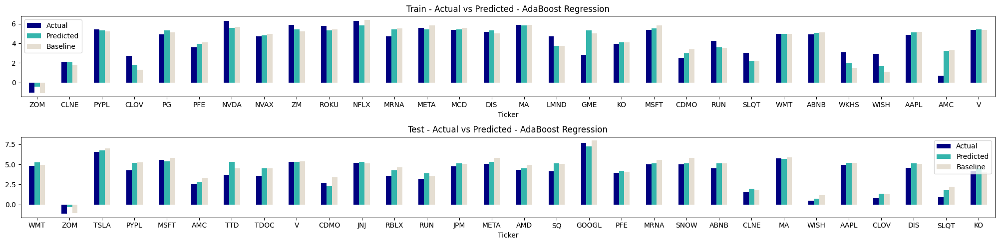

In [197]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

In [198]:
result_row_red = pd.DataFrame(models)
result_row_red


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.32,0.18,0.42,0.96
1,Linear Regression Test,0.95,13.12,3.62,-3.00
2,Ridge Regression Train,0.32,0.18,0.42,0.96
3,Ridge Regression Test,0.68,3.09,1.76,0.06
4,Lasso Regression Train,1.41,4.16,2.04,-0.01
5,Lasso Regression Test,1.12,3.51,1.87,-0.07
6,Gradient Boosting Regression Train,0.22,0.11,0.34,0.97
7,Gradient Boosting Regression Test,0.36,0.33,0.57,0.90
8,Elastic Regression Train,1.40,4.11,2.03,0.00
9,Elastic Regression Test,1.11,3.46,1.86,-0.06


## FINISH

### ROW & DIMENSION REDUCTION

In [199]:
#data row reduction and dim reduction

data_rowdim_red = df_imputed2.copy()

import pandas as pd

# create sample dataframe
df = data_rowdim_red

# filter dataframe with dates between '2022-01-03' and '2022-01-07'
start_date = pd.to_datetime('2021-01-01')
end_date = pd.to_datetime('2022-12-31')
data_rowdim_red = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

data_rowdim_red=data_rowdim_red.drop(columns=["Price Change","Previous Day Price","Day of Week","Quarter", "Day", "Year", "Avg Share Price (Acquired)", "Avg Share Price (disposed) ", "accountsPayables", "addTotalDebt", "Value - T","Market Capitalization","Month","EnvironmentScore","GovernanceScore", "eps","ESGscore","AvgPositiveScore","AvgNegativeScore","IsCovidYear" ])



In [200]:
data_rowdim_red

,Ticker,Industry,Sector,Date,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
52,AAPL,Information Technology,Consumer Electronics,2022-12-30,4.87,18.16,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,22.18,-1556.10,24.25,-1558.71,23.49,28.36,28.40,3.91,8.54,7.63,7.81,3.36,18.75,13.77,4.95,5.13,3.49,13.76,13.91,3.24,2.95,1.86
53,AAPL,Information Technology,Consumer Electronics,2022-12-29,4.86,18.14,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,22.18,-1556.10,24.25,-1558.71,23.49,28.36,28.40,3.91,8.90,7.75,8.37,2.79,18.00,13.24,4.95,4.94,1.99,13.76,13.85,3.24,2.95,1.86
54,AAPL,Information Technology,Consumer Electronics,2022-12-28,4.84,18.26,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,22.18,-1556.10,24.25,-1558.71,23.49,28.36,28.40,3.91,9.14,7.97,8.62,2.75,18.63,14.05,4.53,4.66,1.67,13.76,14.15,3.24,2.95,1.86
55,AAPL,Information Technology,Consumer Electronics,2022-12-27,4.87,18.05,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,22.18,-1556.10,24.25,-1558.71,23.49,28.36,28.40,3.91,8.75,7.73,8.14,2.16,17.98,13.05,4.81,4.88,1.61,16.28,13.84,3.24,3.08,1.86
56,AAPL,Information Technology,Consumer Electronics,2022-12-23,4.88,17.97,24.72,22.64,24.48,25.58,26.39,24.76,25.43,25.65,25.49,24.64,23.38,24.40,24.31,24.12,22.18,-1556.10,24.25,-1558.71,23.49,28.36,28.40,3.91,8.74,7.70,8.13,1.99,18.00,12.99,4.95,4.94,2.08,13.69,13.21,3.24,2.95,1.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63750,ZOM,Health Care,Diagnostics & Research,2021-01-08,-0.90,19.49,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-20.44,-106.59,-138.18,-26.26,20.61,21.06,20.85,4.24,0.51,0.00,0.00,0.29,13.47,9.11,3.62,4.01,0.00,12.30,9.26,3.04,3.04,0.34
63751,ZOM,Health Care,Diagnostics & Research,2021-01-07,-0.97,18.67,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-20.44,-106.59,-138.18,-26.26,20.61,21.06,20.85,4.24,0.51,0.00,0.00,1.10,14.44,9.36,4.87,4.89,2.08,10.81,10.52,3.04,1.90,0.34
63752,ZOM,Health Care,Diagnostics & Research,2021-01-06,-0.96,19.23,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-20.44,-106.59,-138.18,-26.26,20.61,21.06,20.85,4.24,0.51,0.00,0.00,0.51,14.32,9.36,4.62,4.80,0.00,12.30,9.26,3.04,3.04,0.34
63753,ZOM,Health Care,Diagnostics & Research,2021-01-05,-0.94,20.38,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-20.44,-106.59,-138.18,-26.26,20.61,21.06,20.85,4.24,0.51,0.00,0.00,0.00,8.86,8.76,0.10,0.10,0.00,12.30,9.26,3.04,3.04,0.34


In [201]:
import pandas as pd
import category_encoders as ce

# Assuming you have a DataFrame named 'df' with categorical columns 'cat_col1' and 'cat_col2'

df = data_rowdim_red

# Ordinal Encoding
ordinal_encoder = ce.OrdinalEncoder(cols=['Ticker', 'Industry', 'Sector',
       ])
df_ordinal_encoded = ordinal_encoder.fit_transform(df)

# Target Encoding
target_encoder = ce.TargetEncoder(cols=['Ticker', 'Industry', 'Sector'])
df_target_encoded = target_encoder.fit_transform(df, df['Close'])

# Print the encoded DataFrames
print("Ordinal Encoding:")
print(df_ordinal_encoded)
print("\nTarget Encoding:")
print(df_target_encoded)


Ordinal Encoding:
       Ticker  Industry  Sector       Date  Close  Volume  netReceivables  \
52          1         1       1 2022-12-30   4.87   18.16           24.72   
53          1         1       1 2022-12-29   4.86   18.14           24.72   
54          1         1       1 2022-12-28   4.84   18.26           24.72   
55          1         1       1 2022-12-27   4.87   18.05           24.72   
56          1         1       1 2022-12-23   4.88   17.97           24.72   
...       ...       ...     ...        ...    ...     ...             ...   
63750      49         4      39 2021-01-08  -0.90   19.49           12.41   
63751      49         4      39 2021-01-07  -0.97   18.67           12.41   
63752      49         4      39 2021-01-06  -0.96   19.23           12.41   
63753      49         4      39 2021-01-05  -0.94   20.38           12.41   
63754      49         4      39 2021-01-04  -1.02   19.83           12.41   

       inventory  propertyPlantEquipmentNet  totalCurrent

In [202]:
df_target_encoded.corr()

,Ticker,Industry,Sector,Close,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
Ticker,1.00,0.45,0.98,0.96,-0.28,0.62,0.42,0.46,0.50,0.47,0.00,0.48,0.46,0.20,0.22,0.45,0.14,0.31,0.12,-0.33,-0.50,0.19,-0.58,0.27,0.49,0.15,0.02,0.24,0.20,0.22,0.06,0.16,-0.14,0.38,0.41,-0.00,0.12,-0.06,0.17,0.20,-0.00
Industry,0.45,1.00,0.47,0.43,-0.03,0.27,0.05,0.15,0.21,0.22,-0.04,0.21,0.17,0.05,0.15,0.14,0.02,0.10,0.04,-0.04,-0.07,-0.04,-0.15,0.04,0.22,0.00,0.08,0.19,0.27,0.24,0.00,0.08,-0.02,0.16,0.17,0.06,-0.03,-0.03,0.05,0.05,-0.03
Sector,0.98,0.47,1.00,0.94,-0.30,0.59,0.38,0.43,0.46,0.43,0.00,0.46,0.42,0.19,0.22,0.40,0.12,0.30,0.10,-0.32,-0.46,0.18,-0.55,0.22,0.44,0.15,0.01,0.22,0.19,0.20,0.04,0.14,-0.16,0.36,0.40,0.01,0.12,-0.07,0.17,0.20,0.00
Close,0.96,0.43,0.94,1.00,-0.29,0.58,0.40,0.44,0.48,0.44,0.01,0.46,0.44,0.19,0.19,0.42,0.16,0.32,0.13,-0.31,-0.49,0.18,-0.55,0.27,0.52,0.20,-0.02,0.23,0.22,0.24,0.06,0.19,-0.12,0.38,0.42,0.02,0.13,-0.04,0.17,0.21,-0.11
Volume,-0.28,-0.03,-0.30,-0.29,1.00,0.26,0.42,0.44,0.48,0.44,-0.03,0.39,0.46,0.18,0.02,0.43,0.23,0.07,0.19,-0.13,-0.21,0.02,-0.13,0.48,0.43,0.01,-0.21,0.28,0.13,0.24,0.36,0.28,0.40,0.12,0.13,0.04,0.07,0.11,0.18,0.11,0.05
netReceivables,0.62,0.27,0.59,0.58,0.26,1.00,0.80,0.82,0.89,0.90,0.06,0.86,0.88,0.47,0.31,0.79,0.46,0.49,0.41,-0.54,-0.79,0.19,-0.71,0.73,0.82,0.18,-0.02,0.41,0.20,0.26,0.21,0.24,0.07,0.34,0.37,0.04,0.18,0.01,0.31,0.29,0.10
inventory,0.42,0.05,0.38,0.40,0.42,0.80,1.00,0.84,0.87,0.87,0.17,0.83,0.88,0.37,0.22,0.79,0.51,0.48,0.43,-0.46,-0.75,0.18,-0.67,0.76,0.82,0.19,-0.14,0.45,0.14,0.27,0.27,0.30,0.17,0.34,0.36,0.03,0.20,0.02,0.32,0.30,0.10
propertyPlantEquipmentNet,0.46,0.15,0.43,0.44,0.44,0.82,0.84,1.00,0.88,0.92,-0.12,0.92,0.89,0.41,0.28,0.82,0.55,0.48,0.44,-0.49,-0.80,0.16,-0.79,0.77,0.85,0.17,-0.09,0.39,0.16,0.28,0.27,0.27,0.16,0.31,0.33,0.07,0.16,0.01,0.30,0.27,0.08
totalCurrentAssets,0.50,0.21,0.46,0.48,0.48,0.89,0.87,0.88,1.00,0.94,0.10,0.87,0.96,0.41,0.26,0.88,0.47,0.47,0.42,-0.52,-0.80,0.18,-0.73,0.83,0.90,0.16,-0.11,0.45,0.16,0.29,0.32,0.33,0.20,0.33,0.37,0.05,0.19,0.05,0.32,0.30,0.08
totalLiabilities,0.47,0.22,0.43,0.44,0.44,0.90,0.87,0.92,0.94,1.00,-0.06,0.96,0.95,0.43,0.26,0.82,0.47,0.42,0.40,-0.50,-0.79,0.08,-0.69,0.78,0.86,0.16,-0.05,0.44,0.21,0.32,0.26,0.29,0.15,0.34,0.36,0.05,0.16,0.01,0.34,0.31,0.10


In [203]:
#split based on data reduction

from sklearn.model_selection import train_test_split
X = df_target_encoded.drop(columns=["Close"])
y = df_target_encoded["Close"]

# Sort the data by date
sorted_df = df_target_encoded.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2022-06-30'
test_start_date = '2022-07-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [204]:
X_test

,Ticker,Industry,Sector,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
59781,4.94,4.33,4.94,2022-07-01,15.58,22.74,24.82,25.46,25.16,25.81,25.07,24.90,25.33,25.75,24.33,24.13,23.01,22.65,22.36,-1256.76,-1154.30,23.29,-1581.16,21.73,26.62,26.75,3.91,1.90,1.10,1.67,0.51,10.69,7.86,4.60,4.62,2.08,14.19,10.60,2.94,3.32,2.14
63378,-0.78,3.33,-0.78,2022-07-01,16.96,14.40,14.69,15.96,18.66,16.42,19.41,14.31,15.78,15.38,15.09,16.13,-151.63,-187.50,-170.94,-70.20,-102.66,-140.44,-83.16,20.70,19.15,18.91,4.27,0.51,0.00,0.29,3.14,17.46,12.94,4.51,4.67,2.83,16.74,13.06,3.90,4.11,2.14
53405,6.45,4.51,6.45,2022-07-01,17.03,21.51,23.06,24.27,24.31,24.23,24.41,22.49,23.93,23.79,22.41,21.25,22.25,22.03,21.91,-577.90,-1524.63,22.35,-1217.12,21.87,27.45,27.43,4.00,7.57,6.86,6.60,1.10,17.07,10.30,6.67,6.81,1.39,15.00,10.91,3.81,4.31,2.14
43688,5.04,5.19,5.11,2022-07-01,16.09,24.45,22.23,21.30,24.73,24.75,23.73,23.09,24.49,22.65,21.97,21.56,21.41,20.83,21.01,-280.20,-461.04,21.39,-566.71,20.87,25.32,25.36,4.32,7.57,6.86,6.60,0.00,11.28,6.98,4.30,4.30,0.00,11.30,7.68,3.32,1.00,2.14
32972,5.60,5.19,4.95,2022-07-01,16.94,24.17,22.17,25.23,25.80,25.95,25.88,24.82,25.19,24.64,24.27,23.30,23.94,23.79,23.59,23.19,-1665.63,23.87,-1845.25,22.73,28.18,28.20,4.02,0.51,0.51,0.69,2.27,17.04,11.87,4.87,5.33,1.99,13.62,12.04,3.51,3.49,2.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27837,5.85,5.19,5.11,2022-12-30,14.30,21.95,22.22,22.11,23.53,24.20,22.57,23.36,23.37,22.48,22.48,21.69,21.95,21.88,21.65,-537.17,-779.15,21.85,-697.27,20.68,26.53,26.55,4.36,5.33,3.14,5.11,0.00,14.64,8.75,5.89,5.89,0.00,13.25,8.75,4.50,4.50,1.86
54590,4.71,4.93,4.71,2022-12-30,14.95,21.58,20.22,19.79,22.07,21.54,21.47,19.38,21.43,20.01,19.83,19.78,18.76,18.42,18.08,-681.60,-88.79,18.97,-370.01,20.01,23.81,23.78,4.36,0.51,6.86,6.06,1.79,14.37,12.43,3.23,3.95,1.39,11.08,12.97,0.56,2.75,1.86
29148,5.50,4.51,5.50,2022-12-30,14.36,21.47,17.77,24.32,22.41,24.76,-1817.46,24.61,22.06,22.50,21.95,20.51,21.74,21.68,21.37,-658.08,-1035.86,21.51,-808.71,20.41,25.99,26.20,4.36,5.86,5.16,4.75,0.00,12.02,4.53,1.72,1.73,0.00,10.66,10.03,0.63,0.63,1.86
19416,5.14,3.33,5.14,2022-12-30,15.25,23.68,23.25,23.71,24.74,25.43,25.06,24.40,24.75,23.89,23.49,22.99,22.75,22.56,22.22,19.52,-1434.84,22.40,-1166.43,21.68,26.86,26.91,4.04,5.69,5.06,4.36,1.39,14.79,9.60,4.90,5.19,0.69,14.08,9.60,4.28,4.50,1.86


In [205]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(X_train['Date'])) 
X_test['Date'] = pd.to_numeric(pd.to_datetime(X_test['Date'])) 


Dimensionality Reduction 

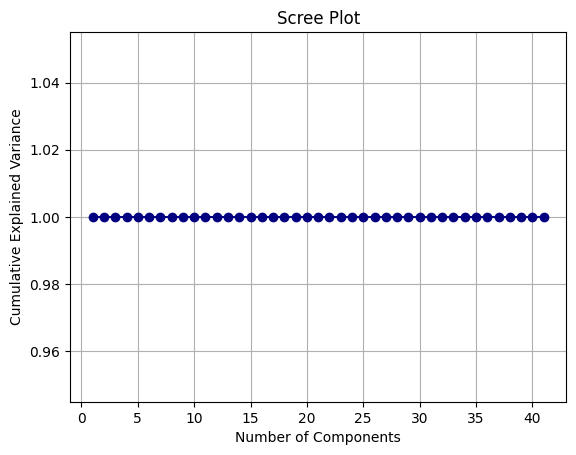

In [206]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' is your input data

# Perform PCA
pca = PCA()
pca.fit(X_train)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot the scree plot
plt.plot(np.arange(1, len(explained_variance_ratio) + 1), np.cumsum(explained_variance_ratio), marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)
plt.show()


If your screeplot appears as a straight line, it suggests that all the principal components are explaining an equal amount of variance in the data. This can happen when the dataset doesn't exhibit clear dominant patterns or when the variables have a high degree of multicollinearity.

In such cases, it becomes more challenging to determine the optimal number of principal components to retain. One approach is to consider retaining a subset of the principal components that capture a significant amount of variance, such as those above a certain threshold (e.g., components with eigenvalues greater than 1).

However, it's important to note that PCA may not be the most suitable technique for dimensionality reduction in cases where the screeplot is a straight line. In such situations, you could explore other dimensionality reduction techniques, such as feature selection methods or nonlinear dimensionality reduction methods like t-SNE or UMAP, which may better capture the underlying structure of the data.

In [207]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest classifier
rf_regressor = RandomForestRegressor()

# Fit the model to the training data
rf_regressor.fit(X_train, y_train)

# Get feature importances
importances = rf_regressor.feature_importances_

# Create a DataFrame to store feature importances
feature_importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})

# Sort the DataFrame by importance values in descending order
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances)


                         Feature  Importance
0                         Ticker        0.69
2                         Sector        0.06
4                         Volume        0.06
13                       revenue        0.06
23                numberOfShares        0.04
25               enterpriseValue        0.03
24          marketCapitalization        0.02
3                           Date        0.01
20                 dividendsPaid        0.00
26                   SocialScore        0.00
8             totalCurrentAssets        0.00
11                     totalDebt        0.00
10                   totalEquity        0.00
16                        ebitda        0.00
6                      inventory        0.00
22            capitalExpenditure        0.00
12       totalCurrentLiabilities        0.00
29           TotNegativeMentions        0.00
17               operatingIncome        0.00
9               totalLiabilities        0.00
15             operatingExpenses        0.00
1         

In [208]:
from sklearn.decomposition import PCA

# Perform PCA with 50 components
pca = PCA(n_components=15)
X_pca = pca.fit_transform(X_train)

# Retrieve the loadings
loadings = pca.components_

# Associate loadings with feature names
feature_names = X_train.columns  # Assuming X is a DataFrame
loadings_with_names = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(15)], index=feature_names)


In [209]:
loadings_with_names

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15
Ticker,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.01,-0.01,-0.01,-0.11,0.14,-0.12,0.41
Industry,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.05,0.01,-0.08,0.09
Sector,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.01,-0.01,-0.01,-0.10,0.15,-0.12,0.44
Date,-1.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00
Volume,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.01,0.00,-0.02,-0.12,-0.23,-0.01,-0.34
netReceivables,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.01,-0.08,-0.22,0.02,-0.31,0.17
inventory,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00,-0.04,-0.22,-0.08,-0.17,-0.11
propertyPlantEquipmentNet,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.01,-0.00,-0.03,-0.18,-0.07,-0.18,-0.05
totalCurrentAssets,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.04,-0.17,-0.08,-0.15,-0.07
totalLiabilities,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.01,-0.00,-0.04,-0.22,-0.05,-0.25,0.01


In [210]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [211]:
X_train

,Ticker,Industry,Sector,Date,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,accountsReceivables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,enterpriseValue,SocialScore,No of mentions,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),min price (Acquired),Max Price (Acquired),InflationRate
63754,-0.78,3.33,-0.78,1609718400000000000,19.83,12.41,12.64,14.26,19.45,14.89,19.44,14.41,14.49,9.56,9.04,15.17,-157.85,-157.03,-159.23,-20.44,-106.59,-138.18,-26.26,20.61,21.06,20.85,4.24,0.51,0.00,0.00,0.00,8.86,8.76,0.10,0.10,0.00,12.30,9.26,3.04,3.04,0.34
11608,2.03,2.03,2.03,1609718400000000000,15.61,18.31,17.13,19.58,19.44,19.15,20.05,18.32,18.27,18.16,16.52,16.88,15.62,-185.99,-192.82,15.56,-106.59,15.00,-149.30,19.11,21.73,21.72,4.06,0.51,6.86,6.06,1.10,15.06,12.76,2.28,2.31,1.39,16.37,12.70,0.31,5.39,0.34
44064,5.04,5.19,5.11,1609718400000000000,15.91,24.39,22.34,21.31,24.70,24.69,23.69,22.91,24.45,22.52,21.81,21.35,20.93,20.76,20.82,-459.47,-925.99,21.29,-604.59,20.88,26.38,26.39,4.34,7.57,6.86,6.60,0.29,11.65,10.31,4.89,4.89,1.10,14.07,10.91,3.80,4.87,0.34
12919,1.47,3.33,1.73,1609718400000000000,16.86,17.72,17.18,16.03,20.51,19.44,20.19,17.84,18.97,19.12,-241.63,18.47,-322.11,-491.99,-364.47,-325.54,-106.59,-452.85,-46.26,19.75,21.77,21.64,4.12,0.51,0.51,1.54,1.95,14.77,9.30,4.84,4.94,1.95,18.84,17.85,2.30,2.30,0.34
42753,4.96,4.33,4.96,1609718400000000000,15.94,22.30,22.52,23.77,23.84,24.97,24.56,24.12,24.19,23.62,22.94,22.41,22.27,22.05,21.91,-521.71,-1262.23,22.13,-868.90,21.62,26.53,26.59,4.50,7.57,6.86,6.60,1.67,13.79,11.98,5.12,5.14,2.91,14.52,10.81,4.22,5.57,0.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18656,1.99,3.33,1.73,1656460800000000000,14.32,15.41,16.79,15.31,19.26,17.92,19.58,15.39,17.83,18.55,18.28,18.49,-261.32,-272.30,-269.98,11.98,-102.66,-185.61,-111.23,19.13,20.64,20.59,4.19,0.00,0.00,0.00,1.79,14.29,10.83,4.81,4.82,2.23,10.14,10.33,0.58,0.58,2.20
56029,4.34,5.38,5.11,1656460800000000000,16.09,17.74,17.20,18.66,20.54,20.87,20.44,20.68,19.25,19.25,19.25,19.38,-289.17,-317.83,-310.28,19.16,-106.59,-377.14,-192.38,18.24,21.70,21.76,3.98,0.51,6.86,6.06,2.48,14.08,10.31,3.70,3.97,1.39,10.01,10.31,-0.80,0.16,2.20
7305,0.40,3.33,0.40,1656460800000000000,11.80,16.89,16.20,15.66,17.91,18.33,17.65,16.72,17.98,17.13,16.51,16.90,-249.09,-261.65,-260.61,15.59,-106.59,-192.15,-127.30,20.39,23.02,23.02,4.17,0.51,0.00,0.00,0.00,12.60,10.79,1.81,1.81,1.61,13.13,10.96,1.77,1.92,2.20
57906,1.25,4.51,1.25,1656460800000000000,16.34,16.30,13.58,16.99,20.72,19.66,20.34,16.38,19.62,18.71,17.55,18.71,-443.10,-449.79,-448.14,-225.72,-102.66,-406.15,-127.30,20.32,20.79,19.77,4.36,0.51,0.51,0.29,1.85,15.92,11.61,4.42,4.44,3.01,14.56,13.43,3.67,3.79,2.20


In [212]:
def evaluation(y, predictions):
    """calculate different metrics"""
    mae = mean_absolute_error(y, predictions)
    mse = mean_squared_error(y, predictions)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    r_squared = r2_score(y, predictions)
    return mae, mse, rmse, r_squared

In [213]:
import matplotlib.pyplot as plt

data = {
    "Ticker": ["AAPL", "ABNB", "AMC", "AMD", "AMZN", "APPN", "AYTU", "BRK.A", "CDMO", "CLNE",
               "CLOV", "COIN", "DIS", "FB", "GME", "GOOGL", "HIMS", "JNJ", "JPM", "KO",
               "LMND", "MA", "MCD", "META", "MRNA", "MSFT", "NFLX", "NVAX", "NVDA", "PFE",
               "PG", "PYPL", "RBLX", "ROKU", "RUN", "SLQT", "SNOW", "SPCE", "SQ", "TDOC",
               "TSLA", "TTD", "UPST", "V", "WISH", "WKHS", "WMT", "XAIR", "ZM", "ZOM"],
    "Close": [5.18, 5.11, 3.30, 4.97, 4.59, 4.18, 0.30, 13.02, 3.37, 1.81,
1.31, 5.53, 5.04, 5.03, 5.00, 7.97, 1.88, 5.14, 5.06, 4.08,
3.74, 5.88, 5.59, 5.82, 5.54, 5.82, 6.40, 4.96, 5.68, 4.08,
5.10, 5.24, 4.64, 5.43, 3.54, 2.20, 5.83, 2.59, 5.08, 4.52,
6.96, 4.52, 5.02, 5.38, 1.13, 1.47, 4.97, 2.24, 5.21, -1.06]
}


df = pd.DataFrame(data)

In [214]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_model_result(model, model_name, x_train=X_train_scaled, x_test=X_test_scaled,
                     y_train=y_train, y_test=y_test, cv=5, param_grid=None):
    
    if param_grid is not None:
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=cv)
        grid_search.fit(x_train, y_train)
        model = grid_search.best_estimator_
        
    train_pred = cross_val_predict(model, x_train, y_train, cv=cv)
    test_pred = model.predict(x_test)

    train_mae = mean_absolute_error(y_train, train_pred)
    train_mse = mean_squared_error(y_train, train_pred)
    train_rmse = np.sqrt(train_mse)
    train_r_squared = r2_score(y_train, train_pred)

    test_mae = mean_absolute_error(y_test, test_pred)
    test_mse = mean_squared_error(y_test, test_pred)
    test_rmse = np.sqrt(test_mse)
    test_r_squared = r2_score(y_test, test_pred)

    train_result = {
        "Model": f"{model_name} Train",
        "MAE": round(train_mae, 2),
        "MSE": round(train_mse, 2),
        "RMSE": round(train_rmse, 2),
        "R2 Score": round(train_r_squared, 4)
    }
    print(train_result)

    test_result = {
        "Model": f"{model_name} Test",
        "MAE": round(test_mae, 2),
        "MSE": round(test_mse, 2),
        "RMSE": round(test_rmse, 2),
        "R2 Score": round(test_r_squared, 4)
    }
    print(test_result)


    tickers_table = df_imputed["Ticker"]

    rf_df_tmp_train = pd.DataFrame({"Actual": y_train[:30], "Predicted": train_pred[:30]})
    rf_df_tmp_test = pd.DataFrame({"Actual": y_test[:30], "Predicted": test_pred[:30]})

    # Merge on index
    rf_df_tmp_train = rf_df_tmp_train.merge(tickers_table, left_index=True, right_index=True)
    rf_df_tmp_test = rf_df_tmp_test.merge(tickers_table, left_index=True, right_index=True)

    # Set Ticker column as the index
    rf_df_tmp_train.set_index("Ticker", inplace=True)
    rf_df_tmp_test.set_index("Ticker", inplace=True)

    # Add "Close" data to the dataframes
    rf_df_tmp_train["Close"] = df.set_index("Ticker")["Close"]
    rf_df_tmp_test["Close"] = df.set_index("Ticker")["Close"]

    # Plot the dataframes
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10))

    rf_df_tmp_train.plot(ax=ax1, figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax1.legend(["Actual", "Predicted", "Baseline"])
    ax1.set_xticklabels(rf_df_tmp_train.index)

    rf_df_tmp_test.plot(ax=ax2, figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - {model_name}", color=custom_palette_bar)
    ax2.legend(["Actual", "Predicted", "Baseline"])
    ax2.set_xticklabels(rf_df_tmp_test.index)

    plt.tight_layout()
    plt.show()



    return train_result, test_result





In [217]:
models = []

In [218]:
# Linear Regression
lin_reg = LinearRegression()
lin_reg.fit(X_train_scaled, y_train)

LinearRegression()

{'Model': 'Linear Regression Train', 'MAE': 0.36, 'MSE': 0.21, 'RMSE': 0.46, 'R2 Score': 0.948}
{'Model': 'Linear Regression Test', 'MAE': 0.69, 'MSE': 2.8, 'RMSE': 1.67, 'R2 Score': 0.1473}


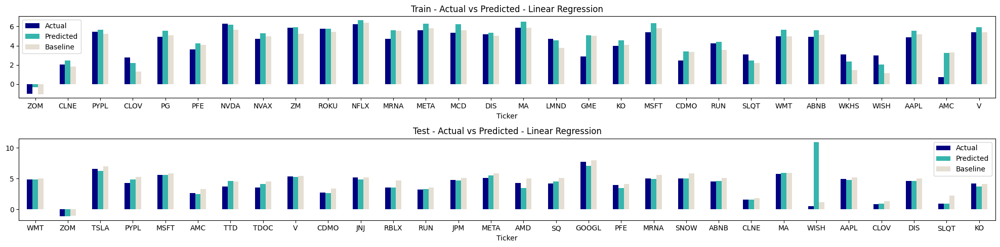

In [219]:
lin_train_result, lin_test_result = get_model_result(model=lin_reg, model_name="Linear Regression")
models.append(lin_train_result)
models.append(lin_test_result)

In [220]:
# Ridge 
ridge = Ridge()
ridge.fit(X_train_scaled, y_train)

Ridge()

{'Model': 'Ridge Regression Train', 'MAE': 0.36, 'MSE': 0.22, 'RMSE': 0.46, 'R2 Score': 0.9478}
{'Model': 'Ridge Regression Test', 'MAE': 0.54, 'MSE': 0.62, 'RMSE': 0.79, 'R2 Score': 0.8113}


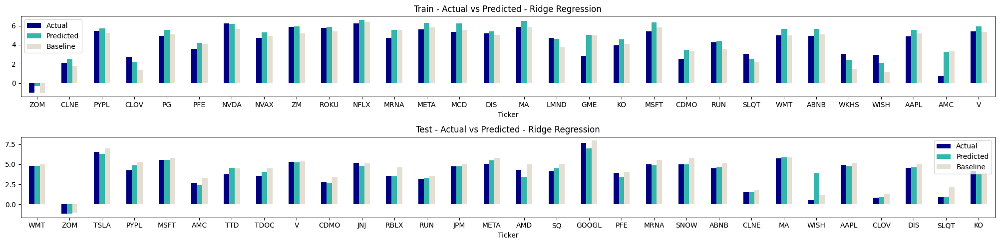

In [221]:
ridge_train_result, ridge_test_result = get_model_result(model=ridge, model_name="Ridge Regression")
models.append(ridge_train_result)
models.append(ridge_test_result)


In [222]:
#Lasso algorithm
lasso = Lasso()
lasso.fit(X_train_scaled, y_train)

Lasso()

{'Model': 'Lasso Regression Train', 'MAE': 1.41, 'MSE': 4.16, 'RMSE': 2.04, 'R2 Score': -0.0078}
{'Model': 'Lasso Regression Test', 'MAE': 1.12, 'MSE': 3.51, 'RMSE': 1.87, 'R2 Score': -0.0699}


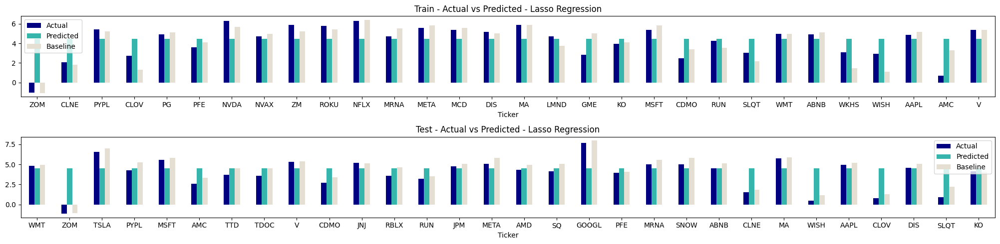

In [223]:
lasso_train_result, lasso_test_result = get_model_result(model=lasso, model_name="Lasso Regression")
models.append(lasso_train_result)
models.append(lasso_test_result)


In [224]:
#Gradient Boosting Regressor 
gbr = GradientBoostingRegressor()
gbr.fit(X_train_scaled, y_train)

GradientBoostingRegressor()

{'Model': 'Gradient Boosting Regression Train', 'MAE': 0.21, 'MSE': 0.11, 'RMSE': 0.33, 'R2 Score': 0.9733}
{'Model': 'Gradient Boosting Regression Test', 'MAE': 0.39, 'MSE': 0.4, 'RMSE': 0.63, 'R2 Score': 0.8776}


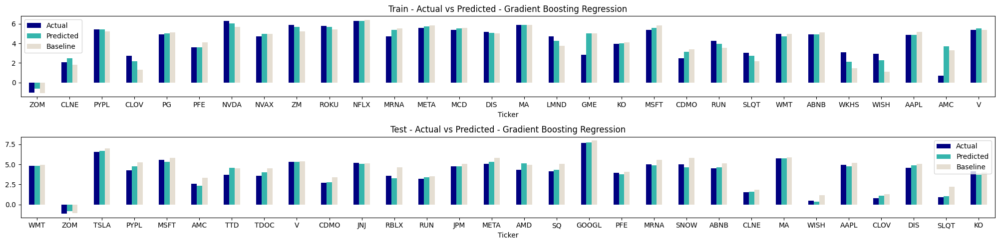

In [225]:
gbr_train_result, gbr_test_result = get_model_result(model=gbr, model_name="Gradient Boosting Regression")
models.append(gbr_train_result)
models.append(gbr_test_result)

In [226]:
# Elastic net regresor 
elastic = ElasticNet()
elastic.fit(X_train_scaled, y_train)

ElasticNet()

{'Model': 'Elastic Regression Train', 'MAE': 1.41, 'MSE': 4.16, 'RMSE': 2.04, 'R2 Score': -0.0078}
{'Model': 'Elastic Regression Test', 'MAE': 1.12, 'MSE': 3.51, 'RMSE': 1.87, 'R2 Score': -0.0699}


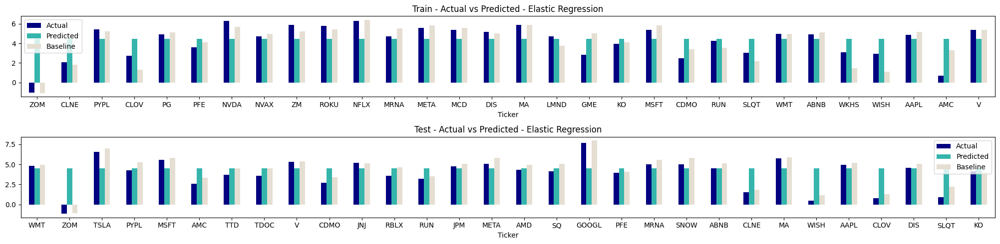

In [227]:
elastic_train_result, elastic_test_result = get_model_result(model=elastic, model_name="Elastic Regression")
models.append(elastic_train_result)
models.append(elastic_test_result)


In [228]:
# Random forest regressor 
rf = RandomForestRegressor()
rf.fit(X_train_scaled, y_train)

RandomForestRegressor()

{'Model': 'Random Forest Regression Train', 'MAE': 0.19, 'MSE': 0.1, 'RMSE': 0.32, 'R2 Score': 0.9754}
{'Model': 'Random Forest Regression Test', 'MAE': 0.31, 'MSE': 0.42, 'RMSE': 0.65, 'R2 Score': 0.8715}


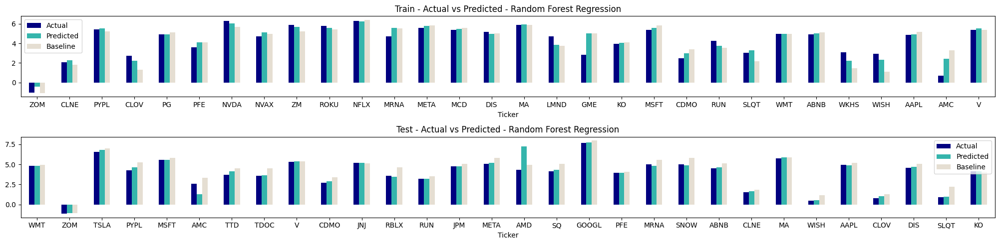

In [229]:
rf_train_result, rf_test_result = get_model_result(model=rf, model_name="Random Forest Regression")
models.append(rf_train_result)
models.append(rf_test_result)


In [230]:
# Decision Tree Regressor 
dtr = DecisionTreeRegressor()
dtr.fit(X_train_scaled, y_train)

DecisionTreeRegressor()

{'Model': 'Decision Tree Regression Train', 'MAE': 0.2, 'MSE': 0.11, 'RMSE': 0.34, 'R2 Score': 0.9725}
{'Model': 'Decision Tree Regression Test', 'MAE': 0.56, 'MSE': 3.11, 'RMSE': 1.76, 'R2 Score': 0.0505}


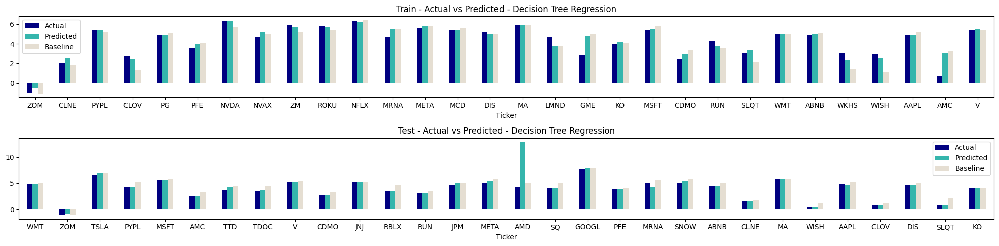

In [231]:
dtr_train_result, dtr_test_result = get_model_result(model=dtr, model_name="Decision Tree Regression")
models.append(dtr_train_result)
models.append(dtr_test_result)

In [232]:
 # Ada Boost Regressor 
ada = AdaBoostRegressor()
ada.fit(X_train_scaled, y_train)

AdaBoostRegressor()

{'Model': 'AdaBoost Regression Train', 'MAE': 0.39, 'MSE': 0.27, 'RMSE': 0.52, 'R2 Score': 0.9355}
{'Model': 'AdaBoost Regression Test', 'MAE': 0.5, 'MSE': 0.48, 'RMSE': 0.69, 'R2 Score': 0.8551}


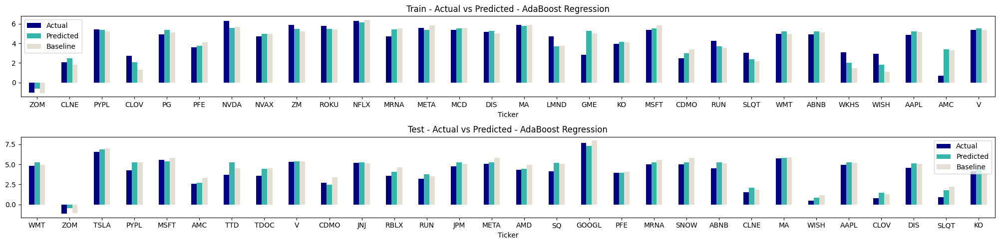

In [233]:
ada_train_result, ada_test_result = get_model_result(model=ada, model_name="AdaBoost Regression")
models.append(ada_train_result)
models.append(ada_test_result)

In [234]:
# Support Vector Machine regressor 
svr = SVR()
svr.fit(X_train_scaled, y_train)

SVR()

{'Model': 'SVR Regression Train', 'MAE': 0.25, 'MSE': 0.17, 'RMSE': 0.41, 'R2 Score': 0.9598}
{'Model': 'SVR Regression Test', 'MAE': 0.47, 'MSE': 0.88, 'RMSE': 0.94, 'R2 Score': 0.7304}


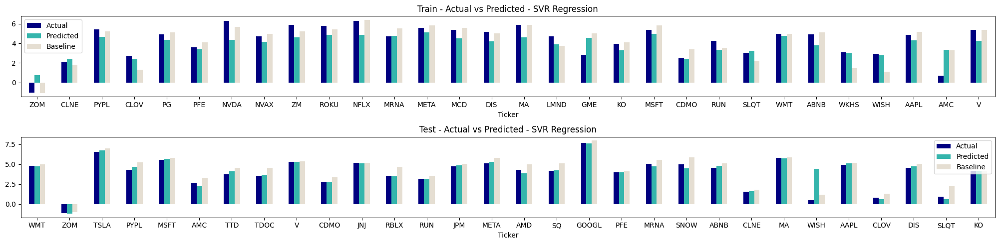

In [235]:
svr_train_result, svr_test_result = get_model_result(model=svr, model_name="SVR Regression")
models.append(svr_train_result)
models.append(svr_test_result)


In [236]:
result_rowdim_red = pd.DataFrame(models)
result_rowdim_red


,Model,MAE,MSE,RMSE,R2 Score
0,Linear Regression Train,0.36,0.21,0.46,0.95
1,Linear Regression Test,0.69,2.80,1.67,0.15
2,Ridge Regression Train,0.36,0.22,0.46,0.95
3,Ridge Regression Test,0.54,0.62,0.79,0.81
4,Lasso Regression Train,1.41,4.16,2.04,-0.01
5,Lasso Regression Test,1.12,3.51,1.87,-0.07
6,Gradient Boosting Regression Train,0.21,0.11,0.33,0.97
7,Gradient Boosting Regression Test,0.39,0.40,0.63,0.88
8,Elastic Regression Train,1.41,4.16,2.04,-0.01
9,Elastic Regression Test,1.12,3.51,1.87,-0.07


## FINISH

In [ ]:
result_row_red

In [ ]:
result_col_red

In [ ]:
result_rowdim_red

result_col_red - columns reduction
result_col_red_b - column reduction
result_row_red - for rows that we have data available for 2021&2022
result_row_red_cv - with cross validation 
result_row_red_hp - with hyperparameter tuning
result_rowdim_red_cv - reduction of rows 
result_row_red_rs - random split 

### ROW REDUCTION

In [239]:
#data row reduction

data_row_red = df_imputed2.copy()

import pandas as pd

# create sample dataframe
df = data_row_red

# filter dataframe with dates between '2022-01-03' and '2022-01-07'
start_date = pd.to_datetime('2021-01-01')
end_date = pd.to_datetime('2022-12-31')
data_row_red = df.loc[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

data_row_red=data_row_red.drop(columns=["Price Change","Previous Day Price"])



In [240]:
import pandas as pd
import category_encoders as ce

# Assuming you have a DataFrame named 'df' with categorical columns 'cat_col1' and 'cat_col2'

df = data_row_red

# Ordinal Encoding
ordinal_encoder = ce.OrdinalEncoder(cols=['Ticker', 'Market Capitalization', 'Industry', 'Sector',
        'Month', 'Day of Week', 'IsCovidYear'])
df_ordinal_encoded = ordinal_encoder.fit_transform(df)

# Target Encoding
target_encoder = ce.TargetEncoder(cols=['Ticker', 'Market Capitalization', 'Industry', 'Sector',
    'Month', 'Day of Week','IsCovidYear'])
df_target_encoded = target_encoder.fit_transform(df, df['Close'])

# Print the encoded DataFrames
print("Ordinal Encoding:")
print(df_ordinal_encoded)
print("\nTarget Encoding:")
print(df_target_encoded)


Ordinal Encoding:
       Ticker  Market Capitalization  Industry  Sector  IsCovidYear  \
52          1                      1         1       1            1   
53          1                      1         1       1            1   
54          1                      1         1       1            1   
55          1                      1         1       1            1   
56          1                      1         1       1            1   
...       ...                    ...       ...     ...          ...   
63750      49                      2         4      39            1   
63751      49                      2         4      39            1   
63752      49                      2         4      39            1   
63753      49                      2         4      39            1   
63754      49                      2         4      39            1   

            Date  Month  Day of Week  Close  Volume  netReceivables  \
52    2022-12-30      1            1   4.87   18.16       

In [241]:
#split based on data reduction

from sklearn.model_selection import train_test_split
X = df_target_encoded.drop(columns=["Close"])
y = df_target_encoded["Close"]

# Sort the data by date
sorted_df = df_target_encoded.sort_values('Date')

# Define the date-based split criterion
train_end_date = '2022-06-30'
test_start_date = '2022-07-01'

# Split the data into train and test sets based on the date criterion
X_train = sorted_df[sorted_df['Date'] < train_end_date].drop(columns=["Close"])
X_test = sorted_df[sorted_df['Date'] >= test_start_date].drop(columns=["Close"])
y_train = sorted_df[sorted_df['Date'] < train_end_date]['Close']
y_test = sorted_df[sorted_df['Date'] >= test_start_date]['Close']


In [242]:
X_test

,Ticker,Market Capitalization,Industry,Sector,IsCovidYear,Date,Month,Day of Week,Volume,netReceivables,inventory,propertyPlantEquipmentNet,totalCurrentAssets,totalLiabilities,totalEquity,totalDebt,totalCurrentLiabilities,revenue,grossProfit,operatingExpenses,ebitda,operatingIncome,netIncome,eps,accountsReceivables,accountsPayables,dividendsPaid,operatingCashFlow,capitalExpenditure,numberOfShares,marketCapitalization,addTotalDebt,enterpriseValue,EnvironmentScore,SocialScore,GovernanceScore,ESGscore,No of mentions,AvgPositiveScore,AvgNegativeScore,TotPositiveMentions,TotNegativeMentions,Count transaction (disposed),Total Amount (disposed),No of shares (disposed),Avg Share Price (disposed),Min price (disposed),Max Price (disposed),Count Acquired,Total Amount(Acquired),No of Shares(Acquired),Avg Share Price (Acquired),min price (Acquired),Max Price (Acquired),InflationRate,Value - T,Year,Quarter,Day
59781,4.94,5.20,4.33,4.94,4.35,2022-07-01,4.34,4.35,15.58,22.74,24.82,25.46,25.16,25.81,25.07,24.90,25.33,25.75,24.33,24.13,23.01,22.65,22.36,0.63,-1256.76,20.89,-1154.30,23.29,-1581.16,21.73,26.62,24.90,26.75,4.24,3.91,4.17,4.11,1.90,-1.02,-0.88,1.10,1.67,0.51,10.69,7.86,4.60,4.60,4.62,2.08,14.19,10.60,3.08,2.94,3.32,2.14,3.24,7.61,1.10,0.00
63378,-0.78,2.93,3.33,-0.78,4.35,2022-07-01,4.34,4.35,16.96,14.40,14.69,15.96,18.66,16.42,19.41,14.31,15.78,15.38,15.09,16.13,-151.63,-187.50,-170.94,-0.17,-70.20,14.82,-102.66,-140.44,-83.16,20.70,19.15,14.31,18.91,4.00,4.27,4.28,4.19,0.51,-0.77,-0.97,0.00,0.29,3.14,17.46,12.94,4.60,4.51,4.67,2.83,16.74,13.06,3.76,3.90,4.11,2.14,3.24,7.61,1.10,0.00
53405,6.45,5.20,4.51,6.45,4.35,2022-07-01,4.34,4.35,17.03,21.51,23.06,24.27,24.31,24.23,24.41,22.49,23.93,23.79,22.41,21.25,22.25,22.03,21.91,0.05,-577.90,20.48,-1524.63,22.35,-1217.12,21.87,27.45,22.49,27.43,4.25,4.00,4.16,4.14,7.57,-0.72,-0.96,6.86,6.60,1.10,17.07,10.30,6.73,6.67,6.81,1.39,15.00,10.91,4.10,3.81,4.31,2.14,3.24,7.61,1.10,0.00
43688,5.04,5.20,5.19,5.11,4.35,2022-07-01,4.34,4.35,16.09,24.45,22.23,21.30,24.73,24.75,23.73,23.09,24.49,22.65,21.97,21.56,21.41,20.83,21.01,0.14,-280.20,-303.66,-461.04,21.39,-566.71,20.87,25.32,23.09,25.36,3.88,4.32,4.09,4.11,7.57,-0.72,-0.96,6.86,6.60,0.00,11.28,6.98,4.30,4.30,4.30,0.00,11.30,7.68,0.98,3.32,1.00,2.14,3.24,7.61,1.10,0.00
32972,5.60,5.20,5.19,4.95,4.35,2022-07-01,4.34,4.35,16.94,24.17,22.17,25.23,25.80,25.95,25.88,24.82,25.19,24.64,24.27,23.30,23.94,23.79,23.59,0.85,23.19,-1161.51,-1665.63,23.87,-1845.25,22.73,28.18,24.82,28.20,4.13,4.02,4.03,4.06,0.51,-0.93,-0.86,0.51,0.69,2.27,17.04,11.87,5.26,4.87,5.33,1.99,13.62,12.04,2.82,3.51,3.49,2.14,3.24,7.61,1.10,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27837,5.85,5.20,5.19,5.11,4.35,2022-12-30,4.21,4.35,14.30,21.95,22.22,22.11,23.53,24.20,22.57,23.36,23.37,22.48,22.48,21.69,21.95,21.88,21.65,0.97,-537.17,19.45,-779.15,21.85,-697.27,20.68,26.53,23.36,26.55,4.45,4.36,4.25,4.36,5.33,-0.93,-0.97,3.14,5.11,0.00,14.64,8.75,5.89,5.89,5.89,0.00,13.25,8.75,4.50,4.50,4.50,1.86,3.26,7.61,1.39,3.40
54590,4.71,2.93,4.93,4.71,4.35,2022-12-30,4.21,4.35,14.95,21.58,20.22,19.79,22.07,21.54,21.47,19.38,21.43,20.01,19.83,19.78,18.76,18.42,18.08,-1.24,-681.60,19.36,-88.79,18.97,-370.01,20.01,23.81,19.38,23.78,4.45,4.36,4.25,4.36,0.51,-0.72,-0.95,6.86,6.06,1.79,14.37,12.43,3.32,3.23,3.95,1.39,11.08,12.97,0.96,0.56,2.75,1.86,3.26,7.61,1.39,3.40
29148,5.50,5.20,4.51,5.50,4.35,2022-12-30,4.21,4.35,14.36,21.47,17.77,24.32,22.41,24.76,-1817.46,24.61,22.06,22.50,21.95,20.51,21.74,21.68,21.37,0.96,-658.08,20.48,-1035.86,21.51,-808.71,20.41,25.99,24.61,26.20,4.45,4.36,4.25,4.36,5.86,-0.51,-0.93,5.16,4.75,0.00,12.02,4.53,1.72,1.72,1.73,0.00,10.66,10.03,0.63,0.63,0.63,1.86,3.26,7.61,1.39,3.40
19416,5.14,5.20,3.33,5.14,4.35,2022-12-30,4.21,4.35,15.25,23.68,23.25,23.71,24.74,25.43,25

In [243]:
X_train['Date'] = pd.to_numeric(pd.to_datetime(X_train['Date'])) 
X_test['Date'] = pd.to_numeric(pd.to_datetime(X_test['Date'])) 


In [244]:
# Initialize scaler

#data['Date'] = pd.to_numeric(pd.to_datetime(data['Date']))
scaler = MinMaxScaler()

#Fit scaler on training data and transform both train and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dense
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Define the RNN model
def create_model():
    model = Sequential()
    model.add(SimpleRNN(64, input_shape=(1, X_train_scaled.shape[1])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# Reshape the input data to have a 3D shape
X_train_reshaped = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_reshaped = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Create the model
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the parameter grid for grid search
param_grid = {
    'epochs': [10, 20, 30],
    'batch_size': [16, 32, 64]
}

# Perform grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_result = grid_search.fit(X_train_reshaped, y_train)

# Get the best model
best_model = grid_result.best_estimator_

# Make predictions
y_train_pred = best_model.predict(X_train_reshaped)
y_test_pred = best_model.predict(X_test_reshaped)

# Calculate the evaluation metrics for train and test data
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)

mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)

# Print the evaluation metrics for train and test data
print("Train Set Evaluation:")
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("R^2:", r2_train)
print("MSE:", mse_train)

print("\nTest Set Evaluation:")
print("MAE:", mae_test)
print("RMSE:", rmse_test)
print("R^2:", r2_test)
print("MSE:", mse_test)

# Evaluate model
evaluation_results = grid_result.cv_results_
best_params = grid_result.best_params_
best_score = grid_result.best_score_

print("Best Parameters:", best_params)
print("Best Score (neg_mean_squared_error):", best_score)
print("Evaluation Results:", evaluation_results)


In [ ]:
# Reshape the arrays to be one-dimensional
y_train_reshaped = np.squeeze(y_train[:30])
y_train_pred_reshaped = np.squeeze(y_train_pred[:30])
y_test_reshaped = np.squeeze(y_test[:30])
y_test_pred_reshaped = np.squeeze(y_test_pred[:30])


# Create a DataFrame with reshaped arrays
rf_df_tmp = pd.DataFrame({"Actual": y_train_reshaped, "Predicted": y_train_pred_reshaped})
rf_df_tmp_test = pd.DataFrame({"Actual": y_test_reshaped, "Predicted": y_test_pred_reshaped})

# Plot the bar chart
rf_df_tmp.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - ", color=custom_palette_bar)
rf_df_tmp_test.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - ", color=custom_palette_bar)
plt.show()

In [ ]:
    residuals = y_test - y_test_pred

    # Plot residuals against predicted values
    plt.scatter(y_test_pred, residuals)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.show()

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor

# Assuming you have input data 'X_train_scaled', 'X_test_scaled', and target data 'y_train', 'y_test'
# X_train_scaled.shape = (num_train_samples, input_dim)
# y_train.shape = (num_train_samples, output_dim)
# X_test_scaled.shape = (num_test_samples, input_dim)
# y_test.shape = (num_test_samples, output_dim)

# Reshape the input data to have a 3D shape
X_train_reshaped = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_reshaped = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# Function to create the LSTM model
def create_model():
    model = Sequential()
    model.add(LSTM(units=64, input_shape=(1, X_train_scaled.shape[1])))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model

# Create the KerasRegressor wrapper for the model
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the parameter grid for grid search
param_grid = {
    'batch_size': [16, 32, 64],
    'epochs': [10, 20,30]
}


# Perform grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3)
grid_search.fit(X_train_reshaped, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Train the best model
best_model.fit(X_train_reshaped, y_train)

# Make predictions on the train and test data
y_train_pred = best_model.predict(X_train_reshaped)
y_test_pred = best_model.predict(X_test_reshaped)

# Calculate the evaluation metrics for train and test data
mae_train = mean_absolute_error(y_train, y_train_pred)
rmse_train = mean_squared_error(y_train, y_train_pred, squared=False)
r2_train = r2_score(y_train, y_train_pred)
mse_train = mean_squared_error(y_train, y_train_pred)

mae_test = mean_absolute_error(y_test, y_test_pred)
rmse_test = mean_squared_error(y_test, y_test_pred, squared=False)
r2_test = r2_score(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)

# Print the evaluation metrics for train and test data
print("Train Set Evaluation:")
print("MAE:", mae_train)
print("RMSE:", rmse_train)
print("R^2:", r2_train)
print("MSE:", mse_train)

print("\nTest Set Evaluation:")
print("MAE:", mae_test)
print("RMSE:", rmse_test)
print("R^2:", r2_test)
print("MSE:", mse_test)

In [ ]:
# Reshape the arrays to be one-dimensional
y_train_reshaped = np.squeeze(y_train[:30])
y_train_pred_reshaped = np.squeeze(y_train_pred[:30])
y_test_reshaped = np.squeeze(y_test[:30])
y_test_pred_reshaped = np.squeeze(y_test_pred[:30])


# Create a DataFrame with reshaped arrays
rf_df_tmp = pd.DataFrame({"Actual": y_train_reshaped, "Predicted": y_train_pred_reshaped})
rf_df_tmp_test = pd.DataFrame({"Actual": y_test_reshaped, "Predicted": y_test_pred_reshaped})

# Plot the bar chart
rf_df_tmp.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Train - Actual vs Predicted - ", color=custom_palette_bar)
rf_df_tmp_test.plot(figsize=(20, 5), kind="bar", rot=0, title=f"Test - Actual vs Predicted - ", color=custom_palette_bar)
plt.show()

In [ ]:
    residuals = y_test - y_test_pred

    # Plot residuals against predicted values
    plt.scatter(y_test_pred, residuals)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.show()

## FINISH

If the R-squared (R2) score is 0 for both Lasso and Elastic Net regression models, it means that the models are not able to explain any of the variance in the target variable based on the provided predictor variables.

An R2 score of 0 indicates that the models are unable to capture any meaningful relationship between the predictor variables and the target variable. It suggests that the chosen predictor variables do not have a significant impact on the target variable, and the models cannot accurately predict or explain the variability in the target variable.

In such cases, it is important to reevaluate the choice of predictor variables, consider other potential factors that may influence the target variable, or explore alternative regression techniques to improve the model's performance and ability to explain the variance in the data.